## Table of Contents

**1- Loading all nedeed packages**

**2- Downloading the mRNA expression and clinical data from TCGA**

**3- Check missing values in exp data or target columns in meta data**

**4- Meta Data Exploration**

**5- Data cleaning and outlier detection**

**6- Normalization**
a- size factor
b- DESEQ2
C- LIMA

**7- Differential Analysis between Tumor and Normal**
a- DESEQ2
b- LIMA
c- Common Degs

**8- Common DEGs between Deseq and lima**

### 1- Loading the required packages

In [18]:
library(magrittr)
library(ggplot2)
library(ggrepel)
library(tidyverse)
library(DESeq2)
library(limma)
library(vegan)
library(cluster)
library(factoextra)
library(gridExtra)
library(PerformanceAnalytics)
library(corrplot)
library(Hmisc)
library(RColorBrewer)
library(impute)
library(pathview)
library(glmnet)
library(SummarizedExperiment)
library(TCGAbiolinks)
library(ggfortify)
library(ComplexHeatmap)
library(edgeR)
library(dplyr)
library(corrplot)
library(EnhancedVolcano)
library(ggvenn)
library(umap)


## Downloading the mRNA expression and clinical data

In [298]:
# Using TCGAbiolinks to downloading the expression data of KIRC project from TCGA

query_exp <- GDCquery(
    project = "TCGA-KIRC",
    data.category = "Transcriptome Profiling",
    data.type = "Gene Expression Quantification", 
    workflow.type = "STAR - Counts",
    access="open"
)

GDCdownload(query_exp)
exp_data <- GDCprepare(
    query = query_exp,
    save = TRUE, 
    save.filename = "exp_tcga.rda"
)

--------------------------------------

o GDCquery: Searching in GDC database

--------------------------------------

Genome of reference: hg38

--------------------------------------------

oo Accessing GDC. This might take a while...

--------------------------------------------

ooo Project: TCGA-KIRC

--------------------

oo Filtering results

--------------------

ooo By access

ooo By data.type

ooo By workflow.type

----------------

oo Checking data

----------------

ooo Checking if there are duplicated cases

ooo Checking if there are results for the query

-------------------

o Preparing output

-------------------



|====================================================|100%                      Completed after 55 s 


Starting to add information to samples

 => Add clinical information to samples

Warning message in open.connection(con, "rb"):
"URL 'https://api.gdc.cancer.gov/cases/?pretty=true&expand=samples,project,diagnoses,diagnoses.treatments,annotations,family_histories,demographic,exposures&size=10&filters=%7B%22op%22:%22or%22,%22content%22:[%7B%22op%22:%22in%22,%22content%22:%7B%22field%22:%22cases.submitter_id%22,%22value%22:["TCGA-CZ-5451-01A","TCGA-BP-4774-01A","TCGA-CW-5590-01A","TCGA-B0-4714-01A","TCGA-B0-4834-01A","TCGA-CZ-5460-01A","TCGA-B0-4718-01A","TCGA-B0-5107-01A","TCGA-CZ-5455-11A","TCGA-B0-5702-01A%22]%7D%7D,%7B%22op%22:%22in%22,%22content%22:%7B%22field%22:%22submitter_sample_ids%22,%22value%22:["TCGA-CZ-5451-01A","TCGA-BP-4774-01A","TCGA-CW-5590-01A","TCGA-B0-4714-01A","TCGA-B0-4834-01A","TCGA-CZ-5460-01A","TCGA-B0-4718-01A","TCGA-B0-5107-01A","TCGA-CZ-5455-11A","TCGA-B0-5702-01A%22]%7D%7D,%7B%22op%22:%22in%22,%22content%22:%7B%22field%22:%22submitter_aliquot_ids%22,%22value%

Warning message in open.connection(con, "rb"):
"URL 'https://api.gdc.cancer.gov/cases/?pretty=true&expand=samples,project,diagnoses,diagnoses.treatments,annotations,family_histories,demographic,exposures&size=10&filters=%7B%22op%22:%22or%22,%22content%22:[%7B%22op%22:%22in%22,%22content%22:%7B%22field%22:%22cases.submitter_id%22,%22value%22:["TCGA-B0-5083-01A","TCGA-B0-5085-01A","TCGA-CW-5587-11A","TCGA-B0-5690-01A","TCGA-CZ-5464-01A","TCGA-CZ-5455-01A","TCGA-B0-5690-11A","TCGA-A3-3378-01A","TCGA-A3-3307-01A","TCGA-CJ-4878-01A%22]%7D%7D,%7B%22op%22:%22in%22,%22content%22:%7B%22field%22:%22submitter_sample_ids%22,%22value%22:["TCGA-B0-5083-01A","TCGA-B0-5085-01A","TCGA-CW-5587-11A","TCGA-B0-5690-01A","TCGA-CZ-5464-01A","TCGA-CZ-5455-01A","TCGA-B0-5690-11A","TCGA-A3-3378-01A","TCGA-A3-3307-01A","TCGA-CJ-4878-01A%22]%7D%7D,%7B%22op%22:%22in%22,%22content%22:%7B%22field%22:%22submitter_aliquot_ids%22,%22value%22:["TCGA-B0-5083-01A","TCGA-B0-5085-01A","TCGA-CW-5587-11A","TCGA-B0-5690-01A","

Warning message in open.connection(con, "rb"):
"URL 'https://api.gdc.cancer.gov/cases/?pretty=true&expand=samples,project,diagnoses,diagnoses.treatments,annotations,family_histories,demographic,exposures&size=10&filters=%7B%22op%22:%22or%22,%22content%22:[%7B%22op%22:%22in%22,%22content%22:%7B%22field%22:%22cases.submitter_id%22,%22value%22:["TCGA-B0-4700-11A","TCGA-CW-5591-11A","TCGA-CZ-5987-01A","TCGA-DV-5574-01A","TCGA-CZ-5454-01A","TCGA-BP-4159-01A","TCGA-CJ-4904-01A","TCGA-B8-5158-01A","TCGA-B0-4838-01A","TCGA-B0-5399-01A%22]%7D%7D,%7B%22op%22:%22in%22,%22content%22:%7B%22field%22:%22submitter_sample_ids%22,%22value%22:["TCGA-B0-4700-11A","TCGA-CW-5591-11A","TCGA-CZ-5987-01A","TCGA-DV-5574-01A","TCGA-CZ-5454-01A","TCGA-BP-4159-01A","TCGA-CJ-4904-01A","TCGA-B8-5158-01A","TCGA-B0-4838-01A","TCGA-B0-5399-01A%22]%7D%7D,%7B%22op%22:%22in%22,%22content%22:%7B%22field%22:%22submitter_aliquot_ids%22,%22value%22:["TCGA-B0-4700-11A","TCGA-CW-5591-11A","TCGA-CZ-5987-01A","TCGA-DV-5574-01A","

In [314]:
# get the clinical data of expression data using colData

meta = as.data.frame(colData(exp_data))
head(meta)
colnames(meta)

,barcode,patient,sample,shortLetterCode,definition,sample_submitter_id,sample_type_id,tumor_descriptor,sample_id,sample_type,⋯,disease_type,name,releasable,released,cigarettes_per_day,pack_years_smoked,years_smoked,paper_patient,paper_mRNA_cluster,paper_microRNA_cluster
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<list>,<chr>,<lgl>,<lgl>,<dbl>,<dbl>,<dbl>,<fct>,<int>,<int>
TCGA-BP-4781-01A-01R-1305-07,TCGA-BP-4781-01A-01R-1305-07,TCGA-BP-4781,TCGA-BP-4781-01A,TP,Primary solid Tumor,TCGA-BP-4781-01A,01,NA,15423d9c-91c3-4fe5-9880-a28840acb75a,Primary Tumor,⋯,Adenomas....,Kidney Renal Clear Cell Carcinoma,TRUE,TRUE,NA,NA,NA,TCGA-BP-4781,3,2
TCGA-CJ-4644-01A-02R-1325-07,TCGA-CJ-4644-01A-02R-1325-07,TCGA-CJ-4644,TCGA-CJ-4644-01A,TP,Primary solid Tumor,TCGA-CJ-4644-01A,01,Not Reported,259427d0-8f7d-43bb-9cdc-b07c6437dcff,Primary Tumor,⋯,Adenomas....,Kidney Renal Clear Cell Carcinoma,TRUE,TRUE,NA,NA,NA,TCGA-CJ-4644,4,3
TCGA-CZ-5986-01A-11R-1672-07,TCGA-CZ-5986-01A-11R-1672-07,TCGA-CZ-5986,TCGA-CZ-5986-01A,TP,Primary solid Tumor,TCGA-CZ-5986-01A,01,Not Reported,961279aa-1e8a-48fe-9da1-9cc890e5c019,Primary Tumor,⋯,Adenomas....,Kidney Renal Clear Cell Carcinoma,TRUE,TRUE,NA,NA,NA,TCGA-CZ-5986,1,1
TCGA-BP-5176-01A-01R-1426-07,TCGA-BP-5176-01A-01R-1426-07,TCGA-BP-5176,TCGA-BP-5176-01A,TP,Primary solid Tumor,TCGA-BP-5176-01A,01,NA,6a6dfbd9-937b-4939-b604-427bca03bbcd,Primary Tumor,⋯,Adenomas....,Kidney Renal Clear Cell Carcinoma,TRUE,TRUE,NA,NA,NA,TCGA-BP-5176,4,3
TCGA-CZ-4863-01A-01R-1503-07,TCGA-CZ-4863-01A-01R-1503-07,TCGA-CZ-4863,TCGA-CZ-4863-01A,TP,Primary solid Tumor,TCGA-CZ-4863-01A,01,Not Reported,753f0c0c-ac24-4e17-88f9-516366f7beb1,Primary Tumor,⋯,Adenomas....,Kidney Renal Clear Cell Carcinoma,TRUE,TRUE,NA,NA,NA,TCGA-CZ-4863,1,4
TCGA-A3-3387-11A-01R-1541-07,TCGA-A3-3387-11A-01R-1541-07,TCGA-A3-3387,TCGA-A3-3387-11A,NT,Solid Tissue Normal,TCGA-A3-3387-11A,11,Not Reported,f2b36ca3-8d5d-453d-b445-82faa22a8a35,Solid Tissue Normal,⋯,Adenomas....,Kidney Renal Clear Cell Carcinoma,TRUE,TRUE,NA,NA,NA,NA,NA,NA


[1] "barcode"                     "patient"                    
 [3] "sample"                      "shortLetterCode"            
 [5] "definition"                  "sample_submitter_id"        
 [7] "sample_type_id"              "tumor_descriptor"           
 [9] "sample_id"                   "sample_type"                
[11] "composition"                 "days_to_collection"         
[13] "state"                       "initial_weight"             
[15] "intermediate_dimension"      "pathology_report_uuid"      
[17] "submitter_id"                "shortest_dimension"         
[19] "oct_embedded"                "longest_dimension"          
[21] "is_ffpe"                     "tissue_type"                
[23] "synchronous_malignancy"      "ajcc_pathologic_stage"      
[25] "days_to_diagnosis"           "treatments"                 
[27] "last_known_disease_status"   "tissue_or_organ_of_origin"  
[29] "days_to_last_follow_up"      "age_at_diagnosis"           
[31] "primary_diagnosis"           "prior_malignancy"           
[33] "year_of_diagnosis"           "prior_treatment"            
[35] "ajcc_pathologic_t"           "morphology"                 
[37] "ajcc_pathologic_n"           "ajcc_pathologic_m"          
[39] "classification_of_tumor"     "diagnosis_id"               
[41] "icd_10_code"                 "site_of_resection_or_biopsy"
[43] "tumor_grade"                 "progression_or_recurrence"  
[45] "ajcc_staging_system_edition" "ajcc_clinical_m"            
[47] "alcohol_history"             "exposure_id"                
[49] "race"                        "gender"                     
[51] "ethnicity"                   "vital_status"               
[53] "age_at_index"                "days_to_birth"              
[55] "year_of_birth"               "demographic_id"             
[57] "year_of_death"               "days_to_death"              
[59] "bcr_patient_barcode"         "primary_site"               
[61] "project_id"                  "disease_type"               
[63] "name"                        "releasable"                 
[65] "released"                    "cigarettes_per_day"         
[67] "pack_years_smoked"           "years_smoked"               
[69] "paper_patient"               "paper_mRNA_cluster"         
[71] "paper_microRNA_cluster"

In [304]:
#extract the raw data of mRNA
exp_counts= as.data.frame(assay(exp_data, "unstranded"))
dim(exp_counts)
head(exp_counts)

[1] 60660   614

,TCGA-BP-4781-01A-01R-1305-07,TCGA-CJ-4644-01A-02R-1325-07,TCGA-CZ-5986-01A-11R-1672-07,TCGA-BP-5176-01A-01R-1426-07,TCGA-CZ-4863-01A-01R-1503-07,TCGA-A3-3387-11A-01R-1541-07,TCGA-B8-A54D-01A-21R-A266-07,TCGA-A3-3387-01A-01R-1541-07,TCGA-A3-3346-01A-01R-1766-07,TCGA-CZ-5982-01A-11R-1672-07,⋯,TCGA-AK-3458-01A-01R-1503-07,TCGA-B0-4703-01A-01R-1277-07,TCGA-B0-5106-01A-01R-1420-07,TCGA-B0-4846-01A-01R-1277-07,TCGA-CJ-4643-01A-02R-1325-07,TCGA-BP-5007-01A-01R-1334-07,TCGA-B8-5552-11A-01R-1672-07,TCGA-CJ-4901-01A-01R-1426-07,TCGA-BP-4349-01A-01R-1289-07,TCGA-BP-4982-01A-01R-1334-07
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003.15,3992,2312,1903,4664,3047,3634,1271,2253,2594,1819,⋯,2704,1465,2137,4057,2716,3244,7741,3744,2757,3118
ENSG00000000005.6,5,22,4,134,15,100,5,17,1,2,⋯,23,0,9,12,58,17,1,1,93,15
ENSG00000000419.13,1422,1349,1031,1091,1903,1159,662,1635,2156,1512,⋯,1705,1621,1556,1921,1559,1546,2902,1596,1517,1599
ENSG00000000457.14,702,543,517,516,882,623,325,773,764,722,⋯,306,781,655,823,917,780,1105,504,725,993
ENSG00000000460.17,239,123,170,126,266,61,116,335,256,222,⋯,140,341,210,198,279,239,486,220,207,382
ENSG00000000938.13,980,1056,425,1113,2120,249,1460,1891,1380,782,⋯,912,922,1244,910,1659,1771,767,1779,1951,1475


In [306]:
# get the gene symbols using rowRanges and extract the protein coding genes only 
gene_data = as.data.frame(rowRanges(exp_data))
gene_names = gene_data[, c("gene_id", "gene_type", "gene_name")]
prot_genes = gene_names[gene_names$gene_type=="protein_coding", ]
exp_counts = exp_counts[prot_genes$gene_id,]
all(rownames(exp_counts)==rownames(prot_genes))
head(prot_genes)

[1] TRUE

,gene_id,gene_type,gene_name
,<chr>,<chr>,<chr>
ENSG00000000003.15,ENSG00000000003.15,protein_coding,TSPAN6
ENSG00000000005.6,ENSG00000000005.6,protein_coding,TNMD
ENSG00000000419.13,ENSG00000000419.13,protein_coding,DPM1
ENSG00000000457.14,ENSG00000000457.14,protein_coding,SCYL3
ENSG00000000460.17,ENSG00000000460.17,protein_coding,C1orf112
ENSG00000000938.13,ENSG00000000938.13,protein_coding,FGR


In [307]:
dim(exp_counts)
head(exp_counts)

[1] 19962   614

,TCGA-BP-4781-01A-01R-1305-07,TCGA-CJ-4644-01A-02R-1325-07,TCGA-CZ-5986-01A-11R-1672-07,TCGA-BP-5176-01A-01R-1426-07,TCGA-CZ-4863-01A-01R-1503-07,TCGA-A3-3387-11A-01R-1541-07,TCGA-B8-A54D-01A-21R-A266-07,TCGA-A3-3387-01A-01R-1541-07,TCGA-A3-3346-01A-01R-1766-07,TCGA-CZ-5982-01A-11R-1672-07,⋯,TCGA-AK-3458-01A-01R-1503-07,TCGA-B0-4703-01A-01R-1277-07,TCGA-B0-5106-01A-01R-1420-07,TCGA-B0-4846-01A-01R-1277-07,TCGA-CJ-4643-01A-02R-1325-07,TCGA-BP-5007-01A-01R-1334-07,TCGA-B8-5552-11A-01R-1672-07,TCGA-CJ-4901-01A-01R-1426-07,TCGA-BP-4349-01A-01R-1289-07,TCGA-BP-4982-01A-01R-1334-07
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003.15,3992,2312,1903,4664,3047,3634,1271,2253,2594,1819,⋯,2704,1465,2137,4057,2716,3244,7741,3744,2757,3118
ENSG00000000005.6,5,22,4,134,15,100,5,17,1,2,⋯,23,0,9,12,58,17,1,1,93,15
ENSG00000000419.13,1422,1349,1031,1091,1903,1159,662,1635,2156,1512,⋯,1705,1621,1556,1921,1559,1546,2902,1596,1517,1599
ENSG00000000457.14,702,543,517,516,882,623,325,773,764,722,⋯,306,781,655,823,917,780,1105,504,725,993
ENSG00000000460.17,239,123,170,126,266,61,116,335,256,222,⋯,140,341,210,198,279,239,486,220,207,382
ENSG00000000938.13,980,1056,425,1113,2120,249,1460,1891,1380,782,⋯,912,922,1244,910,1659,1771,767,1779,1951,1475


In [308]:
# Add the gene symbol as a column
exp_counts["gene_name"] = prot_genes$gene_name
head(exp_counts)

,TCGA-BP-4781-01A-01R-1305-07,TCGA-CJ-4644-01A-02R-1325-07,TCGA-CZ-5986-01A-11R-1672-07,TCGA-BP-5176-01A-01R-1426-07,TCGA-CZ-4863-01A-01R-1503-07,TCGA-A3-3387-11A-01R-1541-07,TCGA-B8-A54D-01A-21R-A266-07,TCGA-A3-3387-01A-01R-1541-07,TCGA-A3-3346-01A-01R-1766-07,TCGA-CZ-5982-01A-11R-1672-07,⋯,TCGA-B0-4703-01A-01R-1277-07,TCGA-B0-5106-01A-01R-1420-07,TCGA-B0-4846-01A-01R-1277-07,TCGA-CJ-4643-01A-02R-1325-07,TCGA-BP-5007-01A-01R-1334-07,TCGA-B8-5552-11A-01R-1672-07,TCGA-CJ-4901-01A-01R-1426-07,TCGA-BP-4349-01A-01R-1289-07,TCGA-BP-4982-01A-01R-1334-07,gene_name
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>
ENSG00000000003.15,3992,2312,1903,4664,3047,3634,1271,2253,2594,1819,⋯,1465,2137,4057,2716,3244,7741,3744,2757,3118,TSPAN6
ENSG00000000005.6,5,22,4,134,15,100,5,17,1,2,⋯,0,9,12,58,17,1,1,93,15,TNMD
ENSG00000000419.13,1422,1349,1031,1091,1903,1159,662,1635,2156,1512,⋯,1621,1556,1921,1559,1546,2902,1596,1517,1599,DPM1
ENSG00000000457.14,702,543,517,516,882,623,325,773,764,722,⋯,781,655,823,917,780,1105,504,725,993,SCYL3
ENSG00000000460.17,239,123,170,126,266,61,116,335,256,222,⋯,341,210,198,279,239,486,220,207,382,C1orf112
ENSG00000000938.13,980,1056,425,1113,2120,249,1460,1891,1380,782,⋯,922,1244,910,1659,1771,767,1779,1951,1475,FGR


In [309]:
# aggregate the duplicated genes using the mean of them 
exp_counts2=exp_counts[,-dim(exp_counts)[2]]
exp_counts_agg= aggregate(exp_counts2, list(exp_counts$gene_name),FUN=mean)
genes=exp_counts_agg$Group.1
exp_counts_agg

Group.1,TCGA-BP-4781-01A-01R-1305-07,TCGA-CJ-4644-01A-02R-1325-07,TCGA-CZ-5986-01A-11R-1672-07,TCGA-BP-5176-01A-01R-1426-07,TCGA-CZ-4863-01A-01R-1503-07,TCGA-A3-3387-11A-01R-1541-07,TCGA-B8-A54D-01A-21R-A266-07,TCGA-A3-3387-01A-01R-1541-07,TCGA-A3-3346-01A-01R-1766-07,⋯,TCGA-AK-3458-01A-01R-1503-07,TCGA-B0-4703-01A-01R-1277-07,TCGA-B0-5106-01A-01R-1420-07,TCGA-B0-4846-01A-01R-1277-07,TCGA-CJ-4643-01A-02R-1325-07,TCGA-BP-5007-01A-01R-1334-07,TCGA-B8-5552-11A-01R-1672-07,TCGA-CJ-4901-01A-01R-1426-07,TCGA-BP-4349-01A-01R-1289-07,TCGA-BP-4982-01A-01R-1334-07
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
A1BG,1,12,3,2,10,1,4,12,0,⋯,8,9,20,5,11,27,3,1,12,10
A1CF,2515,2941,1644,2589,2399,7215,632,3044,744,⋯,1660,5,1039,9090,5478,3317,15,250,2145,6028
A2M,73300,113099,78768,136813,74382,31092,19123,112724,10483,⋯,15302,134498,106416,95233,148313,155943,112740,62106,103202,169847
A2ML1,5,0,3,3,2,0,6,9,7,⋯,52,8,21,19,16,11,227,19,15,8
A3GALT2,1,2,4,6,5,0,5,6,14,⋯,3,18,3,20,7,5,0,5,9,19
A4GALT,2588,4550,870,6573,3658,2808,1851,3256,2715,⋯,2178,2848,3064,3230,4436,5094,1522,2085,6574,4045
A4GNT,34,18,37,30,55,11,62,182,20,⋯,18,40,187,90,158,105,19,12,52,67
AAAS,1641,1651,1325,2402,2450,1287,931,2464,4312,⋯,1689,2210,2045,2239,2379,2585,1129,2352,2782,2656
AACS,1788,1511,797,1615,1899,1323,527,1670,1956,⋯,645,2162,733,1149,1125,2004,1673,1080,1379,1856


In [310]:
# make the rownames by the gene symbols
exp_counts_agg= exp_counts_agg[-1]
rownames(exp_counts_agg)=genes
dim(exp_counts_agg)
head(exp_counts_agg)

[1] 19938   614

,TCGA-BP-4781-01A-01R-1305-07,TCGA-CJ-4644-01A-02R-1325-07,TCGA-CZ-5986-01A-11R-1672-07,TCGA-BP-5176-01A-01R-1426-07,TCGA-CZ-4863-01A-01R-1503-07,TCGA-A3-3387-11A-01R-1541-07,TCGA-B8-A54D-01A-21R-A266-07,TCGA-A3-3387-01A-01R-1541-07,TCGA-A3-3346-01A-01R-1766-07,TCGA-CZ-5982-01A-11R-1672-07,⋯,TCGA-AK-3458-01A-01R-1503-07,TCGA-B0-4703-01A-01R-1277-07,TCGA-B0-5106-01A-01R-1420-07,TCGA-B0-4846-01A-01R-1277-07,TCGA-CJ-4643-01A-02R-1325-07,TCGA-BP-5007-01A-01R-1334-07,TCGA-B8-5552-11A-01R-1672-07,TCGA-CJ-4901-01A-01R-1426-07,TCGA-BP-4349-01A-01R-1289-07,TCGA-BP-4982-01A-01R-1334-07
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
A1BG,1,12,3,2,10,1,4,12,0,2,⋯,8,9,20,5,11,27,3,1,12,10
A1CF,2515,2941,1644,2589,2399,7215,632,3044,744,2661,⋯,1660,5,1039,9090,5478,3317,15,250,2145,6028
A2M,73300,113099,78768,136813,74382,31092,19123,112724,10483,127726,⋯,15302,134498,106416,95233,148313,155943,112740,62106,103202,169847
A2ML1,5,0,3,3,2,0,6,9,7,1,⋯,52,8,21,19,16,11,227,19,15,8
A3GALT2,1,2,4,6,5,0,5,6,14,0,⋯,3,18,3,20,7,5,0,5,9,19
A4GALT,2588,4550,870,6573,3658,2808,1851,3256,2715,5268,⋯,2178,2848,3064,3230,4436,5094,1522,2085,6574,4045


### Save raw exp and clinical data

In [312]:
write.csv(exp_counts_agg, "raw_exp_counts_tcga_kirc.csv")

In [321]:
meta2<- apply(meta,2,as.character)


In [327]:
dim(meta2)

[1] 614  71

In [324]:
write.csv(meta2, "meta_tcga_kirc.csv")

In [333]:
all(meta2[,"barcode"] == colnames(exp_counts_agg))

[1] TRUE

### Read exp and meta (clinical) data

In [136]:
exp_counts =read.csv('raw_exp_counts_tcga_kirc.csv',check.names=F,row.names=1)
head(exp_counts)

,TCGA-BP-4781-01A-01R-1305-07,TCGA-CJ-4644-01A-02R-1325-07,TCGA-CZ-5986-01A-11R-1672-07,TCGA-BP-5176-01A-01R-1426-07,TCGA-CZ-4863-01A-01R-1503-07,TCGA-A3-3387-11A-01R-1541-07,TCGA-B8-A54D-01A-21R-A266-07,TCGA-A3-3387-01A-01R-1541-07,TCGA-A3-3346-01A-01R-1766-07,TCGA-CZ-5982-01A-11R-1672-07,⋯,TCGA-AK-3458-01A-01R-1503-07,TCGA-B0-4703-01A-01R-1277-07,TCGA-B0-5106-01A-01R-1420-07,TCGA-B0-4846-01A-01R-1277-07,TCGA-CJ-4643-01A-02R-1325-07,TCGA-BP-5007-01A-01R-1334-07,TCGA-B8-5552-11A-01R-1672-07,TCGA-CJ-4901-01A-01R-1426-07,TCGA-BP-4349-01A-01R-1289-07,TCGA-BP-4982-01A-01R-1334-07
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
A1BG,1,12,3,2,10,1,4,12,0,2,⋯,8,9,20,5,11,27,3,1,12,10
A1CF,2515,2941,1644,2589,2399,7215,632,3044,744,2661,⋯,1660,5,1039,9090,5478,3317,15,250,2145,6028
A2M,73300,113099,78768,136813,74382,31092,19123,112724,10483,127726,⋯,15302,134498,106416,95233,148313,155943,112740,62106,103202,169847
A2ML1,5,0,3,3,2,0,6,9,7,1,⋯,52,8,21,19,16,11,227,19,15,8
A3GALT2,1,2,4,6,5,0,5,6,14,0,⋯,3,18,3,20,7,5,0,5,9,19
A4GALT,2588,4550,870,6573,3658,2808,1851,3256,2715,5268,⋯,2178,2848,3064,3230,4436,5094,1522,2085,6574,4045


In [137]:
# we use clinical data from miRNA analysis as they have mostly the same cases
meta =read.csv('meta_tcga_mirna_samples.csv',check.names=F,row.names=1)
head(meta)

,barcode,patient,sample,shortLetterCode,definition,sample_submitter_id,sample_type_id,tumor_descriptor,sample_id,sample_type,⋯,disease_type,name,releasable,released,cigarettes_per_day,pack_years_smoked,years_smoked,paper_patient,paper_mRNA_cluster,paper_microRNA_cluster
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<lgl>,<lgl>,<dbl>,<int>,<int>,<chr>,<int>,<int>
TCGA-BP-4160-01A,TCGA-BP-4160-01A-02R-1289-07,TCGA-BP-4160,TCGA-BP-4160-01A,TP,Primary solid Tumor,TCGA-BP-4160-01A,1,NA,57805457-b9c9-4f50-aef2-885618aaaca8,Primary Tumor,⋯,Adenomas and Adenocarcinomas,Kidney Renal Clear Cell Carcinoma,TRUE,TRUE,NA,NA,NA,TCGA-BP-4160,4,2
TCGA-BP-4781-01A,TCGA-BP-4781-01A-01R-1305-07,TCGA-BP-4781,TCGA-BP-4781-01A,TP,Primary solid Tumor,TCGA-BP-4781-01A,1,NA,15423d9c-91c3-4fe5-9880-a28840acb75a,Primary Tumor,⋯,Adenomas and Adenocarcinomas,Kidney Renal Clear Cell Carcinoma,TRUE,TRUE,NA,NA,NA,TCGA-BP-4781,3,2
TCGA-B0-4821-01A,TCGA-B0-4821-01A-01R-1503-07,TCGA-B0-4821,TCGA-B0-4821-01A,TP,Primary solid Tumor,TCGA-B0-4821-01A,1,Not Reported,2f1e11d0-dac6-499a-8a19-8ee05a24ba34,Primary Tumor,⋯,Adenomas and Adenocarcinomas,Kidney Renal Clear Cell Carcinoma,TRUE,TRUE,NA,NA,NA,NA,NA,NA
TCGA-CJ-4872-01A,TCGA-CJ-4872-01A-01R-1305-07,TCGA-CJ-4872,TCGA-CJ-4872-01A,TP,Primary solid Tumor,TCGA-CJ-4872-01A,1,NA,072d4261-7c22-4bd9-b4e1-b107e845e5cb,Primary Tumor,⋯,Adenomas and Adenocarcinomas,Kidney Renal Clear Cell Carcinoma,TRUE,TRUE,NA,NA,NA,TCGA-CJ-4872,3,1
TCGA-B8-5553-01A,TCGA-B8-5553-01A-01R-1541-07,TCGA-B8-5553,TCGA-B8-5553-01A,TP,Primary solid Tumor,TCGA-B8-5553-01A,1,Not Reported,6adcb787-0802-4d9f-94fd-c35cac487044,Primary Tumor,⋯,Adenomas and Adenocarcinomas,Kidney Renal Clear Cell Carcinoma,TRUE,TRUE,NA,NA,NA,TCGA-B8-5553,1,3
TCGA-BP-5176-01A,TCGA-BP-5176-01A-01R-1426-07,TCGA-BP-5176,TCGA-BP-5176-01A,TP,Primary solid Tumor,TCGA-BP-5176-01A,1,NA,6a6dfbd9-937b-4939-b604-427bca03bbcd,Primary Tumor,⋯,Adenomas and Adenocarcinomas,Kidney Renal Clear Cell Carcinoma,TRUE,TRUE,NA,NA,NA,TCGA-BP-5176,4,3


In [138]:
colnames(meta)

[1] "barcode"                     "patient"                    
 [3] "sample"                      "shortLetterCode"            
 [5] "definition"                  "sample_submitter_id"        
 [7] "sample_type_id"              "tumor_descriptor"           
 [9] "sample_id"                   "sample_type"                
[11] "composition"                 "days_to_collection"         
[13] "state"                       "initial_weight"             
[15] "intermediate_dimension"      "pathology_report_uuid"      
[17] "submitter_id"                "shortest_dimension"         
[19] "oct_embedded"                "longest_dimension"          
[21] "is_ffpe"                     "tissue_type"                
[23] "synchronous_malignancy"      "ajcc_pathologic_stage"      
[25] "days_to_diagnosis"           "treatments"                 
[27] "last_known_disease_status"   "tissue_or_organ_of_origin"  
[29] "days_to_last_follow_up"      "age_at_diagnosis"           
[31] "primary_diagnosis"           "prior_malignancy"           
[33] "year_of_diagnosis"           "prior_treatment"            
[35] "ajcc_pathologic_t"           "morphology"                 
[37] "ajcc_pathologic_n"           "ajcc_pathologic_m"          
[39] "classification_of_tumor"     "diagnosis_id"               
[41] "icd_10_code"                 "site_of_resection_or_biopsy"
[43] "tumor_grade"                 "progression_or_recurrence"  
[45] "ajcc_staging_system_edition" "ajcc_clinical_m"            
[47] "alcohol_history"             "exposure_id"                
[49] "race"                        "gender"                     
[51] "ethnicity"                   "vital_status"               
[53] "age_at_index"                "days_to_birth"              
[55] "year_of_birth"               "demographic_id"             
[57] "year_of_death"               "days_to_death"              
[59] "bcr_patient_barcode"         "primary_site"               
[61] "project_id"                  "disease_type"               
[63] "name"                        "releasable"                 
[65] "released"                    "cigarettes_per_day"         
[67] "pack_years_smoked"           "years_smoked"               
[69] "paper_patient"               "paper_mRNA_cluster"         
[71] "paper_microRNA_cluster"

In [6]:
#rownames(meta) <- meta$barcode

In [140]:
# extract the gene expression data intersected with meta data
exp_counts <- exp_counts[, meta$barcode]
all(meta$barcode == colnames(exp_counts))
dim(meta)
dim(exp_counts)

[1] TRUE

[1] 591  71

[1] 19938   591

In [141]:
# make the colnames of exp data by the sample id
colnames(exp_counts) <- meta$sample_submitter_id
dim(exp_counts)
head(exp_counts)

[1] 19938   591

,TCGA-BP-4160-01A,TCGA-BP-4781-01A,TCGA-B0-4821-01A,TCGA-CJ-4872-01A,TCGA-B8-5553-01A,TCGA-BP-5176-01A,TCGA-CJ-5671-01A,TCGA-A3-A6NJ-01A,TCGA-B8-4153-01B,TCGA-B0-4847-01A,⋯,TCGA-BP-4971-01A,TCGA-B0-4945-01A,TCGA-CZ-5452-01A,TCGA-CZ-5452-11A,TCGA-AS-3777-01A,TCGA-DV-A4VX-01A,TCGA-B0-4838-01A,TCGA-B0-5399-01A,TCGA-BP-4163-01A,TCGA-AK-3451-01A
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
A1BG,0,1,3,8,2,2,9,6,1,11,⋯,26,15,3,3,22,4,8,7,4,0
A1CF,1412,2515,744,1525,3992,2589,979,2166,2207,1744,⋯,1542,4502,1504,70,5406,1690,3103,5099,506,1968
A2M,52258,73300,18524,133856,153776,136813,165996,97917,95147,18481,⋯,161346,80579,81846,53260,105528,8985,68492,89047,52847,17089
A2ML1,2,5,40,10,3,3,6,1,5,13,⋯,33,8,1,3,13,2,17,8,4,3
A3GALT2,5,1,8,0,3,6,5,7,2,10,⋯,29,16,3,0,0,0,20,11,8,0
A4GALT,1731,2588,6532,2989,5269,6573,4629,4694,4964,3652,⋯,2381,3319,3505,1605,225,2574,2289,4146,2413,2348


In [142]:
#unique(meta$diagnosis_id)
unique(meta$tissue_or_organ_of_origin)
unique(meta$classification_of_tumor)
unique(meta$site_of_resection_or_biopsy)
unique(meta$tumor_grade)
unique(meta$disease_type)

[1] "Kidney, NOS"

[1] "not reported"

[1] "Kidney, NOS"

[1] "not reported"

[1] "Adenomas and Adenocarcinomas"

In [143]:
table(meta$definition)
table(meta$ajcc_pathologic_m)
table(meta$shortLetterCode)


Additional - New Primary      Primary solid Tumor      Solid Tissue Normal 
                       1                      519                       71 


 M0  M1  MX 
462  96  31 


 NT TAP  TP 
 71   1 519 

In [144]:
# Remove patients who have prior treatment
table(meta$prior_malignancy)
table(meta$prior_treatment)


 no yes 
517  74 


 No Yes 
573  18 

In [145]:
# remove the sample with additional new primary 
meta = meta[!meta$sample_type=="Additional - New Primary", ]
dim(meta)

table(meta$sample_type)
table(meta$prior_malignancy)
table(meta$prior_treatment)

[1] 590  71


      Primary Tumor Solid Tissue Normal 
                519                  71 


 no yes 
516  74 


 No Yes 
572  18 

In [146]:
dim(exp_counts)
dim(meta)

[1] 19938   591

[1] 590  71

In [147]:
# subset exp data as meta data samples

exp_counts2= exp_counts[, rownames(meta)]
dim(exp_counts2)

[1] 19938   590

### Check missing values in exp data or target columns in meta data

In [64]:
sum(is.na(exp_counts2))

[1] 0

In [65]:
sum(is.na(meta$sample_type))
sum(is.na(meta$age_at_index))
sum(is.na(meta$gender))

[1] 0

[1] 0

[1] 0

### Data Exploration

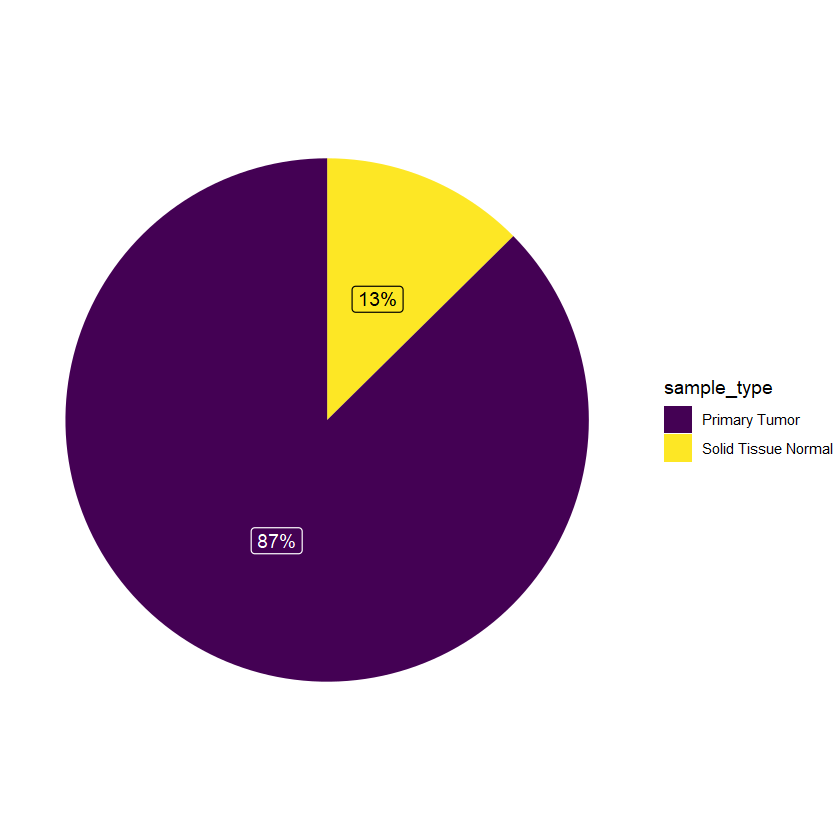

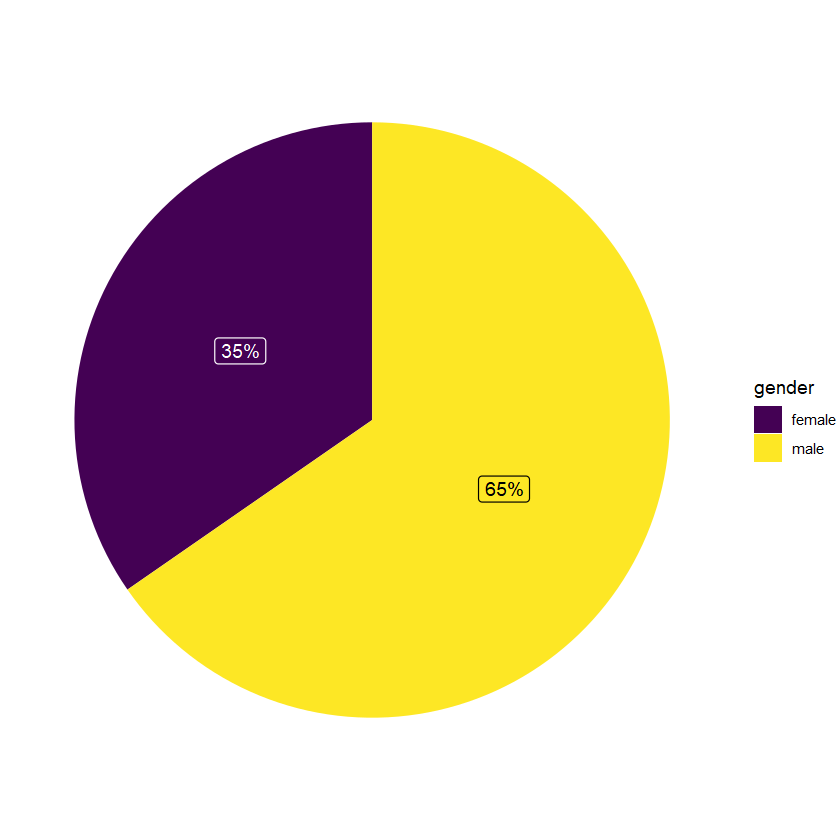

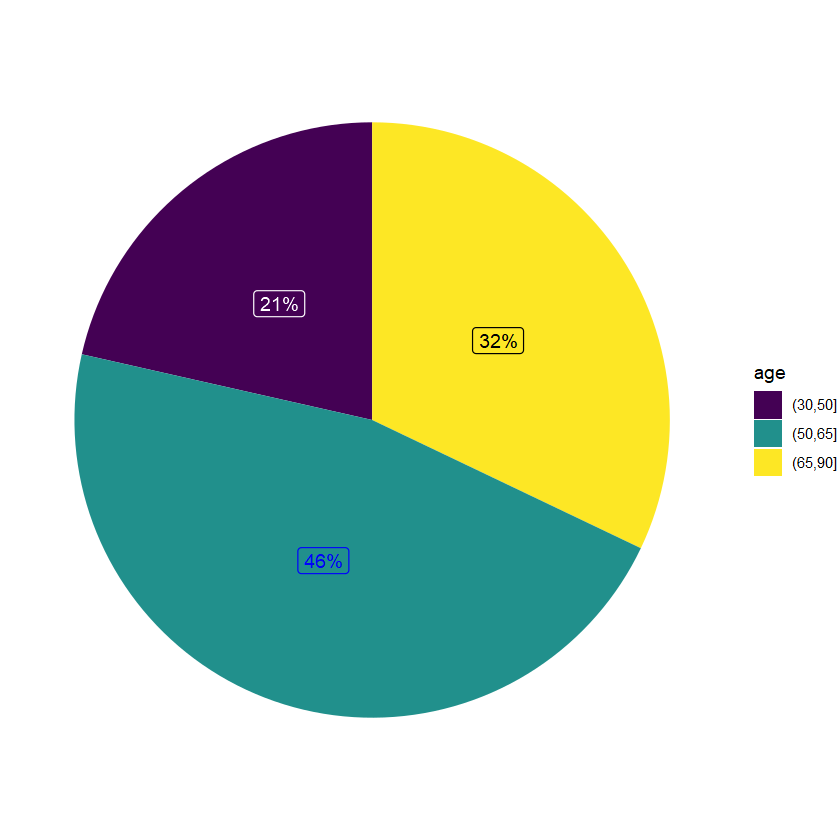

In [74]:
# explore the sample types percentage, gender and age range
df_type <- meta %>% 
  dplyr::group_by(sample_type) %>% # Variable to be transformed
  dplyr::count() %>% 
  dplyr::ungroup() %>% 
  dplyr::mutate(perc = `n` / sum(`n`)) %>% 
  dplyr::arrange(perc) %>%
  dplyr::mutate(labels = scales::percent(perc))

ggplot(df_type, aes(x = "", y = perc, fill = sample_type)) +
  geom_col() +
  geom_label(aes(label = labels), color = c("black", "white"),
            position = position_stack(vjust = 0.5),
            show.legend = FALSE) +
  guides(fill = guide_legend(title = "sample_type")) +
  scale_fill_viridis_d() +
  coord_polar(theta = "y") + 
  theme_void()

df_gender <- meta %>% 
  dplyr::group_by(gender) %>% # Variable to be transformed
  dplyr::count() %>% 
  dplyr::ungroup() %>% 
  dplyr::mutate(perc = `n` / sum(`n`)) %>% 
  dplyr::arrange(perc) %>%
  dplyr::mutate(labels = scales::percent(perc))

ggplot(df_gender, aes(x = "", y = perc, fill = gender)) +
  geom_col() +
  geom_label(aes(label = labels), color = c("white", "black"),
            position = position_stack(vjust = 0.5),
            show.legend = FALSE) +
  guides(fill = guide_legend(title = "gender")) +
  scale_fill_viridis_d() +
  coord_polar(theta = "y") + 
  theme_void()


df_age <- meta %>% mutate(age_bins = cut(age_at_index, breaks=c(30, 50, 65, 90)))

df_age <- df_age %>% 
  dplyr::group_by(age_bins) %>% # Variable to be transformed
  dplyr::count() %>% 
  dplyr::ungroup() %>% 
  dplyr::mutate(perc = `n` / sum(`n`)) %>% 
  dplyr::arrange(perc) %>%
  dplyr::mutate(labels = scales::percent(perc))

ggplot(df_age, aes(x = "", y = perc, fill = age_bins)) +
  geom_col() +
  geom_label(aes(label = labels), color = c("white", "black", "blue"),
            position = position_stack(vjust = 0.5),
            show.legend = FALSE) +
  guides(fill = guide_legend(title = "age")) +
  scale_fill_viridis_d() +
  coord_polar(theta = "y") + 
  theme_void()


Warning message:
"The dot-dot notation (`..count..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(count)` instead."


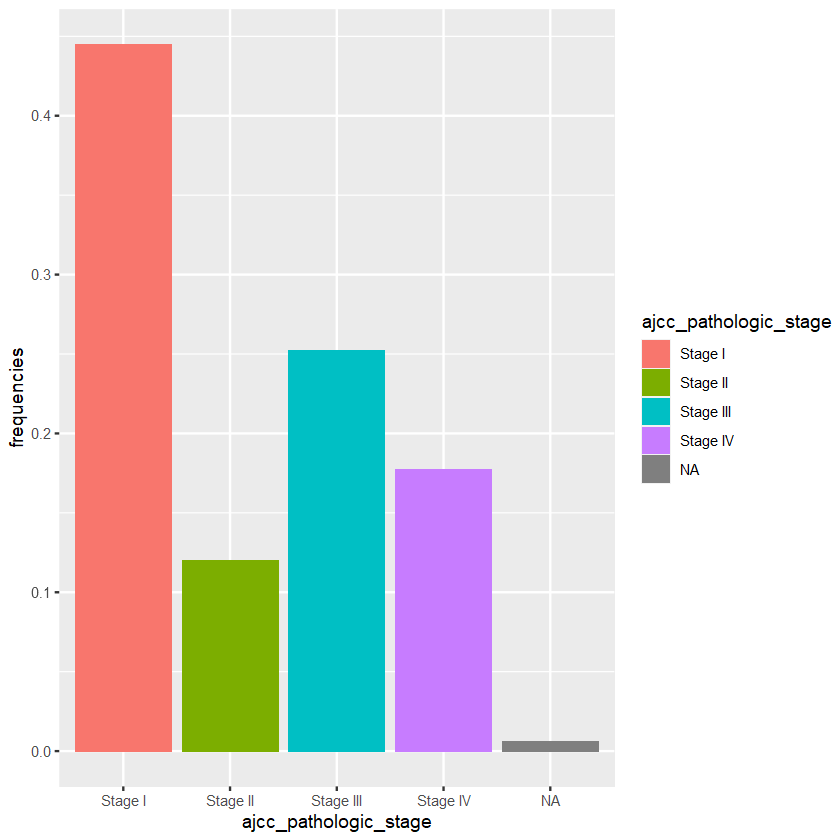

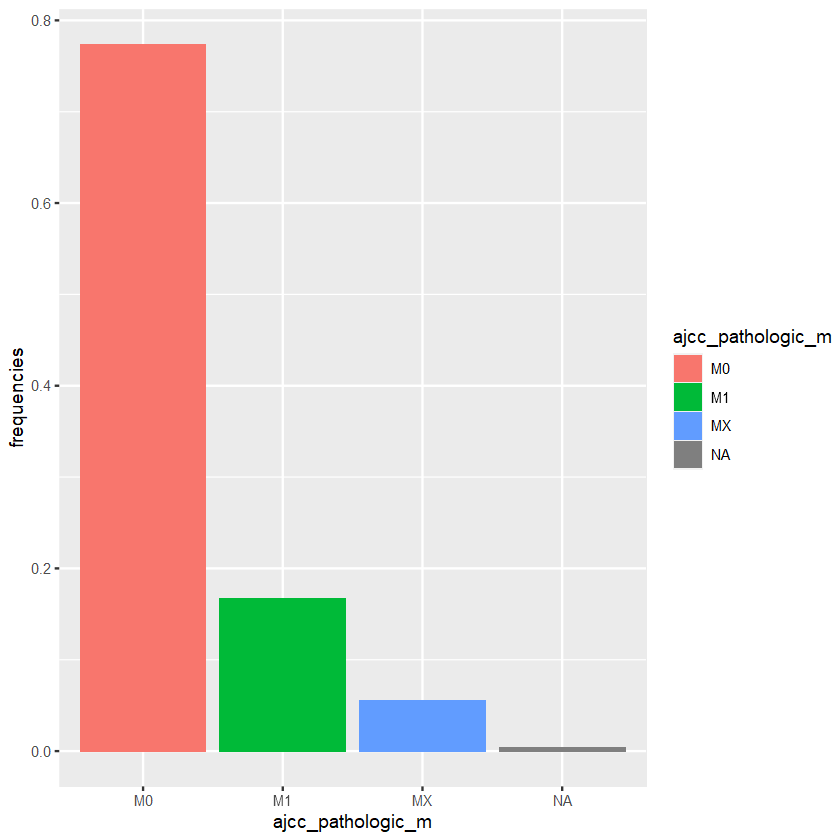

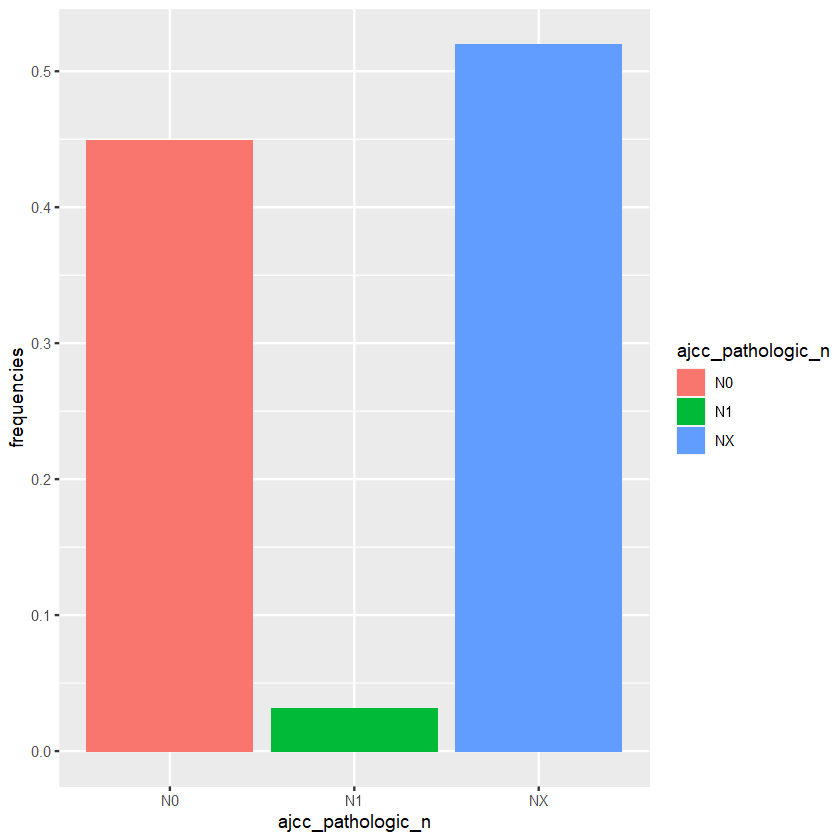

In [75]:
# percentges of metastatic, tumor satge and other tumor spreading satges n_satge
ggplot(meta, aes(x = ajcc_pathologic_stage)) +  
    geom_bar(aes(y = (..count..)/sum(..count..), fill = ajcc_pathologic_stage))+
  ylab("frequencies") 

ggplot(meta, aes(x = ajcc_pathologic_m)) +  
    geom_bar(aes(y = (..count..)/sum(..count..), fill = ajcc_pathologic_m))+
  ylab("frequencies")
 

ggplot(meta, aes(x = ajcc_pathologic_n)) +  
    geom_bar(aes(y = (..count..)/sum(..count..), fill = ajcc_pathologic_n))+
  ylab("frequencies")

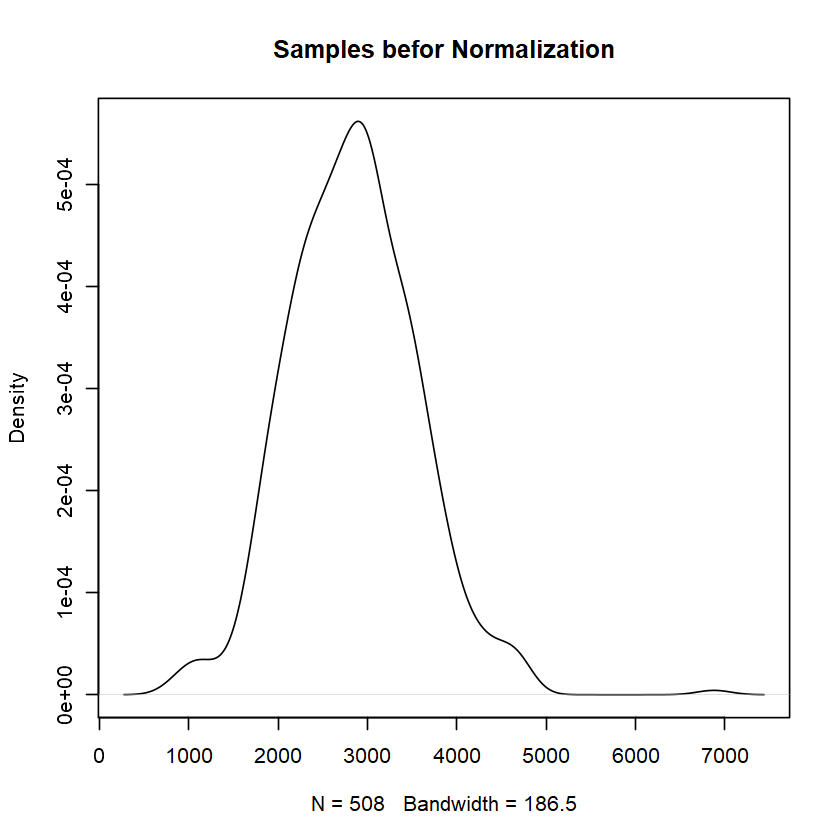

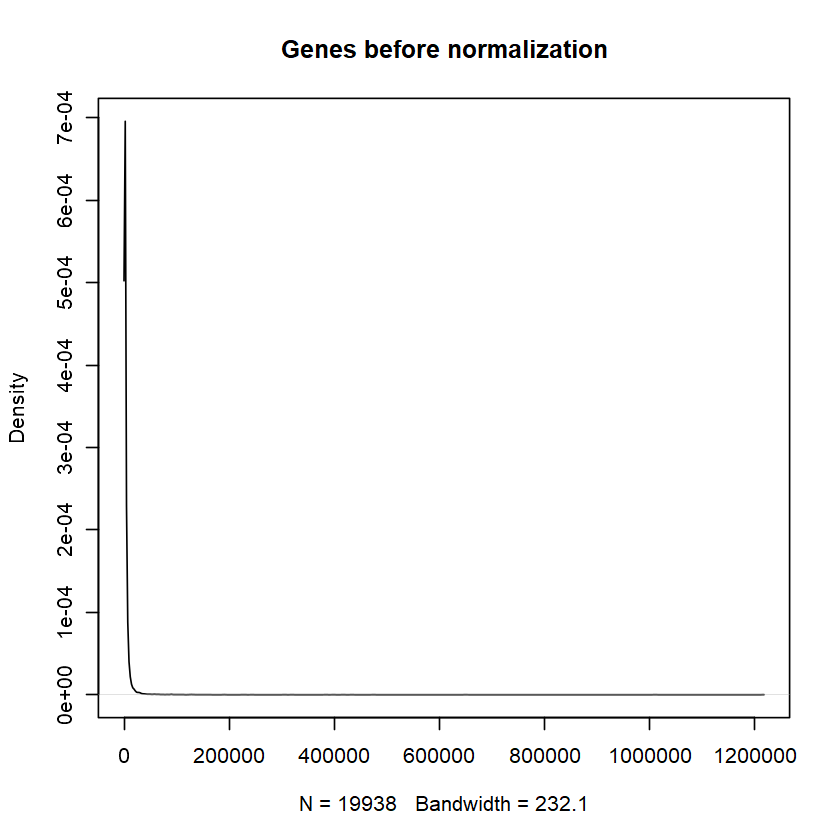

In [76]:
# plot the distribution of data before normalization samples and genes
plot(density(apply(exp_counts2, 2, mean, na.rm = TRUE)),main='Samples befor Normalization')
plot(density(apply(t(exp_counts2), 2, mean, na.rm = TRUE)),main='Genes before normalization')

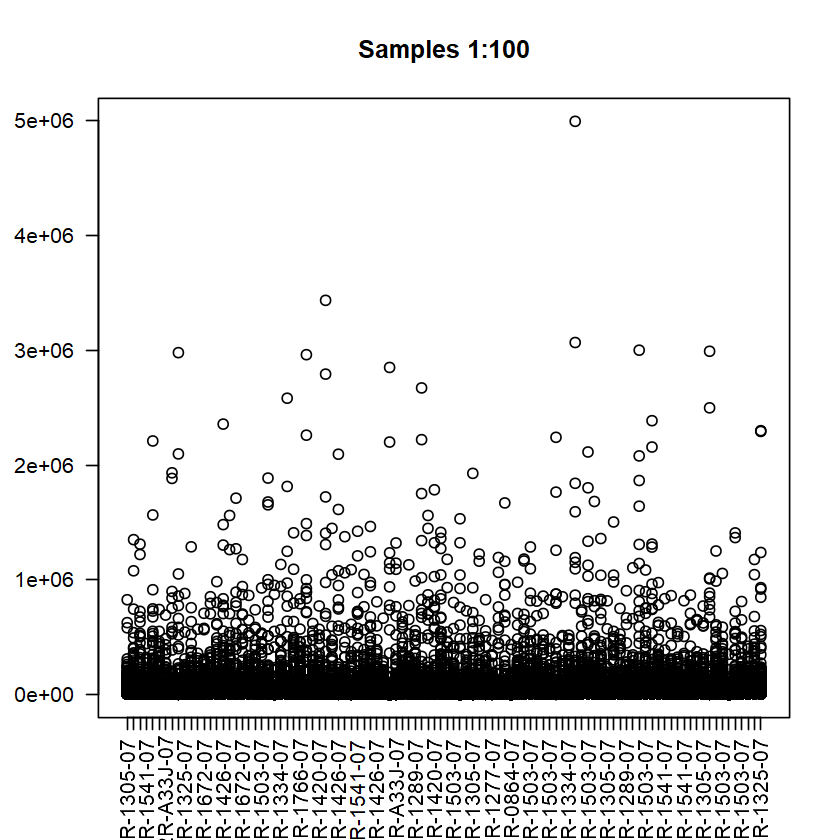

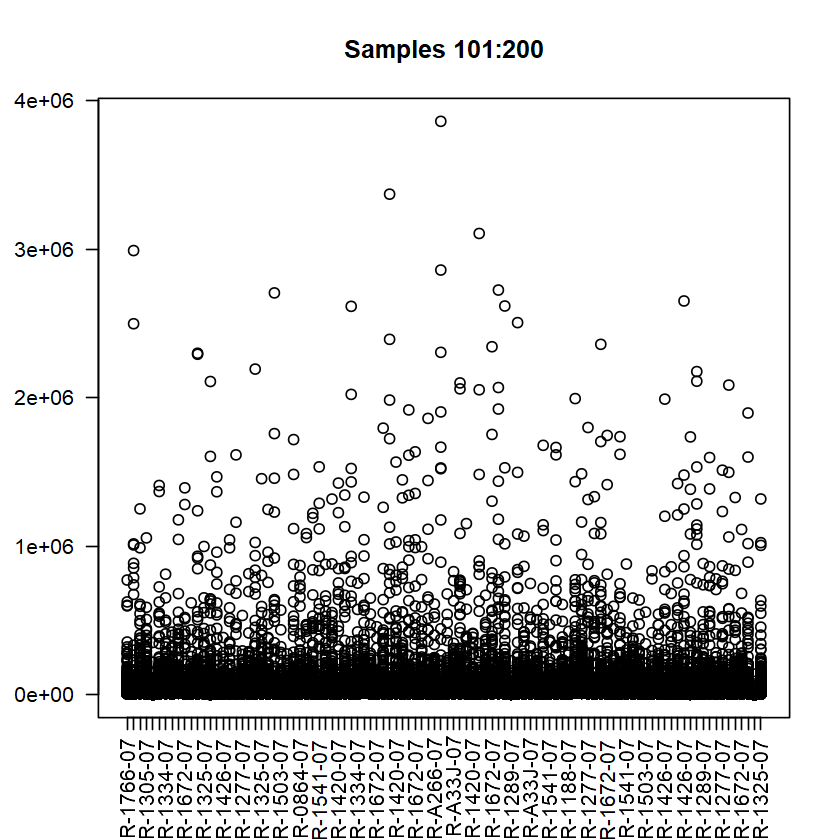

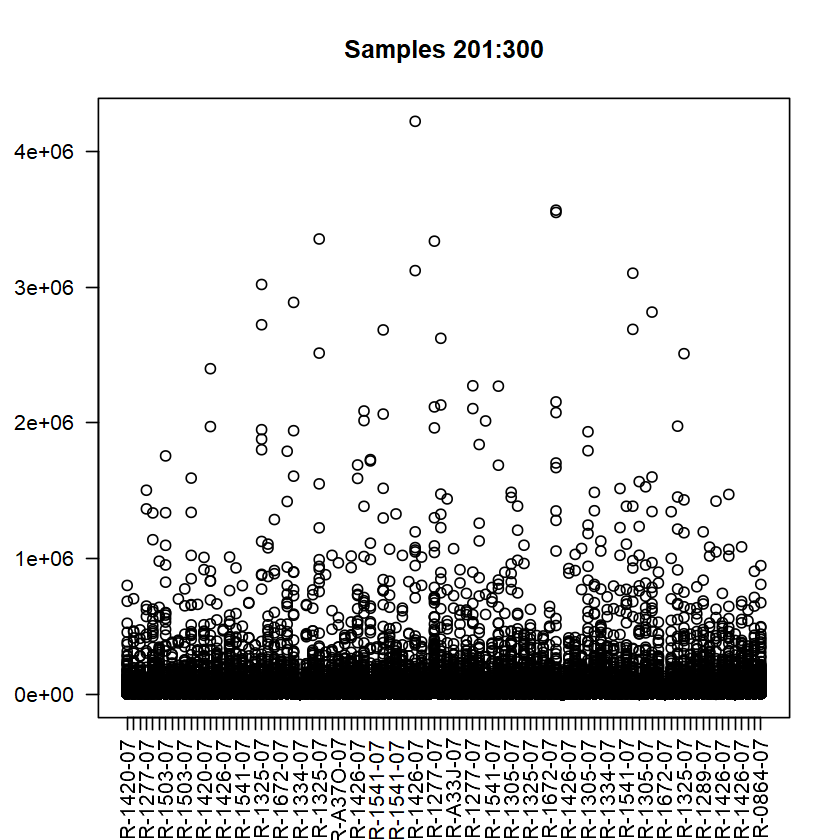

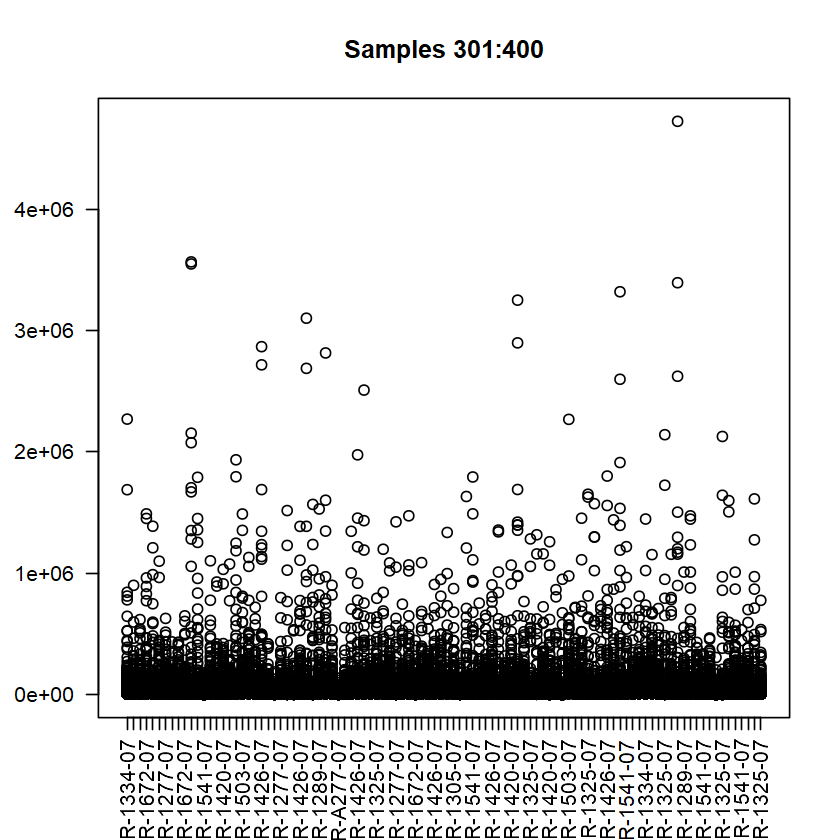

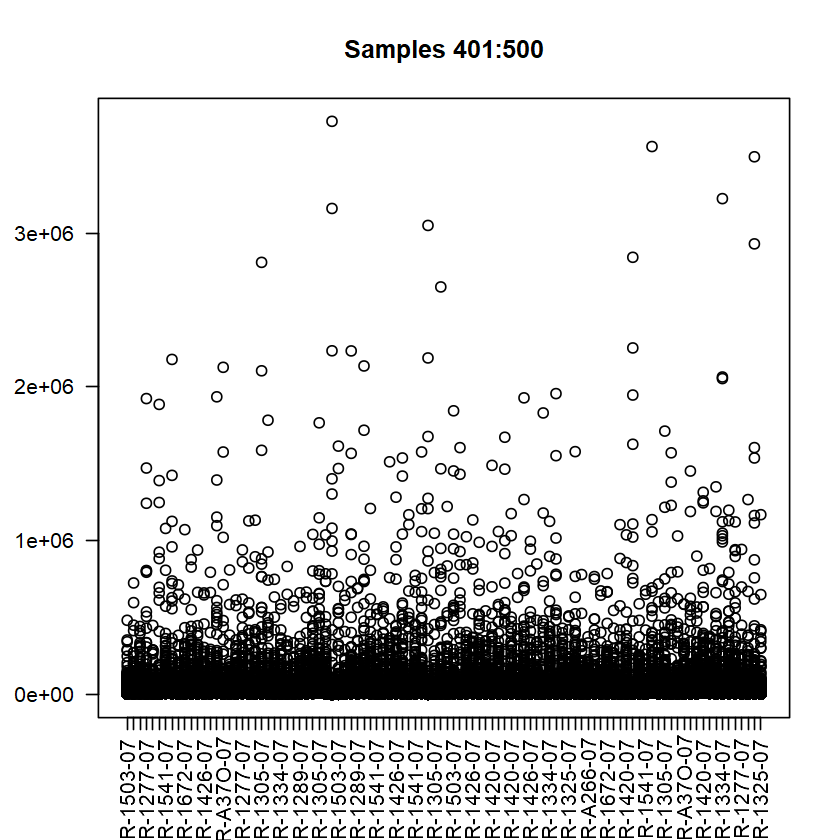

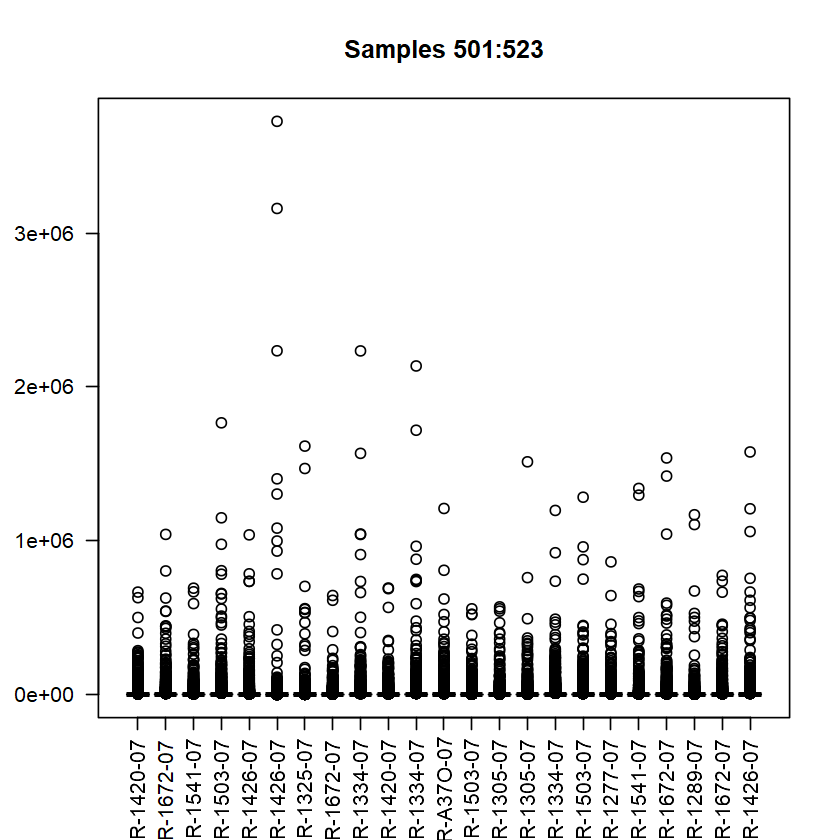

In [70]:
# boplot for the samples of raw data
boxplot(exp_counts2[,1:100], main="Samples 1:100", names=colnames(exp_counts2)[1:100],las=2,
       col = "lightgreen")
boxplot(exp_counts[,101:200], main="Samples 101:200", names=colnames(exp_counts2)[101:200],las=2,
       col = "lightgreen")
boxplot(exp_counts2[,201:300], main="Samples 201:300", names=colnames(exp_counts)[201:300],las=2,
       col = "lightgreen")
boxplot(exp_counts[,301:400], main="Samples 301:400", names=colnames(exp_counts)[301:400],las=2,
       col = "lightgreen")
boxplot(exp_counts2[,401:500], main="Samples 401:500", names=colnames(exp_counts)[401:500],las=2,
       col = "lightgreen")
boxplot(exp_counts[,501:523], main="Samples 501:523", names=colnames(exp_counts)[501:523],las=2,
       col = "lightgreen")


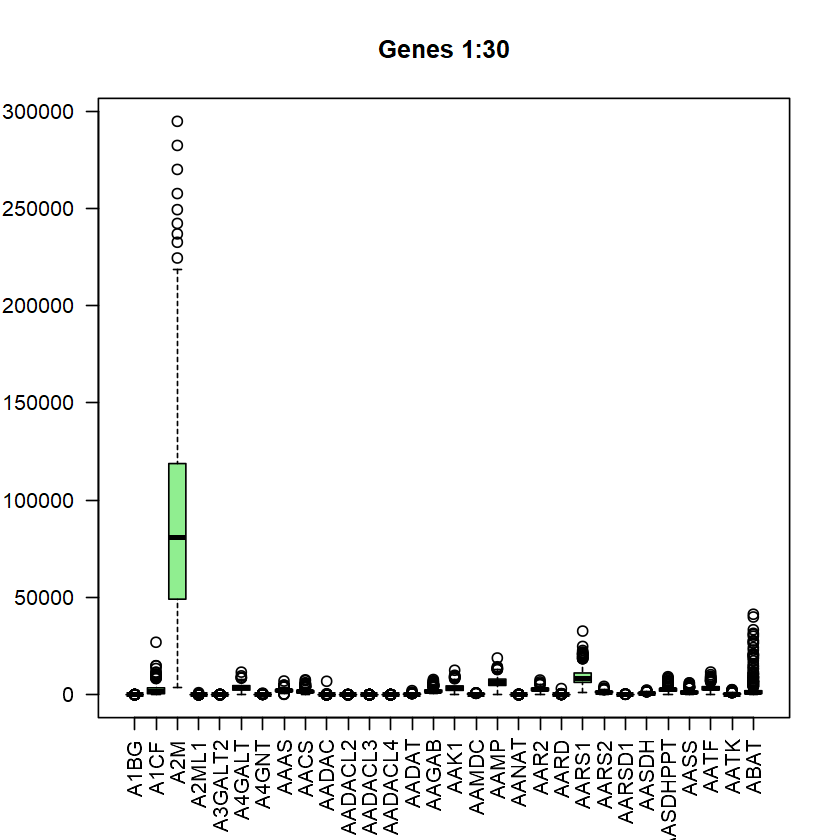

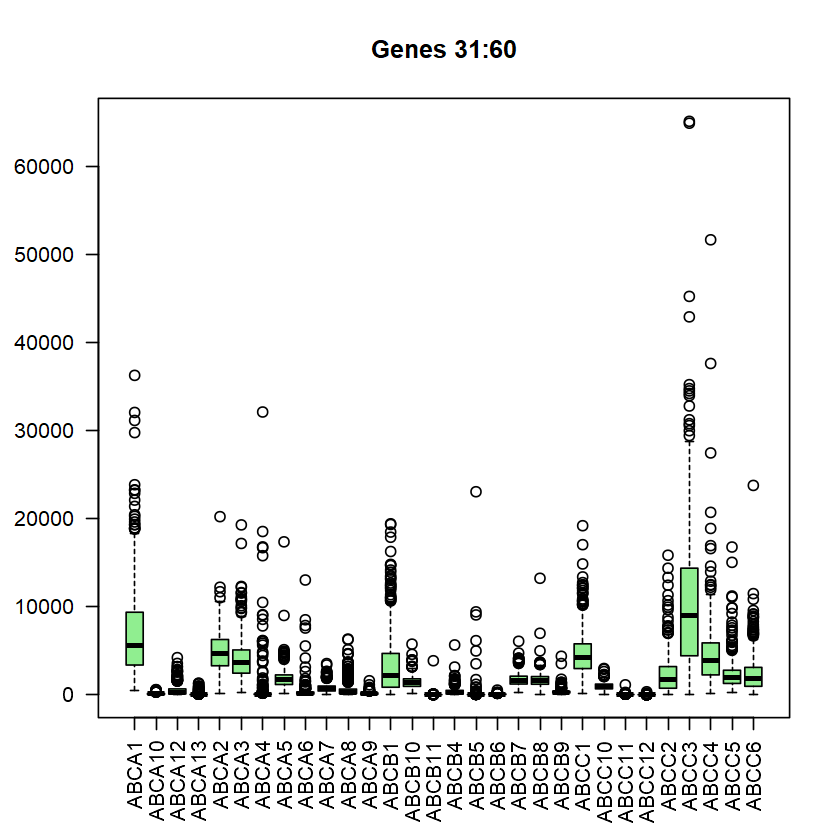

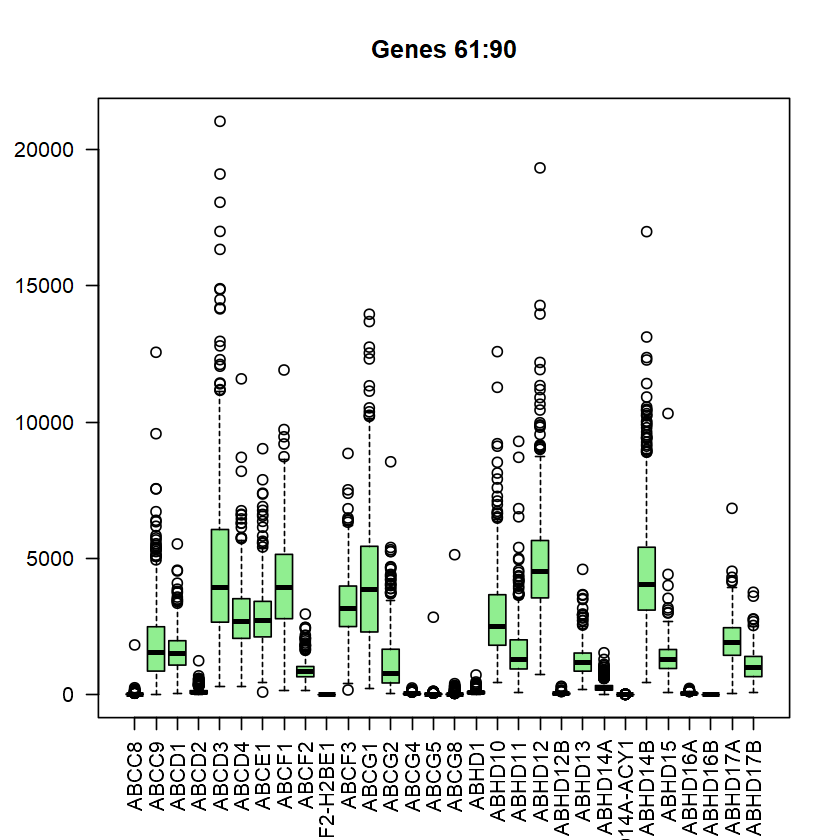

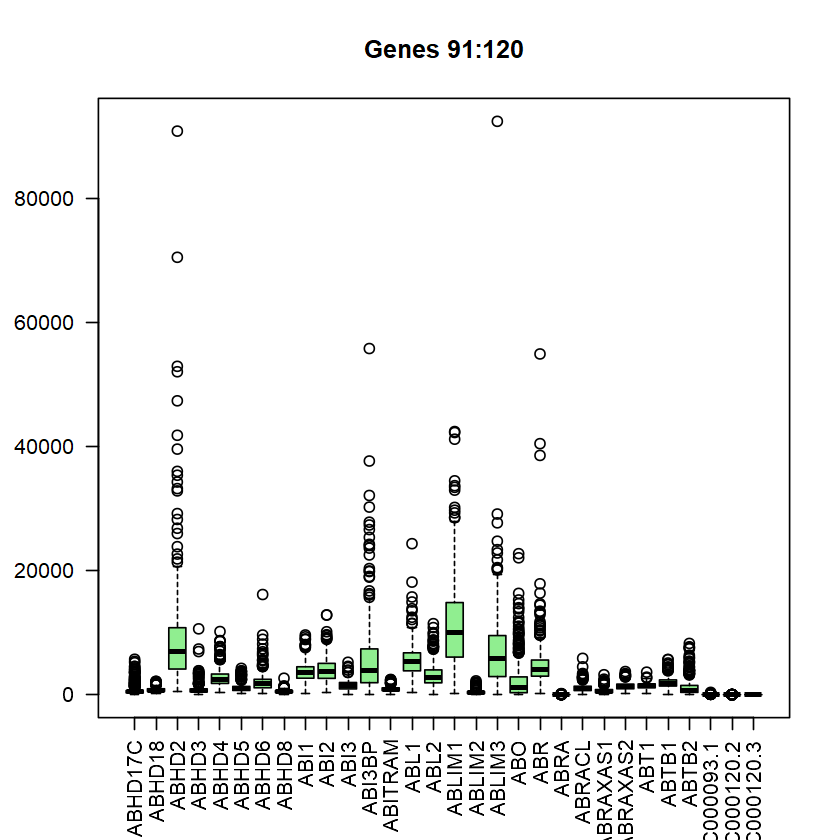

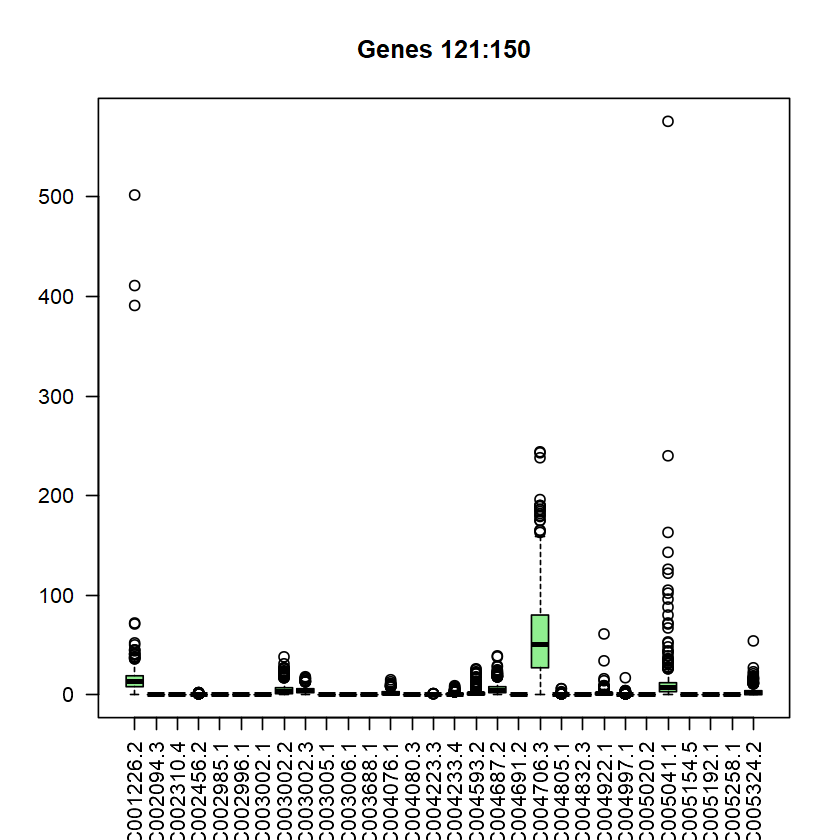

In [77]:
# boxplot of some genes from the raw data the first 150 genes
boxplot(t(exp_counts2)[,1:30], main="Genes 1:30", names=rownames(exp_counts2)[1:30],las=2,
       col = "lightgreen")
boxplot(t(exp_counts2)[,31:60], main="Genes 31:60", names=rownames(exp_counts2)[31:60],las=2,
       col = "lightgreen")
boxplot(t(exp_counts2)[,61:90], main="Genes 61:90", names=rownames(exp_counts)[61:90],las=2,
       col = "lightgreen")
boxplot(t(exp_counts2)[,91:120], main="Genes 91:120", names=rownames(exp_counts2)[91:120],las=2,
       col = "lightgreen")
boxplot(t(exp_counts2)[,121:150], main="Genes 121:150", names=rownames(exp_counts2)[121:150],las=2,
       col = "lightgreen")


In [78]:
# PCA of the raw data
raw.pca <- prcomp(t(exp_counts2))
summary(raw.pca)

Importance of components:
                             PC1       PC2       PC3       PC4       PC5
Standard deviation     1.273e+06 4.151e+05 3.576e+05 2.998e+05 2.765e+05
Proportion of Variance 6.011e-01 6.390e-02 4.744e-02 3.333e-02 2.836e-02
Cumulative Proportion  6.011e-01 6.650e-01 7.125e-01 7.458e-01 7.741e-01
                             PC6       PC7       PC8       PC9      PC10
Standard deviation     2.483e+05 2.247e+05 2.062e+05 2.000e+05 1.732e+05
Proportion of Variance 2.287e-02 1.873e-02 1.577e-02 1.484e-02 1.113e-02
Cumulative Proportion  7.970e-01 8.157e-01 8.315e-01 8.464e-01 8.575e-01
                            PC11      PC12      PC13      PC14      PC15
Standard deviation     1.654e+05 1.534e+05 1.382e+05 1.311e+05 1.247e+05
Proportion of Variance 1.014e-02 8.720e-03 7.080e-03 6.380e-03 5.770e-03
Cumulative Proportion  8.676e-01 8.763e-01 8.834e-01 8.898e-01 8.956e-01
                            PC16      PC17      PC18      PC19      PC20
Standard deviation     1.

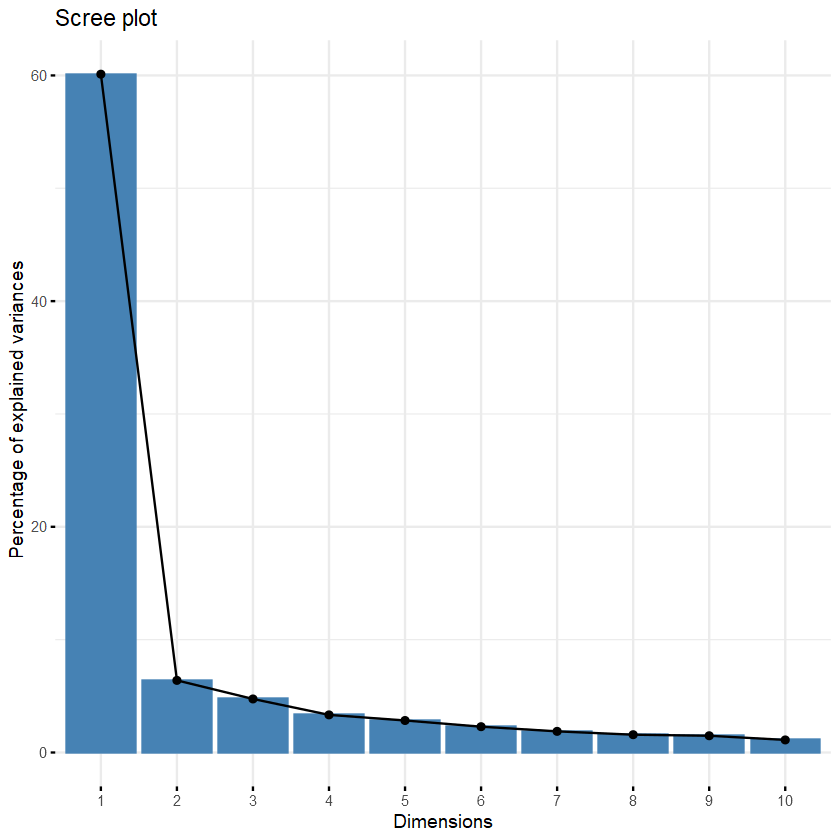

In [79]:
# percentage of explained variance by the pcs for raw data
fviz_eig(raw.pca, col.var="blue")


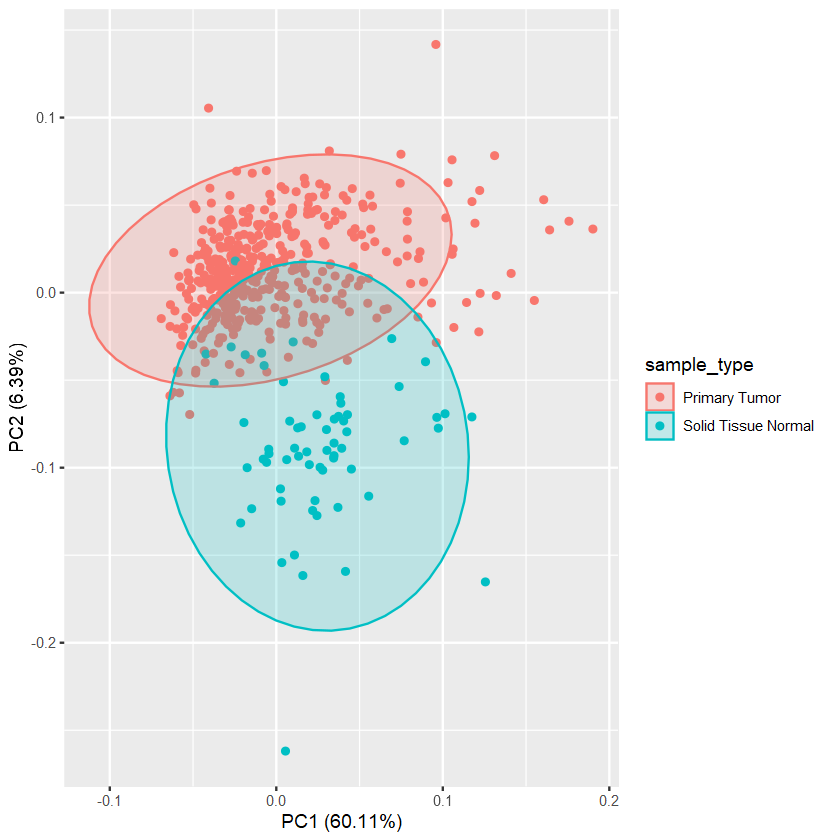

In [80]:
# plot the PCA of raw data
autoplot(raw.pca, frame = TRUE, frame.type= "norm", data=meta, colour="sample_type")


### Data cleaning and outlier detection

#### Use cpm(counts) for filtering 


In [36]:
# tpm data to be used for exploring the variance and other filtering steps
exp_cpm <- cpm(exp_counts2)
head(exp_cpm)

,TCGA-BP-4160-01A,TCGA-BP-4781-01A,TCGA-B0-4821-01A,TCGA-CJ-4872-01A,TCGA-B8-5553-01A,TCGA-BP-5176-01A,TCGA-CJ-5671-01A,TCGA-A3-A6NJ-01A,TCGA-B8-4153-01B,TCGA-B0-4847-01A,⋯,TCGA-BP-4971-01A,TCGA-B0-4945-01A,TCGA-CZ-5452-01A,TCGA-CZ-5452-11A,TCGA-AS-3777-01A,TCGA-DV-A4VX-01A,TCGA-B0-4838-01A,TCGA-B0-5399-01A,TCGA-BP-4163-01A,TCGA-AK-3451-01A
A1BG,0.000000e+00,1.804069e-02,0.05335825,0.1369545,3.599719e-02,2.872703e-02,1.669296e-01,1.181159e-01,0.0221019,0.2652043,⋯,0.3724482,0.3301054,5.234416e-02,0.04963938,0.3162783,0.10417158,0.1560966,0.1224919,0.1003454,0.00000000
A1CF,4.285315e+01,4.537234e+01,13.23284541,26.1069521,7.185038e+01,3.718715e+01,1.815823e+01,4.263984e+01,48.7788878,42.0469334,⋯,22.0890424,99.0756464,2.624187e+01,1.15825217,77.7182000,44.01249293,60.5459622,89.2265823,12.6936903,47.87615781
A2M,1.585991e+03,1.322383e+03,329.46939287,2291.5227414,2.767752e+03,1.965116e+03,3.078849e+03,1.927593e+03,2102.9292440,445.5673033,⋯,2311.2701904,1773.3044236,1.428053e+03,881.26443477,1517.1006672,233.99541361,1336.4208977,1558.2191550,1325.7380412,415.72950243
A2ML1,6.069851e-02,9.020346e-02,0.71144330,0.1711931,5.399578e-02,4.309055e-02,1.112864e-01,1.968599e-02,0.1105095,0.3134232,⋯,0.4727227,0.1760562,1.744805e-02,0.04963938,0.1868917,0.05208579,0.3317052,0.1399907,0.1003454,0.07298195
A3GALT2,1.517463e-01,1.804069e-02,0.14228866,0.0000000,5.399578e-02,8.618110e-02,9.273866e-02,1.378019e-01,0.0442038,0.2410948,⋯,0.4154230,0.3521125,5.234416e-02,0.00000000,0.0000000,0.00000000,0.3902415,0.1924872,0.2006908,0.00000000
A4GALT,5.253456e+01,4.668931e+01,116.17869112,51.1696261,9.483459e+01,9.441140e+01,8.585745e+01,9.240601e+01,109.7138193,88.0478216,⋯,34.1076588,73.0413306,6.115542e+01,26.55706755,3.2346643,67.03441231,44.6631349,72.5501883,60.5333490,57.12053787


### 1- Remove Zero variance genes

In [37]:
# get the variance across genes
gene_var=apply(exp_cpm, 1, var, na.rm = T)
gene_var

A1BG             A1CF              A2M            A2ML1 
    2.171621e-02     1.619848e+03     6.280323e+05     2.843045e+00 
         A3GALT2           A4GALT            A4GNT             AAAS 
    2.950773e-02     8.161282e+02     2.084659e+00     1.346493e+02 
            AACS            AADAC          AADACL2          AADACL3 
    1.761350e+02     1.720437e+01     1.622448e-03     1.167297e-03 
         AADACL4            AADAT            AAGAB             AAK1 
    2.259864e-02     6.836939e+00     2.368465e+02     9.672138e+02 
           AAMDC             AAMP            AANAT             AAR2 
    3.571357e+00     9.389817e+02     2.039023e-01     9.309381e+01 
            AARD            AARS1            AARS2           AARSD1 
    8.597783e+00     2.806749e+03     6.007631e+01     2.497170e+00 
           AASDH         AASDHPPT             AASS             AATF 
    2.080743e+01     2.452478e+02     2.318684e+02     3.172656e+02 
            AATK             ABAT            ABCA1           ABCA10 
    3.357479e+01     7.675585e+03     7.330764e+03     7.068738e+00 
          ABCA12           ABCA13            ABCA2            ABCA3 
    1.007645e+02     6.029691e+00     1.390864e+03     1.404991e+03 
           ABCA4            ABCA5            ABCA6            ABCA7 
    9.685711e+02     7.672666e+02     1.935529e+02     1.746882e+02 
           ABCA8            ABCA9            ABCB1           ABCB10 
    2.147298e+02     8.407687e+00     3.526099e+03     8.715691e+01 
          ABCB11            ABCB4            ABCB5            ABCB6 
    6.059489e+00     5.026977e+01     3.771837e+02     8.659396e-01 
           ABCB7            ABCB8            ABCB9            ABCC1 
    8.092887e+01     1.785125e+02     3.515029e+01     1.486343e+03 
          ABCC10           ABCC11           ABCC12            ABCC2 
    5.141746e+01     1.212095e+00     7.962058e-02     1.317114e+03 
           ABCC3            ABCC4            ABCC5            ABCC6 
    2.090476e+04     3.369161e+03     7.631732e+02     1.141933e+03 
           ABCC8            ABCC9            ABCD1            ABCD2 
    2.345367e+00     5.587305e+02     1.541592e+02     4.255089e+00 
           ABCD3            ABCD4            ABCE1            ABCF1 
    1.685772e+03     3.548163e+02     2.617559e+02     4.523068e+02 
           ABCF2      ABCF2-H2BE1            ABCF3            ABCG1 
    3.363587e+01     0.000000e+00     1.738572e+02     1.210055e+03 
           ABCG2            ABCG4            ABCG5            ABCG8 
    3.533270e+02     2.583181e-01     4.209528e+00     1.066735e+01 
           ABHD1           ABHD10           ABHD11           ABHD12 
    1.889985e+00     5.803175e+02     2.979317e+02     1.032875e+03 
         ABHD12B           ABHD13          ABHD14A     ABHD14A-ACY1 
    7.397532e-01     7.375804e+01     1.462962e+01     1.920730e-03 
         ABHD14B           ABHD15          ABHD16A          ABHD16B 
    1.191860e+03     7.494971e+01     3.082236e-01     0.000000e+00 
         ABHD17A          ABHD17B          ABHD17C           ABHD18 
    2.071789e+02     5.277996e+01     1.416424e+02     3.451889e+01 
           ABHD2            ABHD3            ABHD4            ABHD5 
    1.995778e+04     2.038735e+02     4.414652e+02     7.094453e+01 
           ABHD6            ABHD8             ABI1             ABI2 
    3.804151e+02     1.419660e+01     2.968465e+02     5.862901e+02 
            ABI3           ABI3BP          ABITRAM             ABL1 
    1.604563e+02     8.956769e+03     1.947307e+01     1.136318e+03 
            ABL2           ABLIM1           ABLIM2           ABLIM3 
    8.091974e+02     8.464722e+03     4.784816e+01     7.769346e+03 
             ABO              ABR             ABRA           ABRACL 
    2.305100e+03     4.253113e+03     2.420503e-01     1.124751e+02 
        ABRAXAS1         ABRAXAS2             ABT1            ABTB1 
    3.389318e+01     4.521709e+01     4.268049e+01     2.211517e+02 
          

In [38]:
# get names of the zero variance genes
zeroVargene <- (gene_var == 0 | is.na(gene_var))
sum(zeroVargene)

[1] 416

In [39]:
# remove zero variance genes from expression data
exp_cpm <- exp_cpm[!zeroVargene,]
dim(exp_cpm)
head(exp_cpm)

[1] 19522   590

,TCGA-BP-4160-01A,TCGA-BP-4781-01A,TCGA-B0-4821-01A,TCGA-CJ-4872-01A,TCGA-B8-5553-01A,TCGA-BP-5176-01A,TCGA-CJ-5671-01A,TCGA-A3-A6NJ-01A,TCGA-B8-4153-01B,TCGA-B0-4847-01A,⋯,TCGA-BP-4971-01A,TCGA-B0-4945-01A,TCGA-CZ-5452-01A,TCGA-CZ-5452-11A,TCGA-AS-3777-01A,TCGA-DV-A4VX-01A,TCGA-B0-4838-01A,TCGA-B0-5399-01A,TCGA-BP-4163-01A,TCGA-AK-3451-01A
A1BG,0.000000e+00,1.804069e-02,0.05335825,0.1369545,3.599719e-02,2.872703e-02,1.669296e-01,1.181159e-01,0.0221019,0.2652043,⋯,0.3724482,0.3301054,5.234416e-02,0.04963938,0.3162783,0.10417158,0.1560966,0.1224919,0.1003454,0.00000000
A1CF,4.285315e+01,4.537234e+01,13.23284541,26.1069521,7.185038e+01,3.718715e+01,1.815823e+01,4.263984e+01,48.7788878,42.0469334,⋯,22.0890424,99.0756464,2.624187e+01,1.15825217,77.7182000,44.01249293,60.5459622,89.2265823,12.6936903,47.87615781
A2M,1.585991e+03,1.322383e+03,329.46939287,2291.5227414,2.767752e+03,1.965116e+03,3.078849e+03,1.927593e+03,2102.9292440,445.5673033,⋯,2311.2701904,1773.3044236,1.428053e+03,881.26443477,1517.1006672,233.99541361,1336.4208977,1558.2191550,1325.7380412,415.72950243
A2ML1,6.069851e-02,9.020346e-02,0.71144330,0.1711931,5.399578e-02,4.309055e-02,1.112864e-01,1.968599e-02,0.1105095,0.3134232,⋯,0.4727227,0.1760562,1.744805e-02,0.04963938,0.1868917,0.05208579,0.3317052,0.1399907,0.1003454,0.07298195
A3GALT2,1.517463e-01,1.804069e-02,0.14228866,0.0000000,5.399578e-02,8.618110e-02,9.273866e-02,1.378019e-01,0.0442038,0.2410948,⋯,0.4154230,0.3521125,5.234416e-02,0.00000000,0.0000000,0.00000000,0.3902415,0.1924872,0.2006908,0.00000000
A4GALT,5.253456e+01,4.668931e+01,116.17869112,51.1696261,9.483459e+01,9.441140e+01,8.585745e+01,9.240601e+01,109.7138193,88.0478216,⋯,34.1076588,73.0413306,6.115542e+01,26.55706755,3.2346643,67.03441231,44.6631349,72.5501883,60.5333490,57.12053787


### 2- Remove genes with low counts

In [40]:
# filter rows to keep only rows that have at least 10 reads total
keep <- rowSums(exp_cpm) >= 10
exp_cpm <- exp_cpm[keep,]
dim(exp_cpm)

[1] 18151   590

### 3- Remove 10% genes of lowest variations

In [41]:
# get the variance across genes and store this in data frame
gene_var2=apply(exp_cpm, 1, var, na.rm = T)
gene_var2
gene_var_df = as.data.frame(gene_var2)
gene_var_df["gene"] = rownames(gene_var_df)
rownames(gene_var_df) = c(1:dim(gene_var_df)[1])
gene_var_df

A1BG            A1CF             A2M           A2ML1         A3GALT2 
   2.171621e-02    1.619848e+03    6.280323e+05    2.843045e+00    2.950773e-02 
         A4GALT           A4GNT            AAAS            AACS           AADAC 
   8.161282e+02    2.084659e+00    1.346493e+02    1.761350e+02    1.720437e+01 
        AADACL4           AADAT           AAGAB            AAK1           AAMDC 
   2.259864e-02    6.836939e+00    2.368465e+02    9.672138e+02    3.571357e+00 
           AAMP           AANAT            AAR2            AARD           AARS1 
   9.389817e+02    2.039023e-01    9.309381e+01    8.597783e+00    2.806749e+03 
          AARS2          AARSD1           AASDH        AASDHPPT            AASS 
   6.007631e+01    2.497170e+00    2.080743e+01    2.452478e+02    2.318684e+02 
           AATF            AATK            ABAT           ABCA1          ABCA10 
   3.172656e+02    3.357479e+01    7.675585e+03    7.330764e+03    7.068738e+00 
         ABCA12          ABCA13           ABCA2           ABCA3           ABCA4 
   1.007645e+02    6.029691e+00    1.390864e+03    1.404991e+03    9.685711e+02 
          ABCA5           ABCA6           ABCA7           ABCA8           ABCA9 
   7.672666e+02    1.935529e+02    1.746882e+02    2.147298e+02    8.407687e+00 
          ABCB1          ABCB10          ABCB11           ABCB4           ABCB5 
   3.526099e+03    8.715691e+01    6.059489e+00    5.026977e+01    3.771837e+02 
          ABCB6           ABCB7           ABCB8           ABCB9           ABCC1 
   8.659396e-01    8.092887e+01    1.785125e+02    3.515029e+01    1.486343e+03 
         ABCC10          ABCC11          ABCC12           ABCC2           ABCC3 
   5.141746e+01    1.212095e+00    7.962058e-02    1.317114e+03    2.090476e+04 
          ABCC4           ABCC5           ABCC6           ABCC8           ABCC9 
   3.369161e+03    7.631732e+02    1.141933e+03    2.345367e+00    5.587305e+02 
          ABCD1           ABCD2           ABCD3           ABCD4           ABCE1 
   1.541592e+02    4.255089e+00    1.685772e+03    3.548163e+02    2.617559e+02 
          ABCF1           ABCF2           ABCF3           ABCG1           ABCG2 
   4.523068e+02    3.363587e+01    1.738572e+02    1.210055e+03    3.533270e+02 
          ABCG4           ABCG5           ABCG8           ABHD1          ABHD10 
   2.583181e-01    4.209528e+00    1.066735e+01    1.889985e+00    5.803175e+02 
         ABHD11          ABHD12         ABHD12B          ABHD13         ABHD14A 
   2.979317e+02    1.032875e+03    7.397532e-01    7.375804e+01    1.462962e+01 
   ABHD14A-ACY1         ABHD14B          ABHD15         ABHD16A         ABHD17A 
   1.920730e-03    1.191860e+03    7.494971e+01    3.082236e-01    2.071789e+02 
        ABHD17B         ABHD17C          ABHD18           ABHD2           ABHD3 
   5.277996e+01    1.416424e+02    3.451889e+01    1.995778e+04    2.038735e+02 
          ABHD4           ABHD5           ABHD6           ABHD8            ABI1 
   4.414652e+02    7.094453e+01    3.804151e+02    1.419660e+01    2.968465e+02 
           ABI2            ABI3          ABI3BP         ABITRAM            ABL1 
   5.862901e+02    1.604563e+02    8.956769e+03    1.947307e+01    1.136318e+03 
           ABL2          ABLIM1          ABLIM2          ABLIM3             ABO 
   8.091974e+02    8.464722e+03    4.784816e+01    7.769346e+03    2.305100e+03 
            ABR            ABRA          ABRACL        ABRAXAS1        ABRAXAS2 
   4.253113e+03    2.420503e-01    1.124751e+02    3.389318e+01    4.521709e+01 
           ABT1           ABTB1           ABTB2      AC000093.1      AC001226.2 
   4.268049e+01    2.211517e+02    3.917443e+02    2.626686e-01    2.731420e+00 
     AC003002.2      AC003002.3      AC004076.1      AC004593.2      AC004687.2 
   8.137509e-02    3.364729e-03    1.820500e-03    4.516896e-03    2.757166e-02 
     AC004706.3      AC004922.1      AC005041.1      AC005324.2      AC005551.1 
   6.881880e-01    1.960450e-02    3.35856

,gene_var2,gene
,<dbl>,<chr>
1,2.171621e-02,A1BG
2,1.619848e+03,A1CF
3,6.280323e+05,A2M
4,2.843045e+00,A2ML1
5,2.950773e-02,A3GALT2
6,8.161282e+02,A4GALT
7,2.084659e+00,A4GNT
8,1.346493e+02,AAAS
9,1.761350e+02,AACS


In [42]:
# ordering the var_df by variance from low to high
gene_var_df = gene_var_df[order(gene_var_df$gene_var2),]
gene_var_df 

,gene_var2,gene
,<dbl>,<chr>
9006,0.0005952944,MDP1
6144,0.0006020793,GJA9
11807,0.0006178453,POTEJ
182,0.0006568348,AC092647.5
11850,0.0007092939,PPIAL4A
1905,0.0007517294,C16orf46
15502,0.0007543346,TEN1
10651,0.0007594680,OR14L1P
9193,0.0007800191,MIF


In [43]:
# remove 10% of the genes of lowest variation
gene_var_more10 = gene_var_df[as.integer(0.10*dim(gene_var_df)[1]):dim(gene_var_df)[1],]
dim(gene_var_df)
dim(gene_var_more10)
head(gene_var_more10)

[1] 18151     2

[1] 16337     2

,gene_var2,gene
,<dbl>,<chr>
2403,0.2550671,CCDC105
8276,0.2553838,LCTL
8503,0.2558505,LRIT2
789,0.2562284,ANGPTL6
12975,0.2569211,RLN2
3260,0.2576566,CLEC4C


In [45]:
#gene_var_more10$gene

In [46]:
# remove the 10% with lowest variations from exp cpm data
exp_cpm <- exp_cpm[gene_var_more10$gene,]
dim(exp_cpm)
head(exp_cpm)

[1] 16337   590

,TCGA-BP-4160-01A,TCGA-BP-4781-01A,TCGA-B0-4821-01A,TCGA-CJ-4872-01A,TCGA-B8-5553-01A,TCGA-BP-5176-01A,TCGA-CJ-5671-01A,TCGA-A3-A6NJ-01A,TCGA-B8-4153-01B,TCGA-B0-4847-01A,⋯,TCGA-BP-4971-01A,TCGA-B0-4945-01A,TCGA-CZ-5452-01A,TCGA-CZ-5452-11A,TCGA-AS-3777-01A,TCGA-DV-A4VX-01A,TCGA-B0-4838-01A,TCGA-B0-5399-01A,TCGA-BP-4163-01A,TCGA-AK-3451-01A
CCDC105,0.00000000,0.01804069,0.00000000,0.00000000,0.00000000,0.00000000,0.01854773,0.00000000,0.0000000,0.07232844,⋯,0.01432493,0.00000000,0.00000000,0.0000000,0.01437629,0.02604290,0.01951207,0.00000000,0.00000000,0.00000000
LCTL,0.03034926,0.34277313,0.30236340,0.13695450,0.07199437,0.01436352,0.09273866,0.09842993,0.0442038,0.48218960,⋯,0.34379833,0.26408435,0.08724026,0.0000000,0.10063400,0.18230027,0.11707244,0.03499768,0.30103613,0.04865463
LRIT2,0.06069851,0.00000000,0.08893041,0.03423863,0.01799859,0.04309055,0.22257279,0.05905796,0.5083436,0.24109480,⋯,0.01432493,0.00000000,0.05234416,0.0000000,0.04312886,0.28647185,0.03902415,0.06999536,0.00000000,0.00000000
ANGPTL6,0.12139703,0.03608138,0.42686598,0.20543175,0.05399578,0.11490813,0.31531146,0.27560379,0.1105095,0.36164220,⋯,0.42974791,0.11003515,0.57578573,0.8604159,4.41351968,0.36460053,0.27316902,0.47246866,0.27594979,0.07298195
RLN2,0.48558810,0.48709866,0.17786083,0.41086351,0.95392543,0.28727034,0.16692959,0.47246364,0.4862417,0.94026973,⋯,0.10027451,0.44014059,0.17448053,1.8035641,0.12938657,0.07812869,0.31219317,0.43747099,0.05017269,0.07298195
CLEC4C,0.03034926,0.01804069,0.07114433,0.15407382,0.10799156,0.02872703,0.11128640,0.07874394,0.0000000,0.07232844,⋯,0.11459944,0.02200703,0.06979221,0.0000000,0.02875257,0.02604290,0.15609658,0.10499304,0.02508634,0.00000000


In [148]:
# apply all previous filtering on raw exp data
exp_counts3 <- exp_counts2[rownames(exp_cpm),]
dim(exp_counts3)

[1] 16337   590

### 4- Identification of highly correlated genes >0.99 and removal of them

In [48]:
# correlation between genes
cor_matrix <- cor(t(exp_counts3))                      # Correlation matrix
cor_matrix

,CCDC105,LCTL,LRIT2,ANGPTL6,RLN2,CLEC4C,EDDM3A,ABCG4,CNGA3,NFILZ,⋯,GPX3,MT-ND5,UMOD,MT-ND1,MT-ND2,MT-CO2,MT-CYB,MT-CO3,MT-ND4,MT-CO1
CCDC105,1.0000000000,0.098591777,0.0103947406,0.1528683652,-0.06286343,0.182614704,-0.0157404825,0.0955931796,0.204745376,0.8364137223,⋯,-0.087717457,-7.981781e-05,-0.04893397,-0.008046446,0.035166537,-0.003066444,0.001880106,-0.002170009,0.0164657401,-0.002365679
LCTL,0.0985917769,1.000000000,0.0070519944,0.1001425369,-0.03624135,0.005567381,-0.0191858556,0.0423979778,0.429555634,0.0880382052,⋯,-0.116682237,-6.596833e-02,-0.04841535,-0.087457937,-0.067563175,-0.034213515,-0.060546033,-0.071409519,-0.0414875094,-0.063668346
LRIT2,0.0103947406,0.007051994,1.0000000000,0.0036319989,-0.07173483,0.014235592,-0.0596398493,-0.0482018133,-0.015511777,0.0634011274,⋯,-0.056672049,5.988314e-02,-0.08391261,0.050955474,0.098292074,0.035566915,0.025575064,0.036775072,0.0680463503,0.020699241
ANGPTL6,0.1528683652,0.100142537,0.0036319989,1.0000000000,0.24336761,0.220216902,0.2438451887,0.4291375433,0.289738623,0.1583091453,⋯,-0.103317619,2.132297e-03,0.36132060,0.081214227,0.095534644,0.186850176,0.127710323,0.149255342,0.1303280971,0.068533983
RLN2,-0.0628634301,-0.036241354,-0.0717348308,0.2433676070,1.00000000,-0.049014389,0.3678356394,0.3697300984,0.235002107,-0.0625108757,⋯,-0.013182983,-4.890919e-02,0.40887719,-0.004431059,-0.066275276,-0.026524676,-0.037560205,0.030417318,-0.0748804198,-0.004544412
CLEC4C,0.1826147038,0.005567381,0.0142355917,0.2202169024,-0.04901439,1.000000000,-0.0419055641,0.0608408057,0.001473797,0.1996177964,⋯,-0.008025484,-5.957037e-02,-0.07938612,-0.093888822,-0.089538293,-0.093592098,-0.091420522,-0.081987971,-0.0905342095,-0.083949479
EDDM3A,-0.0157404825,-0.019185856,-0.0596398493,0.2438451887,0.36783564,-0.041905564,1.0000000000,0.2588683046,0.419333344,-0.0607493266,⋯,0.071575844,1.783647e-02,0.31126376,0.019772444,0.005296078,0.096310272,0.094827069,0.091072949,0.0388453924,0.061348328
ABCG4,0.0955931796,0.042397978,-0.0482018133,0.4291375433,0.36973010,0.060840806,0.2588683046,1.0000000000,0.257876094,0.0938120824,⋯,-0.159312715,1.119258e-01,0.37715882,0.133422369,0.106337048,0.108450482,0.100898116,0.106287243,0.1135770230,0.114533154
CNGA3,0.2047453762,0.429555634,-0.0155117774,0.2897386226,0.23500211,0.001473797,0.4193333435,0.2578760944,1.000000000,0.1360135305,⋯,-0.087129090,-7.478678e-02,0.27079449,-0.064889632,-0.066597111,-0.007793805,-0.016631333,-0.019263071,-0.0466102043,-0.043730825
NFILZ,0.8364137223,0.088038205,0.0634011274,0.1583091453,-0.06251088,0.199617796,-0.0607493266,0.0938120824,0.136013530,1.0000000000,⋯,-0.094332181,-1.151936e-02,-0.10170677,-0.036592770,0.025298610,-0.036935070,-0.031503971,-0.030389667,-0.0059368350,-0.038679703


In [49]:
cor_matrix_rm <- cor_matrix    # Modify correlation matrix
cor_matrix_rm[upper.tri(cor_matrix_rm)] = 0
diag(cor_matrix_rm) = 0
#cor_matrix_rm[!lower.tri(cor_matrix_rm)]
cor_matrix_rm


,CCDC105,LCTL,LRIT2,ANGPTL6,RLN2,CLEC4C,EDDM3A,ABCG4,CNGA3,NFILZ,⋯,GPX3,MT-ND5,UMOD,MT-ND1,MT-ND2,MT-CO2,MT-CYB,MT-CO3,MT-ND4,MT-CO1
CCDC105,0.0000000000,0.000000000,0.0000000000,0.0000000000,0.00000000,0.000000000,0.0000000000,0.0000000000,0.000000000,0.0000000000,⋯,0,0,0,0,0,0,0,0,0,0
LCTL,0.0985917769,0.000000000,0.0000000000,0.0000000000,0.00000000,0.000000000,0.0000000000,0.0000000000,0.000000000,0.0000000000,⋯,0,0,0,0,0,0,0,0,0,0
LRIT2,0.0103947406,0.007051994,0.0000000000,0.0000000000,0.00000000,0.000000000,0.0000000000,0.0000000000,0.000000000,0.0000000000,⋯,0,0,0,0,0,0,0,0,0,0
ANGPTL6,0.1528683652,0.100142537,0.0036319989,0.0000000000,0.00000000,0.000000000,0.0000000000,0.0000000000,0.000000000,0.0000000000,⋯,0,0,0,0,0,0,0,0,0,0
RLN2,-0.0628634301,-0.036241354,-0.0717348308,0.2433676070,0.00000000,0.000000000,0.0000000000,0.0000000000,0.000000000,0.0000000000,⋯,0,0,0,0,0,0,0,0,0,0
CLEC4C,0.1826147038,0.005567381,0.0142355917,0.2202169024,-0.04901439,0.000000000,0.0000000000,0.0000000000,0.000000000,0.0000000000,⋯,0,0,0,0,0,0,0,0,0,0
EDDM3A,-0.0157404825,-0.019185856,-0.0596398493,0.2438451887,0.36783564,-0.041905564,0.0000000000,0.0000000000,0.000000000,0.0000000000,⋯,0,0,0,0,0,0,0,0,0,0
ABCG4,0.0955931796,0.042397978,-0.0482018133,0.4291375433,0.36973010,0.060840806,0.2588683046,0.0000000000,0.000000000,0.0000000000,⋯,0,0,0,0,0,0,0,0,0,0
CNGA3,0.2047453762,0.429555634,-0.0155117774,0.2897386226,0.23500211,0.001473797,0.4193333435,0.2578760944,0.000000000,0.0000000000,⋯,0,0,0,0,0,0,0,0,0,0
NFILZ,0.8364137223,0.088038205,0.0634011274,0.1583091453,-0.06251088,0.199617796,-0.0607493266,0.0938120824,0.136013530,0.0000000000,⋯,0,0,0,0,0,0,0,0,0,0


In [50]:
# remove highly correlated genes with more than 99%
exp_new <- exp_counts3[!apply(cor_matrix_rm, 2, function(x) any(x > 0.99)),]
dim(exp_new) 
head(exp_new)                               # Print updated data frame

[1] 16243   590

,TCGA-BP-4160-01A,TCGA-BP-4781-01A,TCGA-B0-4821-01A,TCGA-CJ-4872-01A,TCGA-B8-5553-01A,TCGA-BP-5176-01A,TCGA-CJ-5671-01A,TCGA-A3-A6NJ-01A,TCGA-B8-4153-01B,TCGA-B0-4847-01A,⋯,TCGA-BP-4971-01A,TCGA-B0-4945-01A,TCGA-CZ-5452-01A,TCGA-CZ-5452-11A,TCGA-AS-3777-01A,TCGA-DV-A4VX-01A,TCGA-B0-4838-01A,TCGA-B0-5399-01A,TCGA-BP-4163-01A,TCGA-AK-3451-01A
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CCDC105,0,1,0,0,0,0,1,0,0,3,⋯,1,0,0,0,1,1,1,0,0,0
LCTL,1,19,17,8,4,1,5,5,2,20,⋯,24,12,5,0,7,7,6,2,12,2
LRIT2,2,0,5,2,1,3,12,3,23,10,⋯,1,0,3,0,3,11,2,4,0,0
ANGPTL6,4,2,24,12,3,8,17,14,5,15,⋯,30,5,33,52,307,14,14,27,11,3
RLN2,16,27,10,24,53,20,9,24,22,39,⋯,7,20,10,109,9,3,16,25,2,3
CLEC4C,1,1,4,9,6,2,6,4,0,3,⋯,8,1,4,0,2,1,8,6,1,0


In [51]:
# genes with highly correlation
sum(apply(cor_matrix_rm, 2, function(x) any(x > 0.99)))
rownames(cor_matrix_rm)[apply(cor_matrix_rm, 2, function(x) any(x > 0.99))]

[1] 94

[1] "H2BC3"     "H2AC14"    "H2AC21"    "VSTM2B"    "FMR1NB"    "H3C7"     
 [7] "DBX2"      "IL36RN"    "H2BC10"    "H3C3"      "LCN15"     "SOHLH1"   
[13] "EPB42"     "H4C6"      "ACTL6B"    "SERPINA11" "CFHR4"     "SLC22A10" 
[19] "F9"        "COL2A1"    "ZDHHC22"   "OTC"       "SLCO1B1"   "KERA"     
[25] "AMER3"     "CYP2A7"    "H1-5"      "CNR2"      "ALLC"      "ABCB11"   
[31] "MBL2"      "H4C2"      "PAGE1"     "APOF"      "SCX"       "TYR"      
[37] "AADAC"     "SLC10A1"   "CYP7A1"    "SLC17A7"   "MAGEA10"   "F13B"     
[43] "H1-3"      "AKR1C4"    "TCL1A"     "FCER2"     "PAGE2B"    "MYMX"     
[49] "FCRL1"     "SLC25A21"  "ARG1"      "SERPINA10" "RDH16"     "LRRC38"   
[55] "GNMT"      "CPB2"      "KCNE5"     "PRSS38"    "CFHR1"     "HAL"      
[61] "CFHR2"     "MDFIC2"    "PASD1"     "H1-4"      "PON1"      "UGT2B15"  
[67] "C8A"       "SULT2A1"   "CFHR5"     "ERVV-2"    "ADH1A"     "SLC27A5"  
[73] "APOA5"     "C8B"       "SERPINA7"  "UGT2B4"    "UGT2B10"   "HSD17B6"  
[79] "AHSG"      "ADH4"      "APOA1"     "TAT"       "HPX"       "CYP2A6"   
[85] "ORM2"      "AGXT"      "ITIH1"     "ITIH2"     "ORM1"      "SERPINC1" 
[91] "AMBP"      "APOC3"     "APOH"      "HRG"

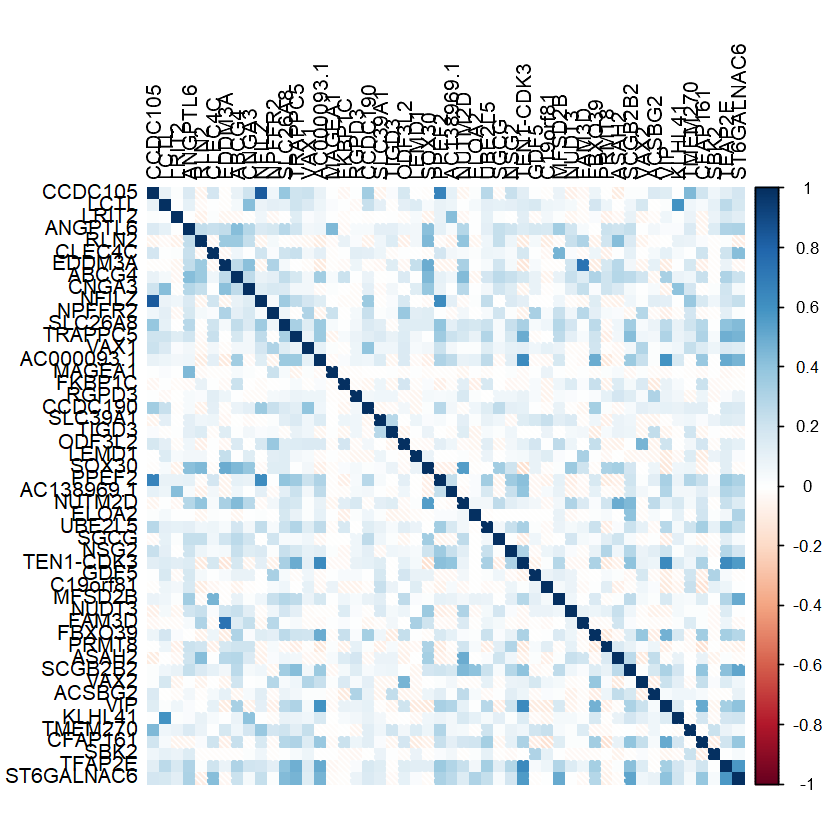

In [52]:
corrplot(cor_matrix[1:50,1:50],        # Correlation matrix
         method = "shade", # Correlation plot method
         type = "full",    # Correlation plot style (also "upper" and "lower")
         diag = TRUE,      # If TRUE (default), adds the diagonal
         tl.col = "black", # Labels color
         bg = "white",     # Background color
         title = "",       # Main title
         col = NULL)       # Color palette

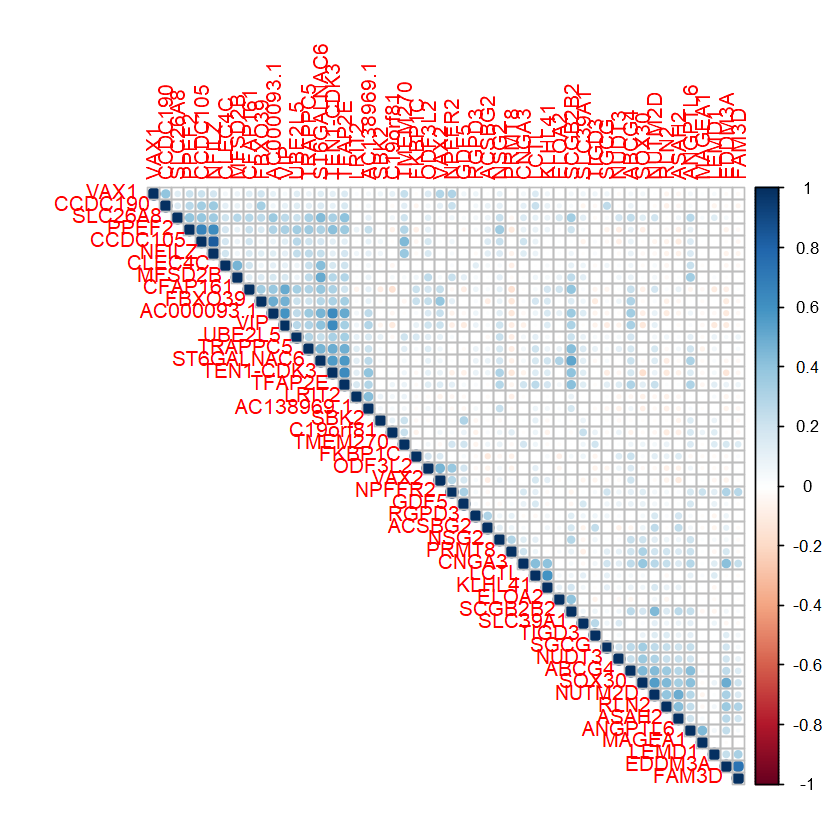

In [53]:
corrplot(cor_matrix[1:50,1:50], type="upper", order="hclust" )


In [149]:
# remove the correlated genes from the exp raw data
exp_counts4 = exp_new
dim(exp_counts4)

[1] 16243   590

### 5- Removal of outlier samples and miss-labeled samples 

### We will use log cpm for this step

In [150]:
# use log tpm data for exploration of samples
log_cpm_exp = cpm(exp_counts4, log=TRUE)

In [151]:
# PCA OF log tpm data
clean.pca <- prcomp(t(log_cpm_exp))
summary(clean.pca)

Importance of components:
                           PC1      PC2      PC3      PC4      PC5      PC6
Standard deviation     63.8814 43.12439 37.41712 33.47814 31.96820 28.35052
Proportion of Variance  0.1907  0.08689  0.06541  0.05236  0.04775  0.03755
Cumulative Proportion   0.1907  0.27755  0.34296  0.39533  0.44308  0.48063
                            PC7      PC8      PC9     PC10     PC11    PC12
Standard deviation     22.79674 20.97277 19.61322 17.69751 16.29760 15.1300
Proportion of Variance  0.02428  0.02055  0.01797  0.01463  0.01241  0.0107
Cumulative Proportion   0.50491  0.52546  0.54343  0.55807  0.57047  0.5812
                           PC13     PC14     PC15     PC16    PC17     PC18
Standard deviation     14.69133 14.24602 13.61908 13.42151 12.4969 12.23437
Proportion of Variance  0.01008  0.00948  0.00867  0.00842  0.0073  0.00699
Cumulative Proportion   0.59125  0.60074  0.60940  0.61782  0.6251  0.63211
                           PC19     PC20     PC21     PC22    

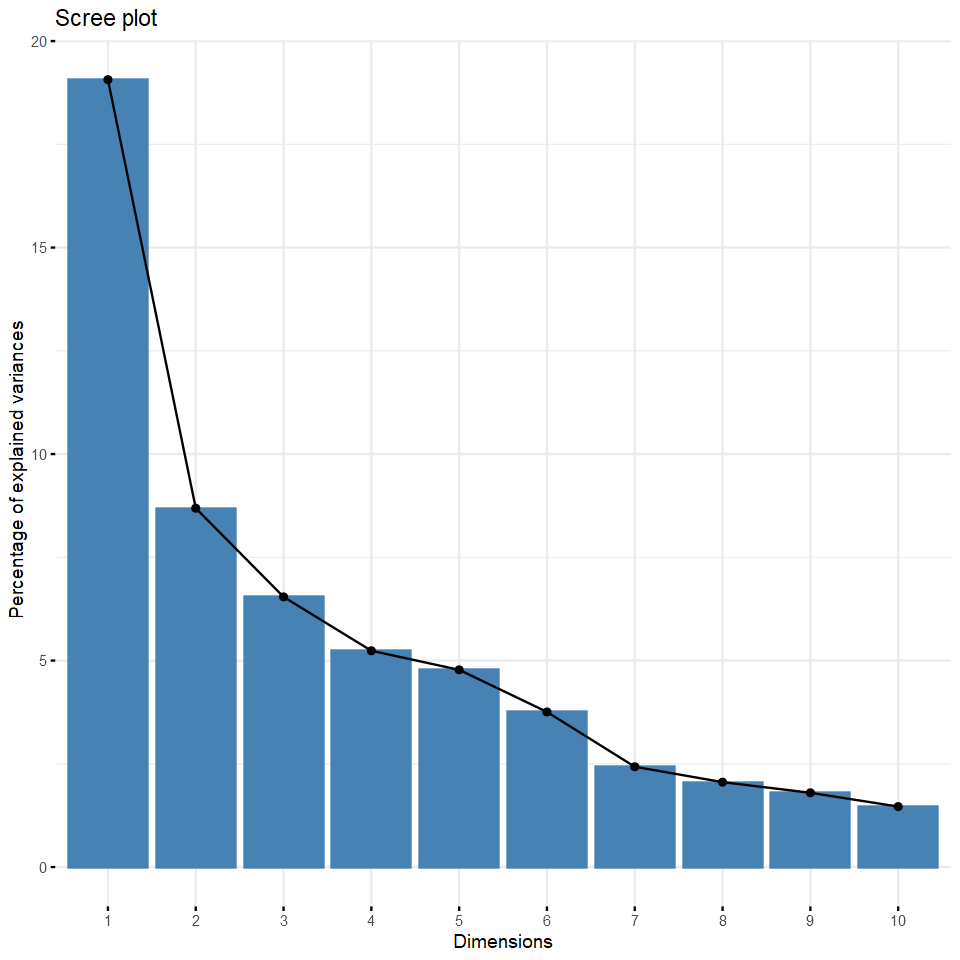

In [152]:
fviz_eig(clean.pca, col.var="blue")

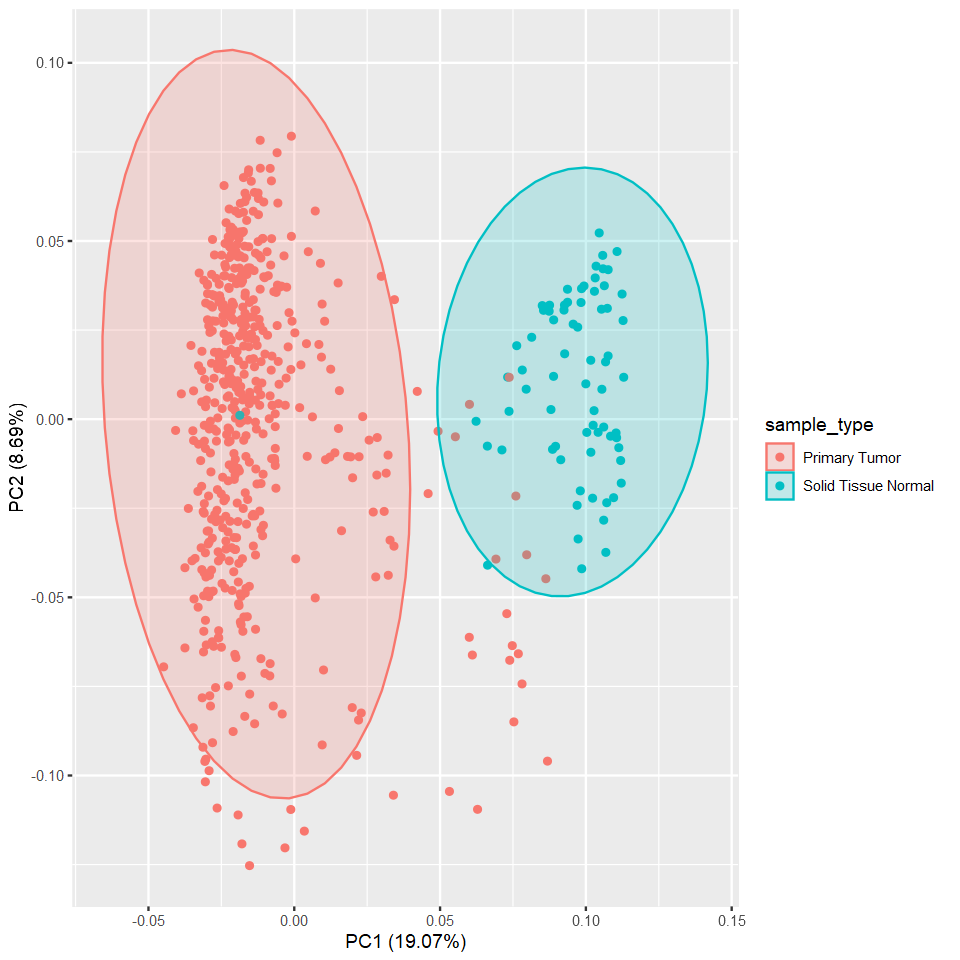

In [153]:
autoplot(clean.pca, frame = TRUE, frame.type= "norm", data=meta, colour="sample_type")


#### There was miss-labelled normal sample 

In [154]:
# UMAP of the exp data
exp.umap <- umap(t(log_cpm_exp))

Saving 6.67 x 6.67 in image


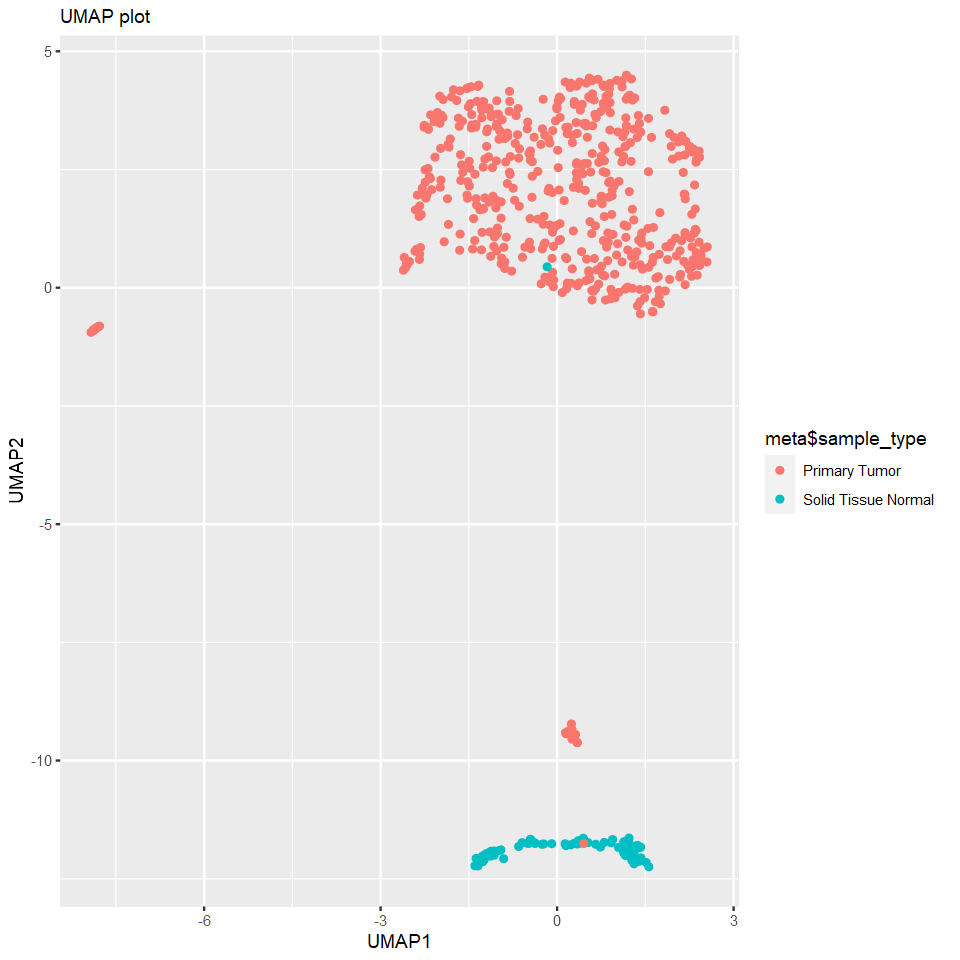

In [155]:
# get the UMAP1 and UMAP2 as a data frame
exp.umap$layout %>%
  ggplot(aes(x = exp.umap$layout[,1], 
             y = exp.umap$layout[,2], 
             color = meta$sample_type,
             ))+
  geom_point()+
  labs(x = "UMAP1",
       y = "UMAP2",
      subtitle = "UMAP plot")
ggsave("UMAP_plot_mrna1.png")

In [156]:
head(exp.umap$layout)

TCGA-BP-4160-01A,-1.2613348,1.6767525
TCGA-BP-4781-01A,-0.4703551,0.9640672
TCGA-B0-4821-01A,2.0283873,0.6712955
TCGA-CJ-4872-01A,0.9497160,1.1264955
TCGA-B8-5553-01A,-1.6413788,2.8125669
TCGA-BP-5176-01A,-1.8155829,3.1458099


In [157]:
# extract the coordinates of normal and tumor samples in a separate data fames
meta_n=meta[meta$sample_type=="Solid Tissue Normal",]
meta_t=meta[meta$sample_type=="Primary Tumor",]
df_n=exp.umap$layout[rownames(meta_n),]
df_t=exp.umap$layout[rownames(meta_t),]
df_n

TCGA-B8-5549-11A,-1.12575185,-11.91822
TCGA-CZ-5986-11A,1.26740617,-12.05211
TCGA-B0-5711-11A,-0.25722820,-11.77090
TCGA-CW-5580-11A,-0.48289136,-11.75308
TCGA-CZ-5982-11A,1.38357543,-12.13255
TCGA-CW-5587-11A,1.28504676,-12.05951
TCGA-B0-5706-11A,-0.65324428,-11.81768
TCGA-CZ-5470-11A,-0.95526526,-11.88907
TCGA-CZ-5465-11A,-1.26934976,-12.02221
TCGA-CZ-4864-11A,1.10941629,-11.87758
TCGA-B0-5705-11A,-0.38571841,-11.73581


In [158]:
# remove the miss-labelled normal sample which has >0 on y coordinates
n_out<-rownames(df_n)[df_n[,2]>0]
#t_out<-rownames(df_t)[df_t[,2]<(-5)]
n_out
#t_out


[1] "TCGA-CW-5591-11A"

In [159]:
# remove the n_out from normal samples =, cleaned data and meta data
#meta2 = meta[!rownames(meta) %in% t_out,]
meta2 = meta[!rownames(meta) %in% n_out,]
dim(meta2)
clean_exp <- log_cpm_exp[,rownames(meta2)]
dim(clean_exp)

[1] 589  71

[1] 16243   589

In [160]:
#PCA of cleaned data
clean2.pca <- prcomp(t(clean_exp))
summary(clean2.pca)

Importance of components:
                           PC1     PC2      PC3     PC4      PC5     PC6
Standard deviation     63.9246 43.1610 37.44481 33.4960 31.95590 28.3738
Proportion of Variance  0.1908  0.0870  0.06548  0.0524  0.04769  0.0376
Cumulative Proportion   0.1908  0.2778  0.34331  0.3957  0.44340  0.4810
                           PC7     PC8      PC9     PC10    PC11    PC12
Standard deviation     22.8132 20.9519 19.61960 17.68574 16.2933 15.1383
Proportion of Variance  0.0243  0.0205  0.01798  0.01461  0.0124  0.0107
Cumulative Proportion   0.5053  0.5258  0.54378  0.55838  0.5708  0.5815
                          PC13     PC14     PC15     PC16     PC17    PC18
Standard deviation     14.7038 14.25694 13.61706 13.43110 12.49794 12.2402
Proportion of Variance  0.0101  0.00949  0.00866  0.00842  0.00729  0.0070
Cumulative Proportion   0.5916  0.60107  0.60973  0.61816  0.62545  0.6324
                           PC19     PC20     PC21     PC22     PC23     PC24
Standard devi

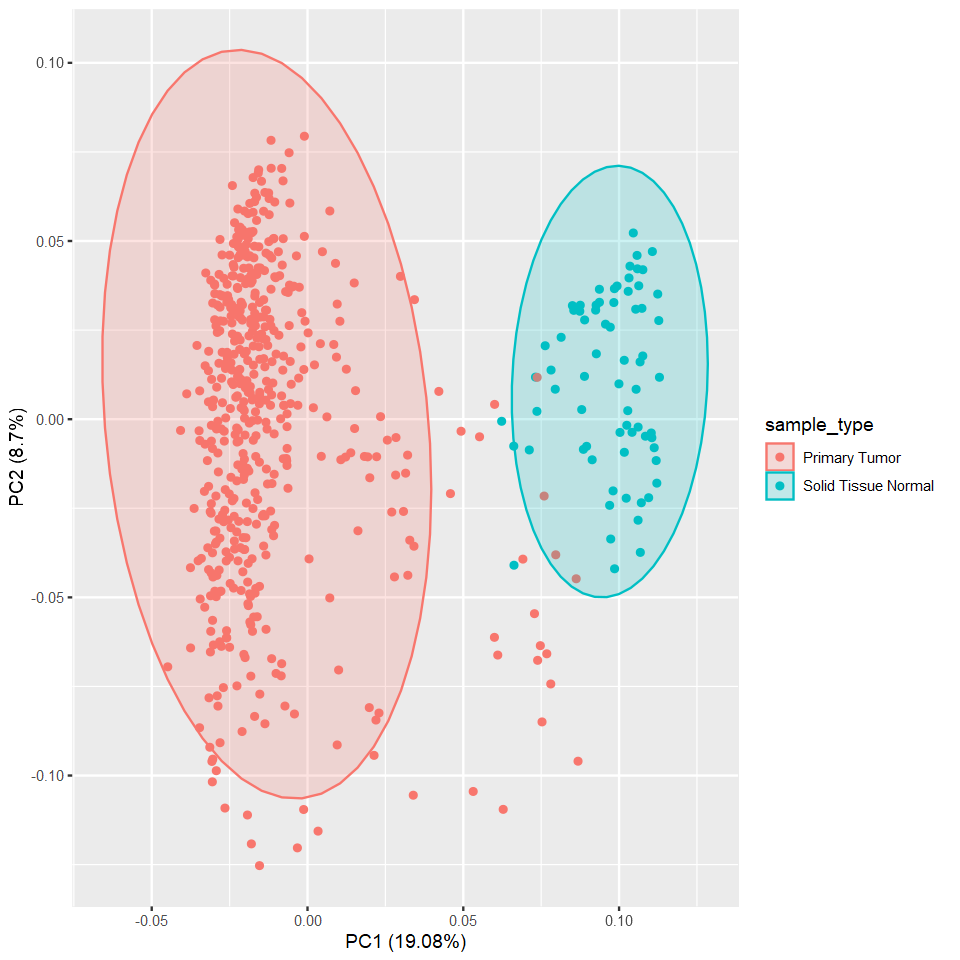

In [161]:
#PCA Plot of cleaned data
autoplot(clean2.pca, frame = TRUE, frame.type= "norm", data=meta2, colour="sample_type")


In [162]:
# another UMAP after removal of misslabeled samples
exp.umap2 <- umap(t(clean_exp))

Saving 6.67 x 6.67 in image


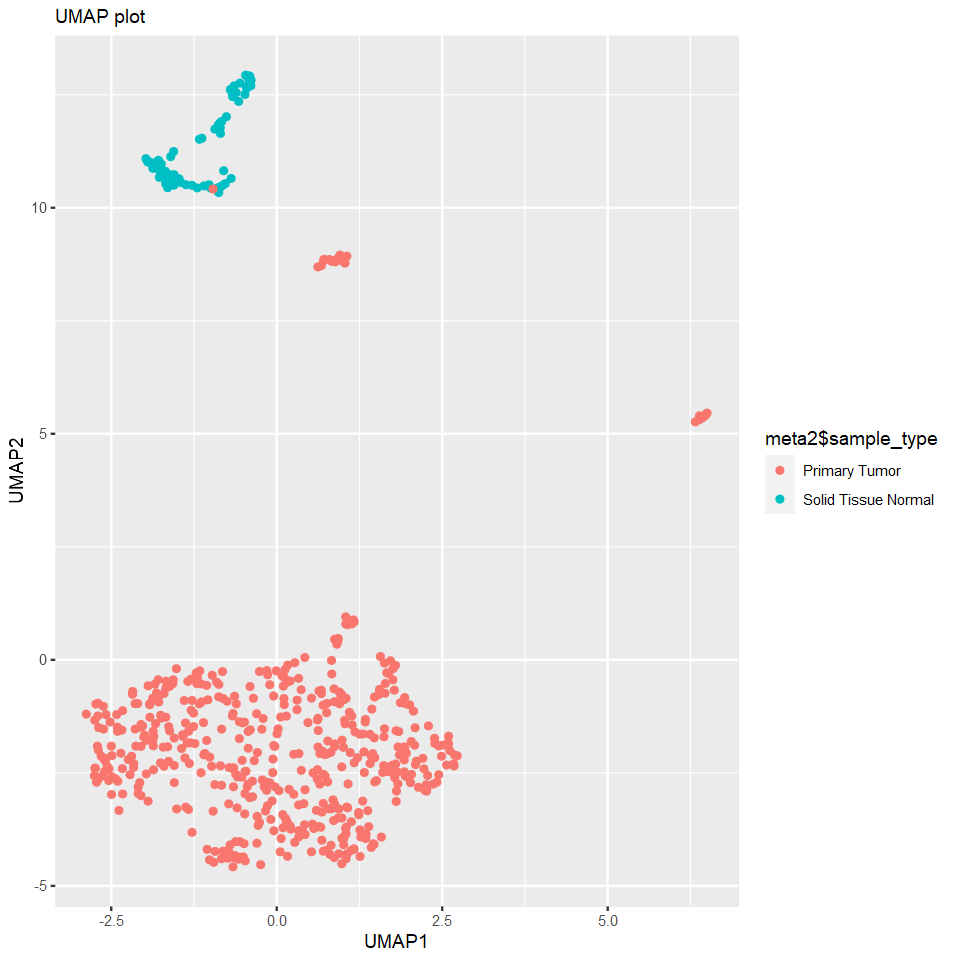

In [163]:
options(repr.plot.width=8,repr.plot.height=8)

exp.umap2$layout %>%
  ggplot(aes(x = exp.umap2$layout[,1], 
             y = exp.umap2$layout[,2], 
             color = meta2$sample_type,
             ))+
  geom_point()+
  labs(x = "UMAP1",
       y = "UMAP2",
      subtitle = "UMAP plot")
ggsave("UMAP_plot_mrna2.png")

### We have seen that miss-labeled sample was removed 

In [164]:
## convert exp counts into int before deseq2
exp_counts4 <- exp_counts4[, colnames(clean_exp)]
genes <- rownames(exp_counts4)
exp_counts4 <- apply(exp_counts4, 2,            
                    function(x) as.integer(x))
rownames(exp_counts4)<-genes
head(exp_counts4)

,TCGA-BP-4160-01A,TCGA-BP-4781-01A,TCGA-B0-4821-01A,TCGA-CJ-4872-01A,TCGA-B8-5553-01A,TCGA-BP-5176-01A,TCGA-CJ-5671-01A,TCGA-A3-A6NJ-01A,TCGA-B8-4153-01B,TCGA-B0-4847-01A,⋯,TCGA-BP-4971-01A,TCGA-B0-4945-01A,TCGA-CZ-5452-01A,TCGA-CZ-5452-11A,TCGA-AS-3777-01A,TCGA-DV-A4VX-01A,TCGA-B0-4838-01A,TCGA-B0-5399-01A,TCGA-BP-4163-01A,TCGA-AK-3451-01A
CCDC105,0,1,0,0,0,0,1,0,0,3,⋯,1,0,0,0,1,1,1,0,0,0
LCTL,1,19,17,8,4,1,5,5,2,20,⋯,24,12,5,0,7,7,6,2,12,2
LRIT2,2,0,5,2,1,3,12,3,23,10,⋯,1,0,3,0,3,11,2,4,0,0
ANGPTL6,4,2,24,12,3,8,17,14,5,15,⋯,30,5,33,52,307,14,14,27,11,3
RLN2,16,27,10,24,53,20,9,24,22,39,⋯,7,20,10,109,9,3,16,25,2,3
CLEC4C,1,1,4,9,6,2,6,4,0,3,⋯,8,1,4,0,2,1,8,6,1,0


### Normalization

#### 1- Size factor normalization such as Deseq2

In [165]:
# define a function to calculate the geometric mean
gm_mean <- function(x, na.rm=TRUE){ exp(sum(log(x[x > 0]), na.rm=na.rm) / length(x)) }

# calculate the geometric mean for each gene using that function
pseudo_refs <- exp_counts4 %>% apply(., 1, gm_mean)

# divide each value by its corresponding pseudo-reference value
pseudo_ref_ratios <- exp_counts4 %>% apply(., 2, function(cts){ cts/pseudo_refs})

# determine the median value per sample to get the size factor
median_gm_ratio <- apply(pseudo_ref_ratios , 2, median)
median_gm_ratio

TCGA-BP-4160-01A TCGA-BP-4781-01A TCGA-B0-4821-01A TCGA-CJ-4872-01A 
      0.60714616       1.05756943       1.03221380       1.09367846 
TCGA-B8-5553-01A TCGA-BP-5176-01A TCGA-CJ-5671-01A TCGA-A3-A6NJ-01A 
      1.03615694       1.11900923       0.93457357       1.00902093 
TCGA-B8-4153-01B TCGA-B0-4847-01A TCGA-CJ-4634-01A TCGA-B0-5692-01A 
      0.71169787       0.70999602       1.17638043       0.93558274 
TCGA-A3-A8OW-01A TCGA-CZ-5982-01A TCGA-B8-5165-01A TCGA-BP-4988-01A 
      1.03792110       1.01183261       1.33489847       1.16457576 
TCGA-B8-5549-11A TCGA-CZ-4853-01A TCGA-CJ-4902-01A TCGA-CZ-5986-11A 
      1.18627551       1.37516113       1.60590172       0.84998945 
TCGA-B0-5711-11A TCGA-CJ-4899-01A TCGA-CJ-5678-01A TCGA-CZ-4863-01A 
      1.41204394       1.63683815       0.71341930       1.33022254 
TCGA-BP-4995-01A TCGA-CW-5580-11A TCGA-B8-A54D-01A TCGA-BP-4991-01A 
      1.55349026       1.45274543       0.46459652       1.70405725 
TCGA-BP-4327-01A TCGA-BP-4756-01A TCGA-B8-A54K-01A TCGA-BP-4345-01A 
      0.98322604       1.12265693       0.94816225       1.05486087 
TCGA-A3-3346-01A TCGA-CZ-5982-11A TCGA-B8-5549-01A TCGA-BP-4801-01A 
      0.93527472       0.90067476       0.95331990       1.07738096 
TCGA-B0-4834-01A TCGA-A3-3331-01A TCGA-CJ-4912-01A TCGA-CZ-5459-01A 
      0.75211636       1.32319704       0.69552992       0.81288800 
TCGA-AK-3460-01A TCGA-CW-5587-11A TCGA-CJ-5683-01A TCGA-B0-5400-01A 
      0.67700669       1.13293472       0.95248424       0.82658219 
TCGA-BP-5183-01A TCGA-B2-5633-01A TCGA-B0-4841-01A TCGA-B8-A54I-01A 
      0.97337140       0.95492108       0.30713093       0.66246699 
TCGA-CJ-4905-01A TCGA-BP-5168-01A TCGA-CJ-6033-01A TCGA-BP-4331-01A 
      1.26439505       0.81001234       1.09070203       1.34091541 
TCGA-BP-4173-01A TCGA-BP-4969-01A TCGA-A3-3324-01A TCGA-A3-3385-01A 
      1.17397002       1.05809361       1.19021103       1.18331423 
TCGA-BP-4338-01A TCGA-BP-4787-01A TCGA-CZ-5466-01A TCGA-B0-4707-01A 
      1.01861364       0.90771552       0.78991598       0.53756011 
TCGA-A3-3320-01A TCGA-CJ-4873-01A TCGA-BP-4346-01A TCGA-B0-5700-01A 
      1.18206906       0.69104675       1.09579833       0.66551905 
TCGA-AK-3431-01A TCGA-A3-3322-01A TCGA-B0-5706-11A TCGA-A3-3326-01A 
      0.68138566       0.88185228       0.93724944       0.44823391 
TCGA-CJ-4907-01A TCGA-B0-4712-01A TCGA-BP-4768-01A TCGA-CZ-5470-11A 
      1.30283993       0.89121964       1.19805023       1.51749622 
TCGA-B0-5711-01A TCGA-CJ-5684-01A TCGA-CZ-5451-01A TCGA-B0-5083-01A 
      1.09309220       1.00675718       0.84809538       0.66587433 
TCGA-G6-A8L8-01A TCGA-BP-4983-01A TCGA-B0-5085-01A TCGA-BP-4998-01A 
      0.82587109       1.24843058       0.78624498       1.65081984 
TCGA-B0-4852-01A TCGA-BP-4326-01A TCGA-A3-3378-01A TCGA-CJ-4878-01A 
      1.91603779       0.95942560       1.13142183       0.76375779 
TCGA-CZ-5465-11A TCGA-BP-4993-01A TCGA-B0-4688-01A TCGA-BP-4765-01A 
      1.48196941       0.96819548       1.07345930       1.35082457 
TCGA-CW-5588-01A TCGA-CZ-4864-11A TCGA-CZ-4864-01A TCGA-B0-5705-11A 
      0.92755263       1.13636966       1.49652077       1.14356339 
TCGA-CZ-5455-01A TCGA-CJ-5680-11A TCGA-CJ-4637-01A TCGA-BP-4174-01A 
      1.70215641       1.20761789       1.00793118       0.88897728 
TCGA-B8-5546-01A TCGA-CJ-4870-01A TCGA-B8-4621-01A TCGA-EU-5906-01A 
      0.77289768       0.80267745       1.19084217       1.60333962 
TCGA-BP-4789-01A TCGA-BP-5010-01A TCGA-A3-3370-01A TCGA-CZ-5468-01A 
      1.18463440       0.72090167       1.66502855       0.96814159 
TCGA-B0-5706-01A TCGA-BP-4803-01A TCGA-CZ-5461-01A TCGA-B8-5545-01A 
      0.32031587       1.04024786       1.45710972       1.14490001 
TCGA-BP-4974-01A TCGA-B0-4845-01A TCGA-B0-5693-01A TCGA-AK-3443-01A 
      1.77729809       0.98600315       1.02452750       0.99305167 
TCGA-CJ-4894-01A TCGA-AK-3447-01A TCGA-B0-5697-11A TCGA-BP-4354-01A 
      1.31864461       0.23026252       0.79997337       0.84937961

In [166]:
# apply the median of geometric mean ratios on each gene
length(median_gm_ratio)
exp_norm <- exp_counts4 %>% apply(., 1, function(cts){ cts/median_gm_ratio})
exp_norm_log <- log2(exp_norm+1)
exp_norm_log <- t(exp_norm_log)
head(exp_norm_log)

[1] 589

,TCGA-BP-4160-01A,TCGA-BP-4781-01A,TCGA-B0-4821-01A,TCGA-CJ-4872-01A,TCGA-B8-5553-01A,TCGA-BP-5176-01A,TCGA-CJ-5671-01A,TCGA-A3-A6NJ-01A,TCGA-B8-4153-01B,TCGA-B0-4847-01A,⋯,TCGA-BP-4971-01A,TCGA-B0-4945-01A,TCGA-CZ-5452-01A,TCGA-CZ-5452-11A,TCGA-AS-3777-01A,TCGA-DV-A4VX-01A,TCGA-B0-4838-01A,TCGA-B0-5399-01A,TCGA-BP-4163-01A,TCGA-AK-3451-01A
CCDC105,0.000000,0.9601887,0.000000,0.000000,0.0000000,0.0000000,1.049635,0.000000,0.000000,2.385535,⋯,0.8300307,0.000000,0.000000,0.000000,1.191741,1.353115,0.9740255,0.000000,0.000000,0.000000
LCTL,1.404385,4.2453225,4.126763,3.055675,2.2810807,0.9211679,2.666764,2.574174,1.929860,4.866373,⋯,4.2975844,3.763420,2.601608,0.000000,3.320482,3.570756,2.7625367,1.425154,4.065603,2.358984
LRIT2,2.102356,0.0000000,2.546946,1.500135,0.9746062,1.8800754,3.790780,1.990294,5.058190,3.915003,⋯,0.8300307,0.000000,2.014989,0.000000,2.278832,4.177992,1.5502249,2.127918,0.000000,0.000000
ANGPTL6,2.923758,1.5316329,4.599972,3.581610,1.9617397,3.0266552,4.262291,3.894802,3.004583,4.467728,⋯,4.6047649,2.641939,5.106832,5.471444,8.626712,4.508735,3.8580204,4.570057,3.947883,2.847021
RLN2,4.773616,4.7295657,3.417909,4.520063,5.7046106,4.2382483,3.410078,4.631421,4.996027,5.805547,⋯,2.6879704,4.457252,3.477581,6.522084,3.650598,2.501794,4.0381748,4.463876,1.857606,2.847021
CLEC4C,1.404385,0.9601887,2.285451,3.206191,2.7635451,1.4788659,2.891427,2.311573,0.000000,2.385535,⋯,2.8523556,1.034455,2.337911,0.000000,1.835344,1.353115,3.1234198,2.598435,1.209160,0.000000


In [167]:
# DESeq2 
exp_dds <- DESeqDataSetFromMatrix(countData = exp_counts4,
                              colData = meta2,
                              design = ~ sample_type)
exp_dds

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"
  Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not a warning or an error]



class: DESeqDataSet 
dim: 16243 589 
metadata(1): version
assays(1): counts
rownames(16243): CCDC105 LCTL ... MT-ND4 MT-CO1
rowData names(0):
colnames(589): TCGA-BP-4160-01A TCGA-BP-4781-01A ... TCGA-BP-4163-01A
  TCGA-AK-3451-01A
colData names(71): barcode patient ... paper_mRNA_cluster
  paper_microRNA_cluster

In [168]:
# run deseq model
exp_dds.run <- DESeq(exp_dds)

estimating size factors

  Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not a warning or an error]

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

  Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not a warning or an error]

final dispersion estimates

  Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This 

In [169]:
# extract the variance stablized data from deseq2
exp_vsd <- vst(exp_dds.run, blind=FALSE)
exp_deseq_vsd <- as.data.frame(assay(exp_vsd))
head(exp_deseq_vsd)

,TCGA-BP-4160-01A,TCGA-BP-4781-01A,TCGA-B0-4821-01A,TCGA-CJ-4872-01A,TCGA-B8-5553-01A,TCGA-BP-5176-01A,TCGA-CJ-5671-01A,TCGA-A3-A6NJ-01A,TCGA-B8-4153-01B,TCGA-B0-4847-01A,⋯,TCGA-BP-4971-01A,TCGA-B0-4945-01A,TCGA-CZ-5452-01A,TCGA-CZ-5452-11A,TCGA-AS-3777-01A,TCGA-DV-A4VX-01A,TCGA-B0-4838-01A,TCGA-B0-5399-01A,TCGA-BP-4163-01A,TCGA-AK-3451-01A
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CCDC105,6.387017,6.539153,6.387017,6.387017,6.387017,6.387017,6.549596,6.387017,6.387017,6.715650,⋯,6.529748,6.387017,6.387017,6.387017,6.567234,6.584061,6.541483,6.387017,6.387017,6.387017
LCTL,6.586271,7.044759,7.041511,6.815242,6.691453,6.532816,6.749790,6.734289,6.648153,7.225526,⋯,7.079861,6.943246,6.734663,6.387017,6.861989,6.905950,6.764482,6.592175,7.005918,6.696300
LRIT2,6.668581,6.387017,6.744106,6.601718,6.539447,6.639334,6.946983,6.656272,7.260384,6.984044,⋯,6.529748,6.387017,6.656562,6.387017,6.698758,7.035571,6.605360,6.676911,6.387017,6.387017
ANGPTL6,6.784582,6.602071,7.162006,6.910534,6.650788,6.798182,7.051804,6.965633,6.799071,7.115682,⋯,7.159833,6.747352,7.268521,7.399228,9.119564,7.117048,6.961449,7.133109,6.979942,6.765450
RLN2,7.174841,7.168323,6.890744,7.123429,7.471522,7.033896,6.872714,7.141078,7.241735,7.543286,⋯,6.763731,7.102215,6.877487,7.822764,6.924899,6.727780,7.000542,7.105523,6.641295,6.765450
CLEC4C,6.586271,6.539153,6.706569,6.841012,6.759530,6.593121,6.784207,6.697776,6.387017,6.715650,⋯,6.789579,6.548499,6.698111,6.387017,6.641717,6.584061,6.822466,6.741766,6.566935,6.387017


In [170]:
# normalize and log transformation the data using count function
exp_norm_deseq <- counts(exp_dds.run, normalized=TRUE)
exp_log_deseq <- log2(exp_norm_deseq+1)
head(exp_log_deseq)

,TCGA-BP-4160-01A,TCGA-BP-4781-01A,TCGA-B0-4821-01A,TCGA-CJ-4872-01A,TCGA-B8-5553-01A,TCGA-BP-5176-01A,TCGA-CJ-5671-01A,TCGA-A3-A6NJ-01A,TCGA-B8-4153-01B,TCGA-B0-4847-01A,⋯,TCGA-BP-4971-01A,TCGA-B0-4945-01A,TCGA-CZ-5452-01A,TCGA-CZ-5452-11A,TCGA-AS-3777-01A,TCGA-DV-A4VX-01A,TCGA-B0-4838-01A,TCGA-B0-5399-01A,TCGA-BP-4163-01A,TCGA-AK-3451-01A
CCDC105,0.000000,0.9497524,0.000000,0.000000,0.0000000,0.0000000,1.045409,0.000000,0.000000,2.422628,⋯,0.8638065,0.000000,0.000000,0.000000,1.206424,1.358192,0.9710857,0.000000,0.000000,0.000000
LCTL,1.377936,4.2249108,4.211162,3.075169,2.2450593,0.8917988,2.659869,2.554028,1.906697,4.910563,⋯,4.3698855,3.765056,2.556614,0.000000,3.343912,3.578390,2.7574269,1.430440,4.056552,2.281280
LRIT2,2.069676,0.0000000,2.621409,1.514485,0.9524391,1.8344946,3.783185,1.972189,5.027650,3.957750,⋯,0.8638065,0.000000,1.974512,0.000000,2.299522,4.185867,1.5462798,2.134411,0.000000,0.000000
ANGPTL6,2.886716,1.5175691,4.685763,3.601912,1.9280574,2.9715722,4.254531,3.872200,2.977050,4.511427,⋯,4.6777904,2.643422,5.054391,5.456675,8.652660,4.516703,3.8524397,4.578117,3.938882,2.763759
RLN2,4.732453,4.7088278,3.499146,4.541244,5.6599959,4.1786958,3.402662,4.608162,4.965529,5.850477,⋯,2.7524991,4.458938,3.428478,6.507137,3.674556,2.508660,4.0325456,4.471910,1.850642,2.763759
CLEC4C,1.377936,0.9497524,2.356934,3.225948,2.7248356,1.4388125,2.884345,2.292244,0.000000,2.422628,⋯,2.9181321,1.035359,2.294724,0.000000,1.854115,1.358192,3.1181142,2.605463,1.203704,0.000000


### 3- Limma with voom Normalization 

In [171]:
# create DGEList of exp data
exp_lim <- DGEList(exp_counts4)
class(exp_lim)
dim(exp_lim)

[1] "DGEList"
attr(,"package")
[1] "edgeR"

[1] 16243   589

In [172]:
# add genes to dgelist by the rownames of exp data
exp_lim$genes <- rownames(exp_counts4)
exp_lim

,TCGA-BP-4160-01A,TCGA-BP-4781-01A,TCGA-B0-4821-01A,TCGA-CJ-4872-01A,TCGA-B8-5553-01A,TCGA-BP-5176-01A,TCGA-CJ-5671-01A,TCGA-A3-A6NJ-01A,TCGA-B8-4153-01B,TCGA-B0-4847-01A,⋯,TCGA-BP-4971-01A,TCGA-B0-4945-01A,TCGA-CZ-5452-01A,TCGA-CZ-5452-11A,TCGA-AS-3777-01A,TCGA-DV-A4VX-01A,TCGA-B0-4838-01A,TCGA-B0-5399-01A,TCGA-BP-4163-01A,TCGA-AK-3451-01A
CCDC105,0,1,0,0,0,0,1,0,0,3,⋯,1,0,0,0,1,1,1,0,0,0
LCTL,1,19,17,8,4,1,5,5,2,20,⋯,24,12,5,0,7,7,6,2,12,2
LRIT2,2,0,5,2,1,3,12,3,23,10,⋯,1,0,3,0,3,11,2,4,0,0
ANGPTL6,4,2,24,12,3,8,17,14,5,15,⋯,30,5,33,52,307,14,14,27,11,3
RLN2,16,27,10,24,53,20,9,24,22,39,⋯,7,20,10,109,9,3,16,25,2,3
CLEC4C,1,1,4,9,6,2,6,4,0,3,⋯,8,1,4,0,2,1,8,6,1,0
EDDM3A,0,0,1,0,0,1,0,3,0,0,⋯,0,5,0,103,0,0,1,0,0,0
ABCG4,16,14,39,48,16,20,50,18,11,15,⋯,149,38,21,70,75,4,20,29,22,0
CNGA3,1,0,2,2,0,0,5,1,2,1,⋯,0,2,1,19,3,0,0,1,1,0
NFILZ,0,1,1,1,2,1,2,1,0,4,⋯,4,3,0,0,2,0,2,2,3,0


In [173]:
# use cpm and log cpm to be used for visualize the filtration criteria that is used in lima with voom
cpm <- cpm(exp_lim)
cpm_log <- cpm(exp_lim, log=TRUE)
summary(cpm_log)

 TCGA-BP-4160-01A TCGA-BP-4781-01A TCGA-B0-4821-01A TCGA-CJ-4872-01A
 Min.   :-4.824   Min.   :-4.824   Min.   :-4.824   Min.   :-4.824  
 1st Qu.: 1.560   1st Qu.: 1.739   1st Qu.: 1.895   1st Qu.: 1.860  
 Median : 4.216   Median : 4.292   Median : 4.097   Median : 4.222  
 Mean   : 3.401   Mean   : 3.502   Mean   : 3.517   Mean   : 3.529  
 3rd Qu.: 5.718   3rd Qu.: 5.747   3rd Qu.: 5.571   3rd Qu.: 5.602  
 Max.   :13.581   Max.   :13.865   Max.   :14.552   Max.   :14.454  
 TCGA-B8-5553-01A TCGA-BP-5176-01A TCGA-CJ-5671-01A TCGA-A3-A6NJ-01A
 Min.   :-4.824   Min.   :-4.824   Min.   :-4.824   Min.   :-4.824  
 1st Qu.: 1.535   1st Qu.: 1.258   1st Qu.: 1.681   1st Qu.: 1.654  
 Median : 4.228   Median : 4.028   Median : 4.138   Median : 4.365  
 Mean   : 3.421   Mean   : 3.195   Mean   : 3.409   Mean   : 3.516  
 3rd Qu.: 5.819   3rd Qu.: 5.586   3rd Qu.: 5.615   3rd Qu.: 5.846  
 Max.   :12.968   Max.   :14.954   Max.   :13.748   Max.   :13.737  
 TCGA-B8-4153-01B TCGA-B0-4847-01A

In [174]:
# calculate mean and median of library size
L <- mean(exp_lim$samples$lib.size) * 1e-6
M <- median(exp_lim$samples$lib.size) * 1e-6
c(L, M)

[1] 56.64730 56.50074

In [175]:
# replace the group names of tumor and normal in meta data
meta2$sample_type = gsub('Primary Tumor','Tumor',meta2$sample_type)
meta2$sample_type = gsub('Solid Tissue Normal','Normal',meta2$sample_type)
meta2$sample_type = as.factor(meta2$sample_type)
unique(meta2$sample_type)
table(meta2$sample_type)


[1] Tumor  Normal
Levels: Normal Tumor


Normal  Tumor 
    70    519 

In [176]:
# add sample type to dgelist
type = as.factor(meta2$sample_type)
exp_lim$samples$group <- type
exp_lim$samples

,group,lib.size,norm.factors
,<fct>,<dbl>,<dbl>
TCGA-BP-4160-01A,Tumor,32945205,1
TCGA-BP-4781-01A,Tumor,55419452,1
TCGA-B0-4821-01A,Tumor,56200234,1
TCGA-CJ-4872-01A,Tumor,58401874,1
TCGA-B8-5553-01A,Tumor,55551651,1
TCGA-BP-5176-01A,Tumor,69612528,1
TCGA-CJ-5671-01A,Tumor,53905771,1
TCGA-A3-A6NJ-01A,Tumor,50786401,1
TCGA-B8-4153-01B,Tumor,45236900,1


In [177]:
# calculate of low expressed genes using filterByExpr
keep.exprs <- filterByExpr(exp_lim, group=type)
sum(keep.exprs)
keep.exprs

[1] 16012

CCDC105            LCTL           LRIT2         ANGPTL6            RLN2 
          FALSE            TRUE            TRUE            TRUE            TRUE 
         CLEC4C          EDDM3A           ABCG4           CNGA3           NFILZ 
           TRUE            TRUE            TRUE           FALSE           FALSE 
         NPFFR2         SLC26A8         TRAPPC5            VAX1      AC000093.1 
           TRUE            TRUE            TRUE           FALSE            TRUE 
         MAGEA1          FKBP1C           RGPD3         CCDC190         SLC39A1 
          FALSE            TRUE            TRUE           FALSE            TRUE 
          TIGD3          ODF3L2           LEMD1           SOX30           PPEF2 
           TRUE            TRUE            TRUE            TRUE            TRUE 
     AC138969.1          NUTM2D           ELOA2          UBE2L5            SGCG 
           TRUE            TRUE           FALSE            TRUE            TRUE 
           NSG2       TEN1-CDK3            GDF5        C19orf81          MFSD2B 
           TRUE            TRUE            TRUE            TRUE            TRUE 
          NUDT3           FAM3D          FBXO39           PRMT8           ASAH2 
           TRUE            TRUE            TRUE            TRUE            TRUE 
        SCGB2B2            VAX2          ACSBG2             VIP          KLHL41 
           TRUE            TRUE            TRUE            TRUE            TRUE 
        TMEM270         CFAP161            SBK2          TFAP2E      ST6GALNAC6 
           TRUE            TRUE            TRUE            TRUE            TRUE 
           MAFA             LPO           DMRT1      AC020765.6          GABRA4 
           TRUE            TRUE           FALSE           FALSE            TRUE 
       C12orf40             IL5            RGS8          KLHL10            GRM2 
          FALSE           FALSE            TRUE            TRUE            TRUE 
          CNIH2          CRYAA2             ACR           MORN5   ZNF559-ZNF177 
           TRUE           FALSE            TRUE            TRUE            TRUE 
           KLK5            IL19           HTR1B          PKD2L2         CYP26C1 
           TRUE            TRUE            TRUE            TRUE            TRUE 
         IZUMO1          RNF223            PAX3            IRX4          GPR150 
           TRUE            TRUE           FALSE           FALSE            TRUE 
          OR9Q1          CYP2F1        C17orf49           CDH10          STARD5 
           TRUE           FALSE            TRUE            TRUE            TRUE 
          CABP2           OR7D2          SPACA3           CPNE9           KIF25 
          FALSE            TRUE           FALSE            TRUE            TRUE 
         OR56A3           ACOD1          SPHKAP         DNAJC5G         CYP3A43 
          FALSE           FALSE            TRUE           FALSE            TRUE 
        AKR1C8P          KCNE1B           MESP2          LINGO3            ALX4 
           TRUE            TRUE            TRUE            TRUE            TRUE 
        C4orf51      AC090360.1          ZCWPW2           PP2D1          SLC5A7 
           TRUE            TRUE            TRUE            TRUE            TRUE 
          SOX21           LIN37          CHRNA3            RETN        TCTEX1D1 
           TRUE            TRUE            TRUE            TRUE            TRUE 
          DPPA3             CBS         ABHD16A         C2orf73          PRSS48 
          FALSE            TRUE            TRUE            TRUE           FALSE 
          TUBB1           PRR19          NKX3-2     MSH5-SAPCD1            ETV2 
           TRUE            TRUE            TRUE            TRUE            TRUE 
         ODF3L1            GPS2          HS3ST4           SNTG2         CYP19A1 
           TRUE            TRUE           FALSE            TRUE            TRUE 
         GUCA1A            CPA1             SHD           FOXN4           CALCB 
          FALSE            TRUE        

In [178]:
# filtration of low expressed genes calculated
exp_lim$counts = exp_lim$counts[keep.exprs,]
length(rownames(exp_lim$counts))



[1] 16012

In [179]:
# calculate the normalization factors using truncated mean method and add this to dgelist
exp_lim <- calcNormFactors(exp_lim, method = "TMM")
exp_lim$samples$norm.factors

[1] 1.0057035 1.0500092 0.9991735 1.0156671 1.0259246 0.8843264 0.9488534
  [8] 1.0960166 0.8724314 0.9357481 1.1916707 1.0314206 1.1469420 0.9808196
 [15] 1.0580626 1.2605131 1.0495386 0.9666024 1.1079637 1.0024811 1.0963614
 [22] 1.1864160 0.9193960 1.1218996 1.0274319 1.0647605 1.0942575 1.1534035
 [29] 1.0291666 1.0300439 1.1020124 0.9676789 0.9068432 0.8130132 0.9410131
 [36] 1.0136820 0.7796153 1.1202825 0.8711051 0.9380709 1.0414967 0.9632577
 [43] 1.0314734 0.8286007 1.0704148 1.1299880 0.6085974 0.8875085 0.9712117
 [50] 0.9359494 0.9350517 1.2208990 1.0802011 0.9330430 1.0660660 0.9376631
 [57] 0.7271863 0.9670981 0.9616386 0.8266199 1.1691611 0.9786669 1.1686470
 [64] 0.8870347 0.9750501 1.0914475 1.0262228 1.1397751 1.0286381 0.8678278
 [71] 1.0098500 1.0737870 1.0256119 1.0046572 0.9860402 0.8095959 1.0703734
 [78] 1.0245543 0.7930523 1.1951364 1.1370398 0.8877926 1.0272458 1.0496730
 [85] 1.0432540 0.9989092 1.0437542 1.1239134 0.9549448 0.8542798 1.1309453
 [92] 0.9368995 1.0550211 1.1962401 1.1656168 0.9668986 1.0008125 0.8729364
 [99] 0.8983408 1.0581057 1.0329166 0.8630499 1.1733013 0.8975791 0.9791529
[106] 0.9500081 1.0301001 1.0794744 1.1502084 1.1227006 1.0814695 0.7900727
[113] 1.1782127 0.3956305 0.9453309 1.1621087 1.0774805 1.0913223 1.0901302
[120] 1.1610886 0.9764200 1.0746281 0.9813953 0.9679814 1.1167047 1.0674545
[127] 0.8291292 1.0866389 1.2140601 0.9051965 0.9128298 1.0338730 0.9223237
[134] 0.8682345 1.0821855 0.9531650 1.0081764 1.0125833 1.0552860 1.0530347
[141] 1.0041270 0.8376439 1.0259217 0.6708787 0.9509757 0.9293390 0.9966029
[148] 1.0609990 0.9569259 0.6752704 1.2240770 1.1302966 0.9371157 1.1076607
[155] 0.9592715 1.0251096 0.9980613 0.8879545 0.9652610 0.9430588 1.1729556
[162] 0.9307972 1.0802737 1.0868684 1.0769962 0.9439392 1.0593825 0.9948241
[169] 1.1030543 0.9716222 1.0300594 0.9593974 0.9674948 0.9261762 1.0469226
[176] 1.0273631 1.0127370 0.8935479 1.0267860 0.9622991 1.0827698 1.1838064
[183] 1.0520340 1.0504177 0.9871639 1.0669552 0.9129012 0.7582392 0.7138539
[190] 0.7685565 0.8765492 1.0690842 0.9987022 1.0299255 1.0369279 0.9132665
[197] 0.8317732 1.0542647 1.2687828 0.9893305 1.0090017 0.9590248 1.0567664
[204] 0.9889212 1.1590500 0.8320189 0.9772380 1.1395527 1.0582917 1.1425460
[211] 0.9293947 1.0131946 0.9673631 0.9345690 1.1359762 0.6316544 0.9064975
[218] 0.9788799 0.9556368 1.0365058 0.9616317 0.6854284 1.0939122 1.1578739
[225] 1.1347374 0.9509543 0.9079730 1.0128634 1.0774595 1.2170734 1.1621192
[232] 1.1901586 1.1661397 0.7759064 0.9189289 1.0611203 0.9959417 1.0721266
[239] 0.9304982 0.9461453 1.0861858 1.1541167 1.0329662 0.9168395 1.0167875
[246] 1.1288458 0.9078748 1.0177011 1.1849800 1.0424736 1.1053372 1.1056304
[253] 1.0086441 1.0717411 1.0263153 0.8624157 1.0888430 0.8188723 1.1348451
[260] 1.0417789 0.7523409 1.3872007 1.1102871 1.0432336 0.8591841 0.9597346
[267] 0.9779629 1.0038786 1.1271210 1.0679439 0.9174992 1.0368124 1.0113935
[274] 0.8434594 1.1342902 0.9964256 0.9704417 1.0233684 1.0407461 1.0878359
[281] 0.9304457 1.0027331 1.0738718 0.8482539 1.0368653 0.9567291 1.0989786
[288] 0.9378544 0.7425367 1.1680975 1.0994941 1.1500907 1.1139294 1.1056605
[295] 1.1490880 0.8750685 0.9114796 0.9809243 1.0464299 0.9809058 1.0420716
[302] 0.9335280 0.8911284 1.0849437 1.1376840 1.1046960 1.0746251 1.1344086
[309] 0.9490769 0.7850590 0.9479516 0.6355811 1.0646937 1.0848958 0.9997731
[316] 1.0504835 0.9595298 1.0315095 0.9872532 0.9513266 0.7374053 1.0951934
[323] 1.3491413 1.1316889 0.9286372 1.0225633 0.9837886 0.8622685 0.8424125
[330] 0.9470668 0.9848943 1.1064834 1.4744713 1.1556281 1.0481863 1.0284985
[337] 0.9959029 1.0980257 1.0510342 1.0444075 0.9280182 1.0109221 1.0389182
[344] 0.9979616 0.7333135 1.0002924 1.0142279 0.9667001 0.9775534 1.1252769
[351] 1.1431035 1.1044529 0.8570192 1.0166397 1.0269540 0.9568966 0.9628592
[358] 1.0550780 1.2088497 1.1217116 0.8218691 0.9907382 0.8723652 0.9365585
[365] 1.0128072 0.7617162 0.9801929 0.9872371 1.03

In [180]:
exp_lim$genes <- rownames(exp_lim$counts)

Warning message in brewer.pal(nsamples, "Paired"):
"n too large, allowed maximum for palette Paired is 12
Returning the palette you asked for with that many colors
"


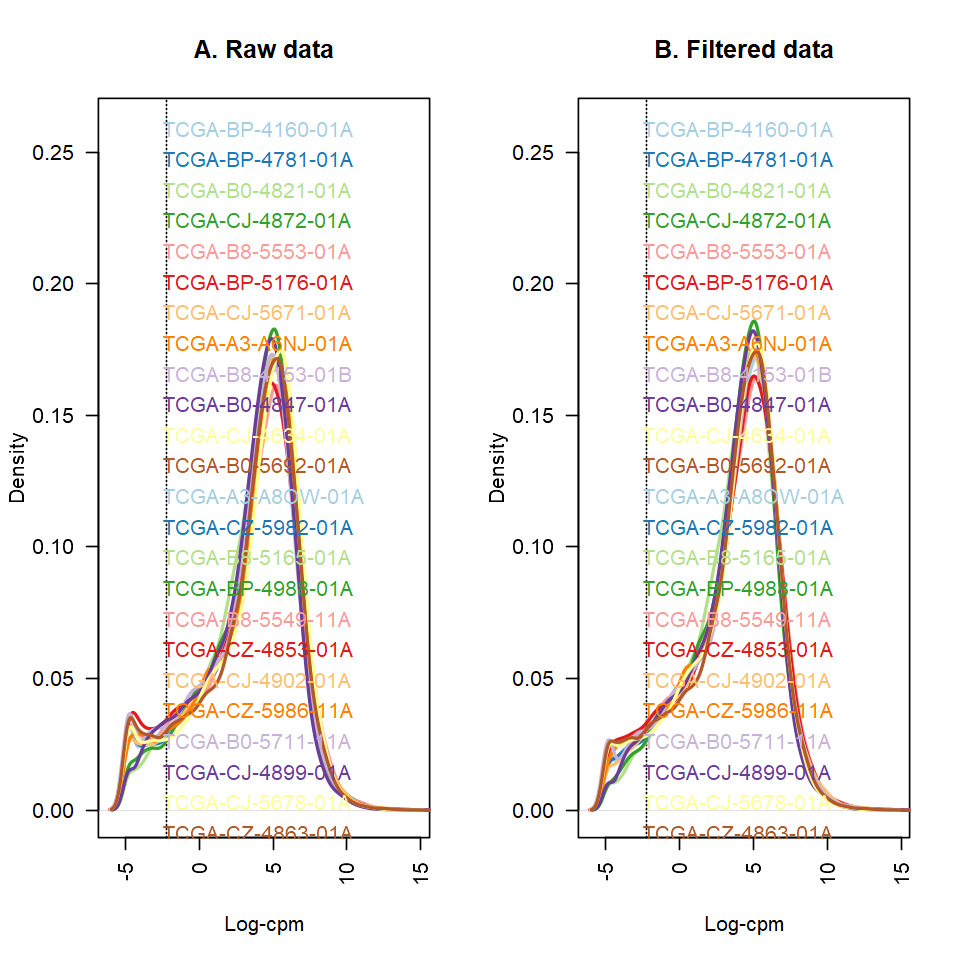

In [181]:
# visualize the data before and after the filtration 
cpm_log.cutoff <- log2(10/M + 2/L)
nsamples <- ncol(exp_lim)
col <- brewer.pal(nsamples, "Paired")
par(mfrow=c(1,2))
plot(density(cpm_log[,1]), col=col[1], lwd=2, ylim=c(0,0.26), las=2, main="", xlab="")
title(main="A. Raw data", xlab="Log-cpm")
abline(v=cpm_log.cutoff, lty=3)
for (i in 2:nsamples){
den <- density(cpm_log[,i])
lines(den$x, den$y, col=col[i], lwd=2)
}
legend("topright", colnames(exp_lim$counts), text.col=col, bty="n")
lcpm <- cpm(exp_lim, log=TRUE)
plot(density(lcpm[,1]), col=col[1], lwd=2, ylim=c(0,0.26), las=2, main="", xlab="")
title(main="B. Filtered data", xlab="Log-cpm")
abline(v=cpm_log.cutoff, lty=3)
for (i in 2:nsamples){
den <- density(lcpm[,i])
lines(den$x, den$y, col=col[i], lwd=2)
}
legend("topright", colnames(exp_lim$counts), text.col=col, bty="n")

In [182]:
# create design matrix by using the sample type
design <- model.matrix(~0+type)
colnames(design) <- gsub("type", "", colnames(design))
design

,Normal,Tumor
1,0,1
2,0,1
3,0,1
4,0,1
5,0,1
6,0,1
7,0,1
8,0,1
9,0,1
10,0,1


,group,lib.size,norm.factors
,<fct>,<dbl>,<dbl>
TCGA-BP-4160-01A,Tumor,33133107,1.0057035
TCGA-BP-4781-01A,Tumor,58190935,1.0500092
TCGA-B0-4821-01A,Tumor,56153782,0.9991735
TCGA-CJ-4872-01A,Tumor,59316861,1.0156671
TCGA-B8-5553-01A,Tumor,56991806,1.0259246
TCGA-BP-5176-01A,Tumor,61560195,0.8843264
TCGA-CJ-5671-01A,Tumor,51148672,0.9488534
TCGA-A3-A6NJ-01A,Tumor,55662738,1.0960166
TCGA-B8-4153-01B,Tumor,39466092,0.8724314


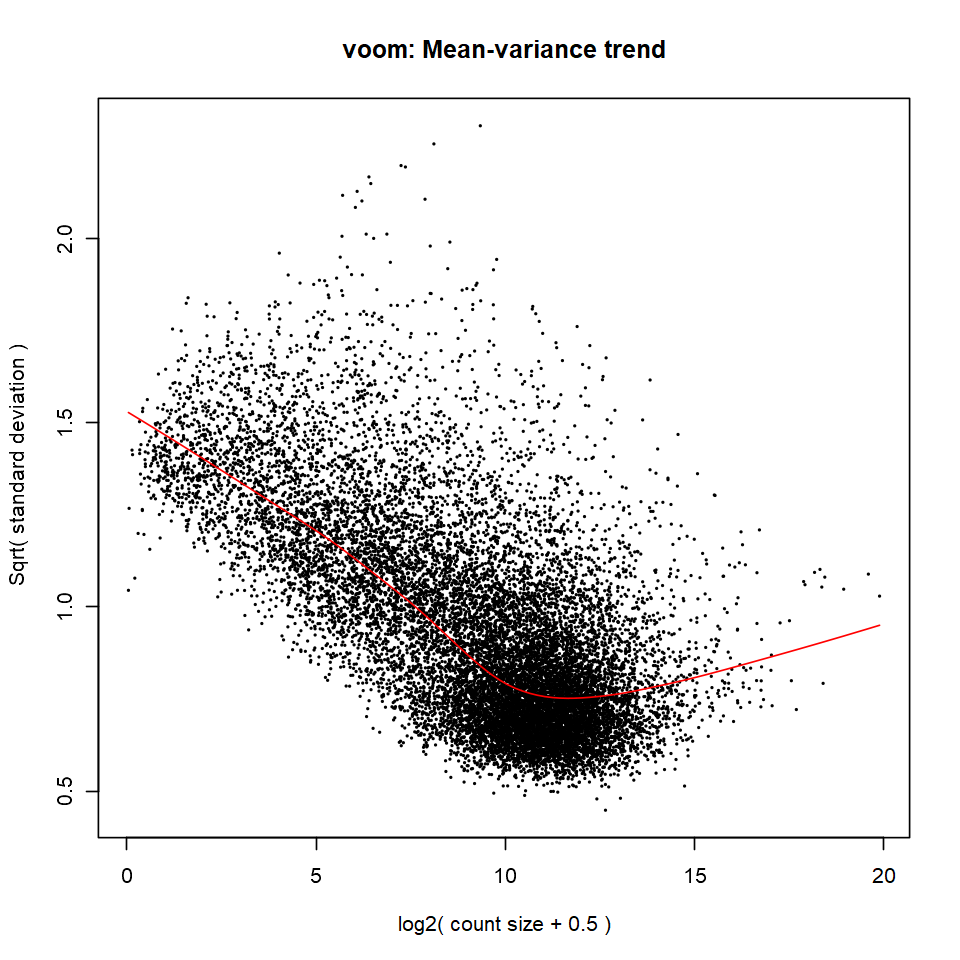

In [183]:
# apply voom function of exp data 
exp_lim_v <- voom(exp_lim, design, plot=TRUE)
exp_lim_v

In [184]:
length(exp_lim_v$gene)
dim(exp_lim$counts)

[1] 16012

[1] 16012   589

### 4- Comparision between different types of normalization

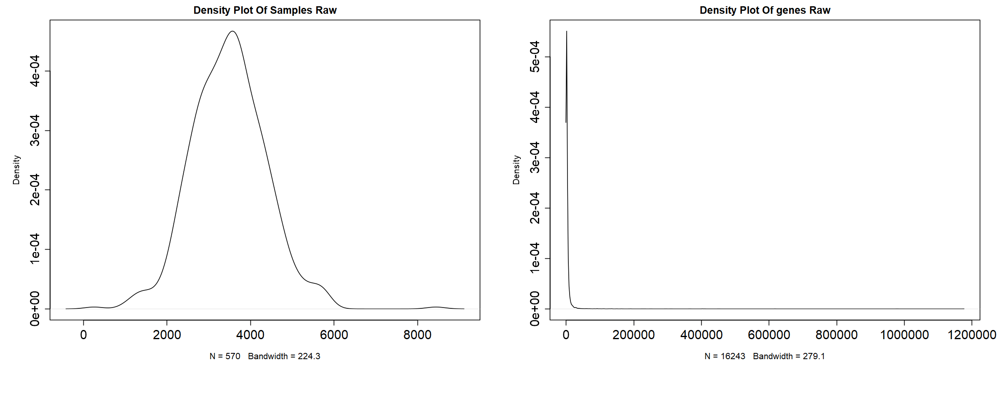

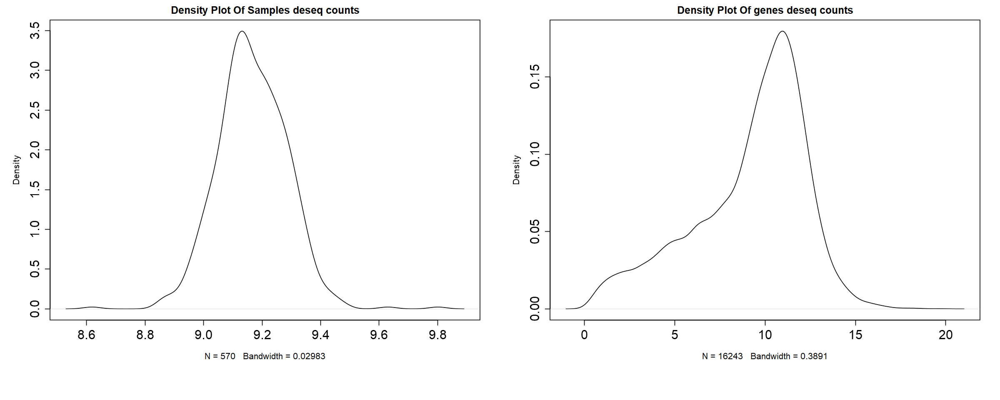

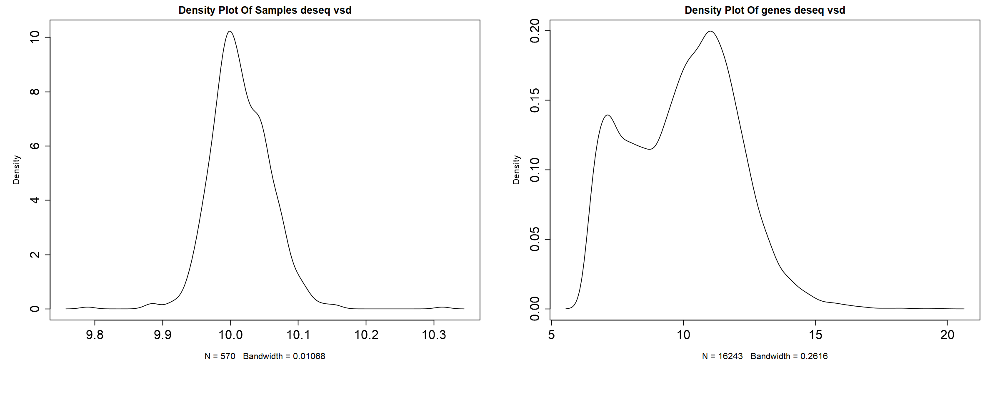

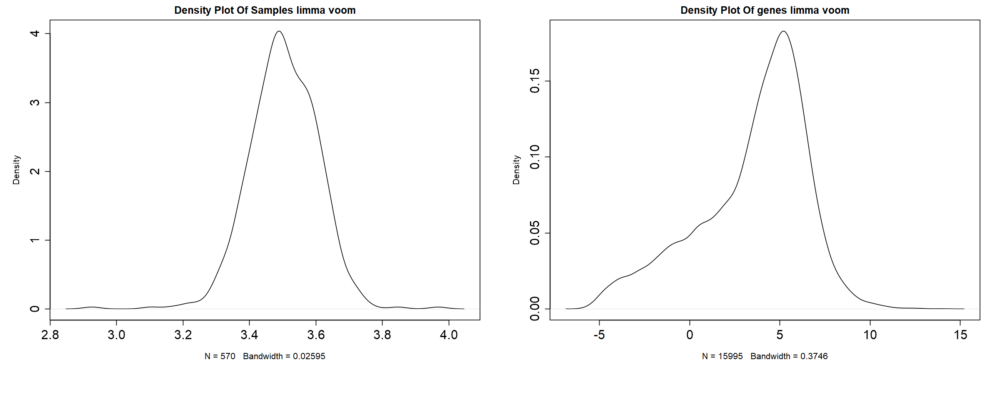

In [95]:
# distribution of samples and genes before and after normalization using different types of normalization
options(repr.plot.width=20,repr.plot.height=8)

par(mar = c(8,5,2,2),mfrow=c(1,2),cex.axis=1.5)
plot(density(apply(exp_counts4, 2, mean, na.rm = TRUE)), main='Density Plot Of Samples Raw')
plot(density(apply(exp_counts4, 1, mean, na.rm = TRUE)), main='Density Plot Of genes Raw')

par(mar = c(8,5,2,2),mfrow=c(1,2),cex.axis=1.5)
plot(density(apply(exp_log_deseq, 2, mean, na.rm = TRUE)), main='Density Plot Of Samples deseq counts')
plot(density(apply(exp_log_deseq, 1, mean, na.rm = TRUE)), main='Density Plot Of genes deseq counts')

par(mar = c(8,5,2,2),mfrow=c(1,2),cex.axis=1.5)
plot(density(apply(exp_deseq_vsd, 2, mean, na.rm = TRUE)), main='Density Plot Of Samples deseq vsd')
plot(density(apply(exp_deseq_vsd, 1, mean, na.rm = TRUE)), main='Density Plot Of genes deseq vsd')

par(mar = c(8,5,2,2),mfrow=c(1,2),cex.axis=1.5)
plot(density(apply(exp_lim_v$E, 2, mean, na.rm = TRUE)), main='Density Plot Of Samples limma voom')
plot(density(apply(exp_lim_v$E, 1, mean, na.rm = TRUE)), main='Density Plot Of genes limma voom')

### Scaling of normalized data

In [185]:
# scaling of deseq2 normalized data
exp_deseq_scaled <- t(scale(t(exp_log_deseq), center = TRUE, scale = TRUE))
head(exp_deseq_scaled)

,TCGA-BP-4160-01A,TCGA-BP-4781-01A,TCGA-B0-4821-01A,TCGA-CJ-4872-01A,TCGA-B8-5553-01A,TCGA-BP-5176-01A,TCGA-CJ-5671-01A,TCGA-A3-A6NJ-01A,TCGA-B8-4153-01B,TCGA-B0-4847-01A,⋯,TCGA-BP-4971-01A,TCGA-B0-4945-01A,TCGA-CZ-5452-01A,TCGA-CZ-5452-11A,TCGA-AS-3777-01A,TCGA-DV-A4VX-01A,TCGA-B0-4838-01A,TCGA-B0-5399-01A,TCGA-BP-4163-01A,TCGA-AK-3451-01A
CCDC105,-0.4560054,0.5645025,-0.4560054,-0.45600544,-0.4560054,-0.456005438,0.6672851,-0.4560054,-0.4560054,2.1471063,⋯,0.4721537,-0.4560054,-0.4560054,-0.4560054,0.8402959,1.0033705,0.5874251,-0.4560054,-0.4560054,-0.4560054
LCTL,-1.3628679,1.1025921,1.0906858,0.10692420,-0.6119449,-1.783858716,-0.2527231,-0.3443799,-0.9049640,1.6963619,⋯,1.2281391,0.7043608,-0.3421408,-2.5561500,0.3396532,0.5427101,-0.1682384,-1.3173995,0.9567949,-0.5805785
LRIT2,0.1748302,-0.9882057,0.4848715,-0.13715414,-0.4529911,0.042672147,1.1377215,0.1200485,1.8370374,1.2358167,⋯,-0.5027974,-0.9882057,0.1213534,-0.9882057,0.3039904,1.3640048,-0.1192876,0.2112073,-0.9882057,-0.9882057
ANGPTL6,-0.5976029,-1.6723489,0.8146044,-0.03619133,-1.3501257,-0.530992593,0.4760983,0.1759775,-0.5266928,0.6777550,⋯,0.8083463,-0.7885825,1.1039687,1.4197512,3.9285200,0.6818971,0.1604666,0.7301056,0.2283216,-0.6941211
RLN2,0.4165275,0.3989045,-0.5034365,0.27389831,1.1084117,0.003461759,-0.5754071,0.3238142,0.5903863,1.2504977,⋯,-1.0603848,0.2125035,-0.5561500,1.7403219,-0.3725925,-1.2422726,-0.1055565,0.2221797,-1.7331093,-1.0519860
CLEC4C,-0.4626579,-0.7799004,0.2626859,0.90654122,0.5352654,-0.417553855,0.6534467,0.2147569,-1.4835755,0.3113591,⋯,0.6784795,-0.7164741,0.2165944,-1.4835755,-0.1098548,-0.4772859,0.8266470,0.4468216,-0.5917464,-1.4835755


In [186]:
# scaling of lima with voom normalized data
exp_limv_scaled <- t(scale(t(exp_lim_v$E), center = TRUE, scale = TRUE))
head(exp_limv_scaled)

,TCGA-BP-4160-01A,TCGA-BP-4781-01A,TCGA-B0-4821-01A,TCGA-CJ-4872-01A,TCGA-B8-5553-01A,TCGA-BP-5176-01A,TCGA-CJ-5671-01A,TCGA-A3-A6NJ-01A,TCGA-B8-4153-01B,TCGA-B0-4847-01A,⋯,TCGA-BP-4971-01A,TCGA-B0-4945-01A,TCGA-CZ-5452-01A,TCGA-CZ-5452-11A,TCGA-AS-3777-01A,TCGA-DV-A4VX-01A,TCGA-B0-4838-01A,TCGA-B0-5399-01A,TCGA-BP-4163-01A,TCGA-AK-3451-01A
LCTL,-1.2451573,1.1081966,1.02287046,0.10947031,-0.5912182,-1.97344977,-0.2281296,-0.3275592,-0.8502379,1.6435514,⋯,1.1531032,0.7112983,-0.3226145,-3.311309,0.3391494,0.5736273,-0.15589819,-1.4289597,0.9518396,-0.5268980
LRIT2,0.3492050,-1.1058504,0.52393228,-0.04081320,-0.3561435,0.15966753,1.1362822,0.2271113,1.7327118,1.2046027,⋯,-0.4973762,-1.0341329,0.2299281,-1.169910,0.3991920,1.3294523,-0.01232155,0.2960423,-0.8971061,-0.6616127
ANGPTL6,-0.5171284,-1.7754534,0.75874493,-0.03686915,-1.3848375,-0.49908276,0.4929571,0.1949051,-0.4889641,0.6624193,⋯,0.7514821,-0.7963910,1.1149964,1.448433,3.8149881,0.6938589,0.17190287,0.7324047,0.2336819,-0.6824205
RLN2,0.4567484,0.4028936,-0.55055297,0.26440062,1.1086580,0.04292803,-0.5574695,0.3297849,0.5958267,1.1921145,⋯,-1.1286510,0.2109289,-0.5371959,1.725422,-0.3802153,-1.2019401,-0.09836512,0.2183299,-1.7424247,-1.0348252
CLEC4C,-0.2509429,-0.7592608,0.26446435,0.88940937,0.5829875,-0.34901207,0.6806182,0.2723916,-1.4003704,0.3713364,⋯,0.6347769,-0.6626096,0.2761877,-1.837153,-0.0262128,-0.3072513,0.82741896,0.4703548,-0.4779430,-1.1521383
EDDM3A,-0.4288047,-0.8210385,-0.03110057,-0.83438517,-0.8065372,-0.09511853,-0.7312024,0.5651103,-0.5506186,-0.5387287,⋯,-0.9534052,0.9235359,-0.7871744,2.826276,-0.6111565,-0.4722540,-0.03963678,-0.8934481,-0.6039651,-0.3590751


In [187]:
# scaling of deseq2 vsd data
exp_vsd_scaled <- t(scale(t(exp_deseq_vsd), center = TRUE, scale = TRUE))
head(exp_vsd_scaled)

,TCGA-BP-4160-01A,TCGA-BP-4781-01A,TCGA-B0-4821-01A,TCGA-CJ-4872-01A,TCGA-B8-5553-01A,TCGA-BP-5176-01A,TCGA-CJ-5671-01A,TCGA-A3-A6NJ-01A,TCGA-B8-4153-01B,TCGA-B0-4847-01A,⋯,TCGA-BP-4971-01A,TCGA-B0-4945-01A,TCGA-CZ-5452-01A,TCGA-CZ-5452-11A,TCGA-AS-3777-01A,TCGA-DV-A4VX-01A,TCGA-B0-4838-01A,TCGA-B0-5399-01A,TCGA-BP-4163-01A,TCGA-AK-3451-01A
CCDC105,-0.359367694,0.4708825,-0.3593677,-0.35936769,-0.3593677,-0.3593677,0.5278705,-0.35936769,-0.3593677,1.4340732,⋯,0.4195560,-0.35936769,-0.35936769,-0.3593677,0.6241281,0.7159571,0.4835957,-0.35936769,-0.35936769,-0.3593677
LCTL,-0.947284740,0.8443580,0.8316653,-0.05253062,-0.5362629,-1.1561705,-0.3082982,-0.36886973,-0.7054669,1.5507440,⋯,0.9815273,0.44767292,-0.36741068,-1.7259122,0.1301427,0.3019295,-0.2508842,-0.92421245,0.69257651,-0.5173212
LRIT2,0.006008337,-0.8268038,0.2293944,-0.19176002,-0.3759469,-0.0804989,0.8294647,-0.03040027,1.7564446,0.9390848,⋯,-0.4046334,-0.82680383,-0.02954235,-0.8268038,0.0952658,1.0914919,-0.1809867,0.03064555,-0.82680383,-0.8268038
ANGPTL6,-0.600814733,-1.1906143,0.6188568,-0.19379392,-1.0331801,-0.5568670,0.2627311,-0.01573610,-0.5539932,0.4691568,⋯,0.6118343,-0.72112761,0.96306869,1.3854554,6.9448442,0.4735707,-0.0292574,0.52547532,0.03050339,-0.6626425
RLN2,0.241943512,0.2223580,-0.6118029,0.08744599,1.1335086,-0.1816146,-0.6659846,0.14048349,0.4429694,1.3491684,⋯,-0.9934945,0.02369521,-0.65164089,2.1890356,-0.5091625,-1.1015315,-0.2818474,0.03363558,-1.36143015,-0.9883282
CLEC4C,-0.396124828,-0.5925676,0.1054226,0.66594042,0.3262261,-0.3675670,0.4291107,0.06876338,-1.2268533,0.1432806,⋯,0.4515061,-0.55360499,0.07015772,-1.2268533,-0.1649574,-0.4053381,0.5886196,0.25216673,-0.47674062,-1.2268533


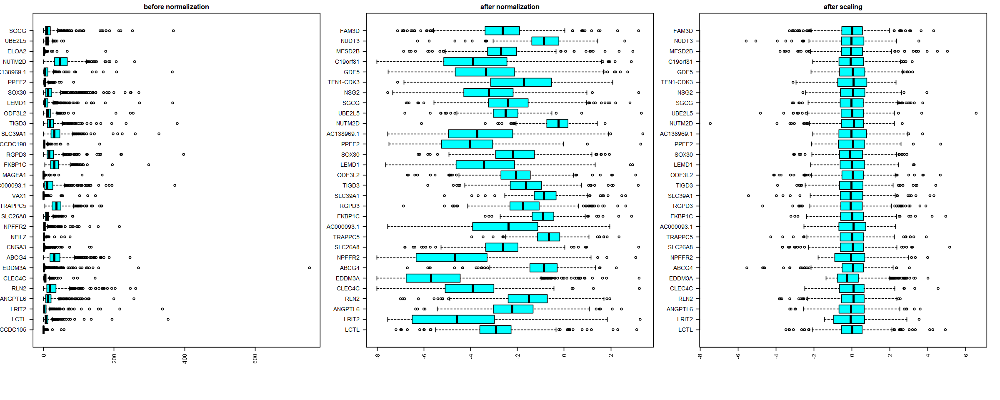

In [99]:
# distribution of genes before normalization, after normalization and after scaling
par(mar = c(8,5,2,2),mfrow=c(1,3))
boxplot(t(exp_counts4)[,1:30], main="before normalization", horizontal=T, names=rownames(exp_counts4)[1:30],las=2,
       col = "cyan")
boxplot(t(exp_lim_v$E)[,1:30], main="after normalization", horizontal=T, names=rownames(exp_lim_v$E)[1:30],las=2,
       col = "cyan")
boxplot(t(exp_limv_scaled)[,1:30], main="after scaling", horizontal=T, names=rownames(exp_lim_v$E)[1:30],las=2,
       col = "cyan")


### 5- Save the normalized data and scaled data to be used for downstream analysis

In [188]:
write(exp_log_deseq, "exp_log_deseq.csv")

In [189]:
write.csv(exp_deseq_scaled, "exp_deseq_scaled.csv")

In [190]:
write.csv(exp_lim_v$E, "exp_limv_norm.csv")

In [191]:
write.csv(exp_limv_scaled, "exp_limv_scaled.csv")

In [192]:
write.csv(exp_deseq_vsd, "exp_deseq_vsd.csv")

In [193]:
write.csv(exp_vsd_scaled, "exp_vsd_scaled.csv")

### 6- Clustering and PCA of Normalized data

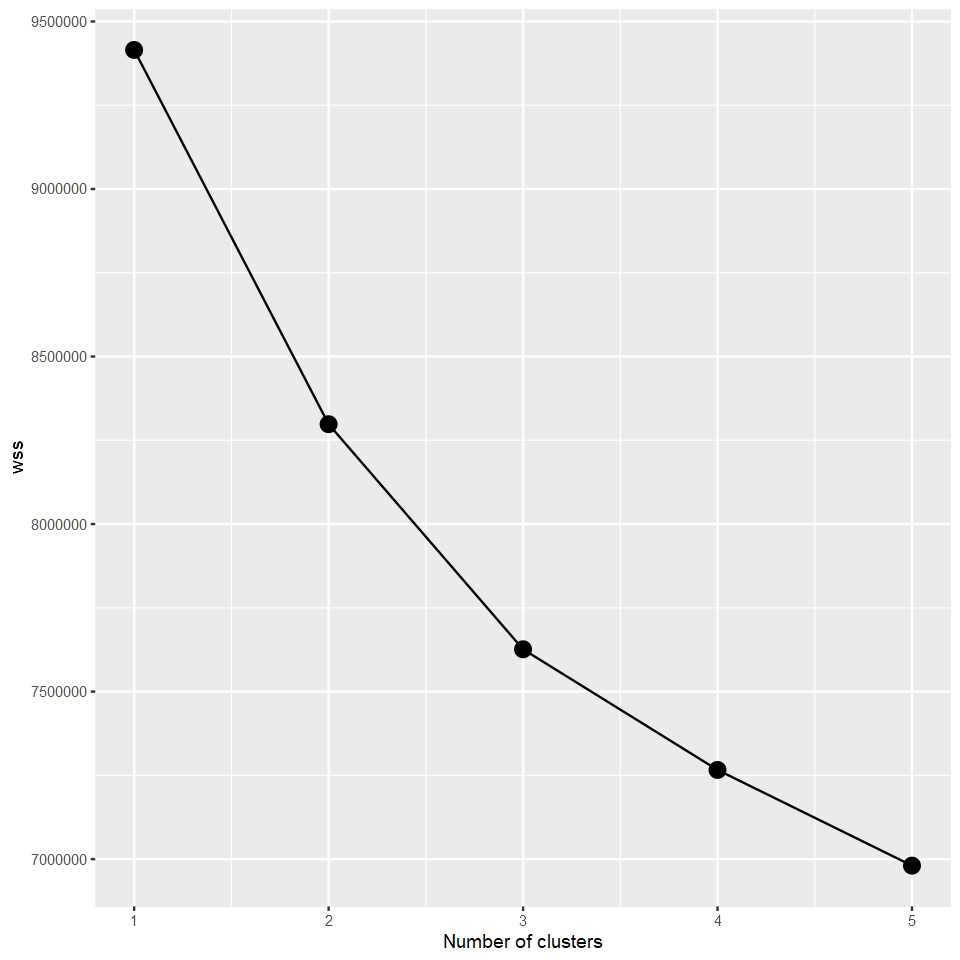

In [194]:
# Decide how many clusters to look at
n_clusters <- 5

# Initialize total within sum of squares error: wss
wss <- numeric(n_clusters)

set.seed(123)

# Look over 1 to n possible clusters
for (i in 1:n_clusters) {
  # Fit the model: km.out
  km.out <- kmeans(t(exp_limv_scaled), centers = i, nstart = 5)
  # Save the within cluster sum of squares
  wss[i] <- km.out$tot.withinss
}

# Produce a scree plot
wss_df <- tibble(clusters = 1:n_clusters, wss = wss)
 
scree_plot <- ggplot(wss_df, aes(x = clusters, y = wss, group = 1)) +
    geom_point(size = 4)+
    geom_line() +
    scale_x_continuous(breaks = c(1, 2, 3, 4, 5)) +
    xlab('Number of clusters')
scree_plot

In [196]:
# clsudtering by using k=2
km2 <- kmeans(t(exp_limv_scaled), centers = 2, nstart = 15)

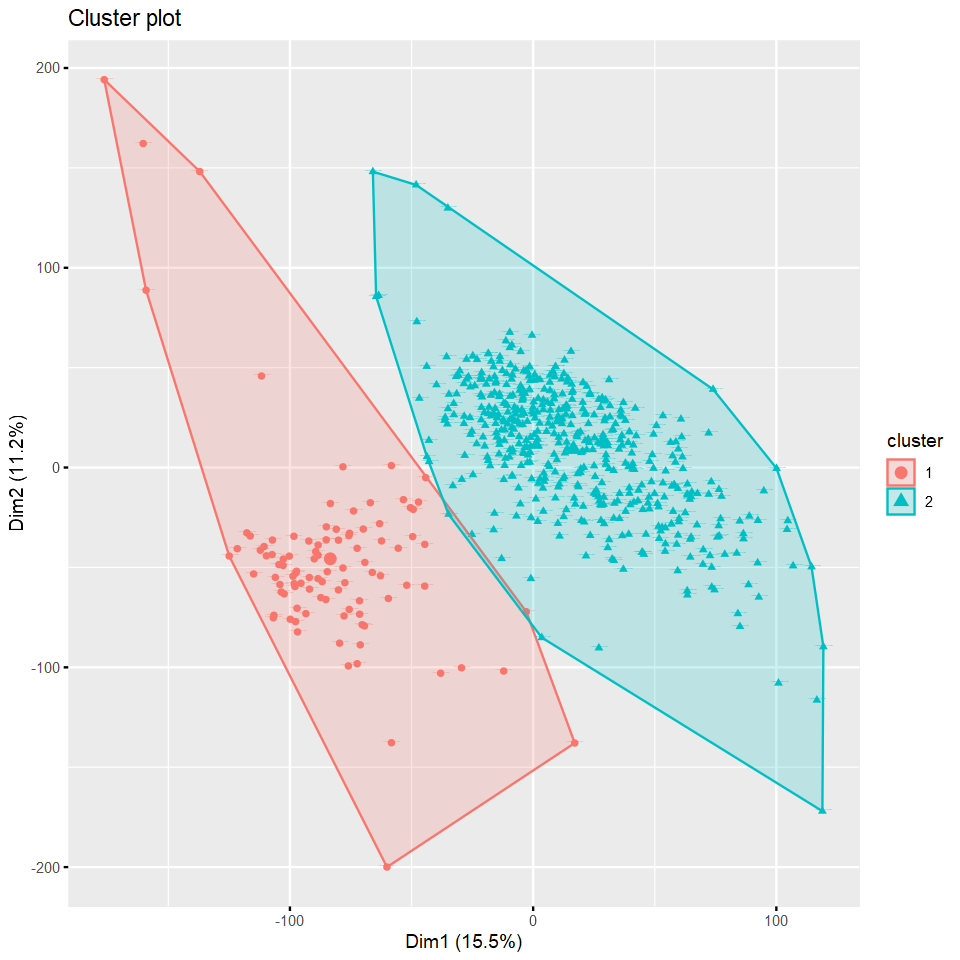

In [197]:
# visualize clustering by k=2
fviz_cluster(km2, data = t(exp_limv_scaled), ellipse = T, labelsize = 1 )


In [198]:
km2$cluster

TCGA-BP-4160-01A TCGA-BP-4781-01A TCGA-B0-4821-01A TCGA-CJ-4872-01A 
               2                2                2                2 
TCGA-B8-5553-01A TCGA-BP-5176-01A TCGA-CJ-5671-01A TCGA-A3-A6NJ-01A 
               2                2                2                2 
TCGA-B8-4153-01B TCGA-B0-4847-01A TCGA-CJ-4634-01A TCGA-B0-5692-01A 
               2                2                2                2 
TCGA-A3-A8OW-01A TCGA-CZ-5982-01A TCGA-B8-5165-01A TCGA-BP-4988-01A 
               2                2                2                2 
TCGA-B8-5549-11A TCGA-CZ-4853-01A TCGA-CJ-4902-01A TCGA-CZ-5986-11A 
               1                2                2                1 
TCGA-B0-5711-11A TCGA-CJ-4899-01A TCGA-CJ-5678-01A TCGA-CZ-4863-01A 
               1                2                2                2 
TCGA-BP-4995-01A TCGA-CW-5580-11A TCGA-B8-A54D-01A TCGA-BP-4991-01A 
               1                1                2                2 
TCGA-BP-4327-01A TCGA-BP-4756-01A TCGA-B8-A54K-01A TCGA-BP-4345-01A 
               2                2                2                2 
TCGA-A3-3346-01A TCGA-CZ-5982-11A TCGA-B8-5549-01A TCGA-BP-4801-01A 
               2                1                2                2 
TCGA-B0-4834-01A TCGA-A3-3331-01A TCGA-CJ-4912-01A TCGA-CZ-5459-01A 
               1                2                2                2 
TCGA-AK-3460-01A TCGA-CW-5587-11A TCGA-CJ-5683-01A TCGA-B0-5400-01A 
               2                1                2                2 
TCGA-BP-5183-01A TCGA-B2-5633-01A TCGA-B0-4841-01A TCGA-B8-A54I-01A 
               2                2                2                2 
TCGA-CJ-4905-01A TCGA-BP-5168-01A TCGA-CJ-6033-01A TCGA-BP-4331-01A 
               2                2                2                2 
TCGA-BP-4173-01A TCGA-BP-4969-01A TCGA-A3-3324-01A TCGA-A3-3385-01A 
               2                2                2                2 
TCGA-BP-4338-01A TCGA-BP-4787-01A TCGA-CZ-5466-01A TCGA-B0-4707-01A 
               2                2                2                2 
TCGA-A3-3320-01A TCGA-CJ-4873-01A TCGA-BP-4346-01A TCGA-B0-5700-01A 
               2                2                2                2 
TCGA-AK-3431-01A TCGA-A3-3322-01A TCGA-B0-5706-11A TCGA-A3-3326-01A 
               2                2                1                2 
TCGA-CJ-4907-01A TCGA-B0-4712-01A TCGA-BP-4768-01A TCGA-CZ-5470-11A 
               2                2                2                1 
TCGA-B0-5711-01A TCGA-CJ-5684-01A TCGA-CZ-5451-01A TCGA-B0-5083-01A 
               2                2                2                1 
TCGA-G6-A8L8-01A TCGA-BP-4983-01A TCGA-B0-5085-01A TCGA-BP-4998-01A 
               2                2                2                2 
TCGA-B0-4852-01A TCGA-BP-4326-01A TCGA-A3-3378-01A TCGA-CJ-4878-01A 
               2                2                2                2 
TCGA-CZ-5465-11A TCGA-BP-4993-01A TCGA-B0-4688-01A TCGA-BP-4765-01A 
               1                2                2                2 
TCGA-CW-5588-01A TCGA-CZ-4864-11A TCGA-CZ-4864-01A TCGA-B0-5705-11A 
               2                1                2                1 
TCGA-CZ-5455-01A TCGA-CJ-5680-11A TCGA-CJ-4637-01A TCGA-BP-4174-01A 
               2                1                2                2 
TCGA-B8-5546-01A TCGA-CJ-4870-01A TCGA-B8-4621-01A TCGA-EU-5906-01A 
               1                2                2                2 
TCGA-BP-4789-01A TCGA-BP-5010-01A TCGA-A3-3370-01A TCGA-CZ-5468-01A 
               2                2                2                2 
TCGA-B0-5706-01A TCGA-BP-4803-01A TCGA-CZ-5461-01A TCGA-B8-5545-01A 
               2                2                2                2 
TCGA-BP-4974-01A TCGA-B0-4845-01A TCGA-B0-5693-01A TCGA-AK-3443-01A 
               2                2                2                1 
TCGA-CJ-4894-01A TCGA-AK-3447-01A TCGA-B0-5697-11A TCGA-BP-4354-01A 
               2                1                1                2

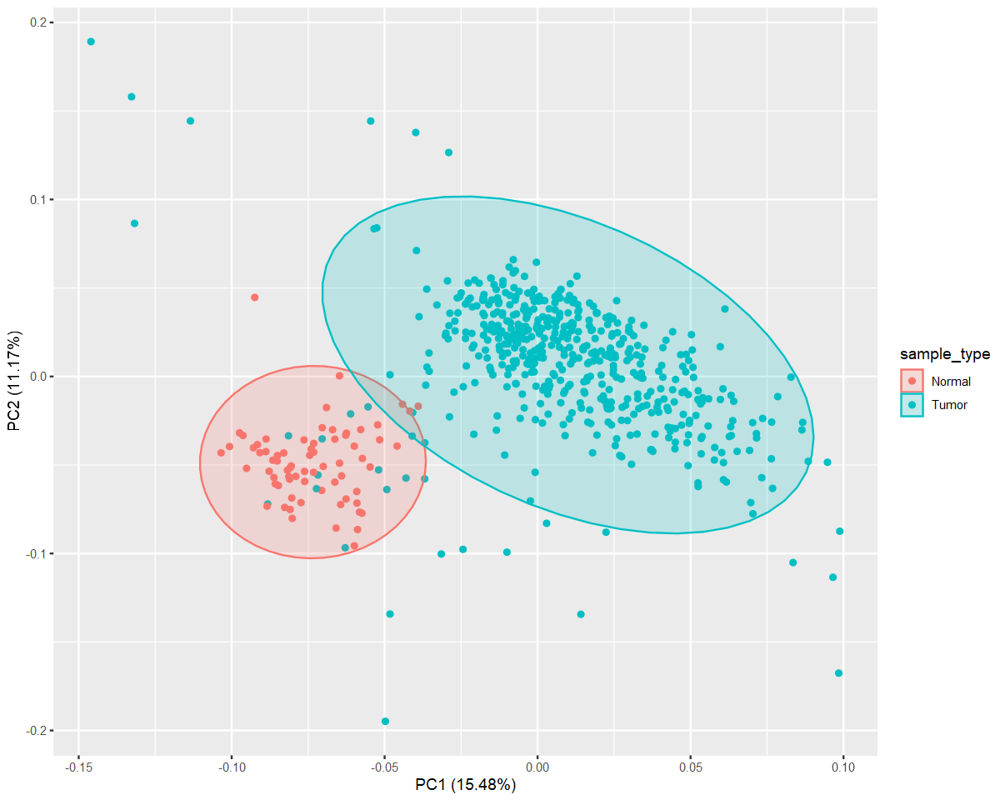

In [199]:
# PCA of normalized data
options(repr.plot.width=10,repr.plot.height=8)
norm_pca <- prcomp(t(exp_limv_scaled))
autoplot(norm_pca, frame = TRUE, frame.type= "norm", data=meta2, colour="sample_type")


### Differential Analysis between Tumor and Normal

#### 1- DESEQ2

In [200]:
# identify the two conditions to be used in the contrast of deseq2
cond1="Solid Tissue Normal" 
cond2="Primary Tumor"

In [201]:
# modify sample type to be factor
meta2$sample_type <- factor(meta2$sample_type)

In [202]:
# see the result of deseq DA 
exp_res_deseq=results(exp_dds.run, contrast = c("sample_type",cond1 ,cond2) )
head(exp_res_deseq)
tail(exp_res_deseq)

log2 fold change (MLE): sample_type Solid Tissue Normal vs Primary Tumor 
Wald test p-value: sample type Solid.Tissue.Normal vs Primary.Tumor 
DataFrame with 6 rows and 6 columns
         baseMean log2FoldChange     lfcSE      stat      pvalue        padj
        <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
CCDC105  0.844985      -2.101139  0.551454  -3.81018 1.38866e-04 2.11615e-04
LCTL    10.307173      -0.890601  0.171181  -5.20270 1.96412e-07 3.59716e-07
LRIT2    7.430801      -4.075551  0.384851 -10.58994 3.31804e-26 1.50334e-25
ANGPTL6 18.485546       0.918879  0.166699   5.51220 3.54369e-08 6.76940e-08
RLN2    25.770823       0.978359  0.155331   6.29855 3.00445e-10 6.47576e-10
CLEC4C   6.194952      -0.428366  0.231632  -1.84934 6.44087e-02 7.76509e-02

log2 fold change (MLE): sample_type Solid Tissue Normal vs Primary Tumor 
Wald test p-value: sample type Solid.Tissue.Normal vs Primary.Tumor 
DataFrame with 6 rows and 6 columns
        baseMean log2FoldChange     lfcSE      stat      pvalue        padj
       <numeric>      <numeric> <numeric> <numeric>   <numeric>   <numeric>
MT-ND2    439848      0.0843533  0.137318  0.614292 5.39022e-01 5.71609e-01
MT-CO2    459344      0.4068732  0.138493  2.937866 3.30480e-03 4.50637e-03
MT-CYB    495519      0.6622680  0.141147  4.692044 2.70489e-06 4.63602e-06
MT-CO3    685456      0.4263481  0.138270  3.083451 2.04615e-03 2.83895e-03
MT-ND4   1063267      0.2135869  0.136378  1.566134 1.17317e-01 1.37033e-01
MT-CO1   1277257      0.2378025  0.131754  1.804903 7.10898e-02 8.52878e-02

In [203]:
# check nan values and summary of deseq2 result
sum(is.na(exp_res_deseq$padj))
exp_res_deseq = exp_res_deseq[!is.na(exp_res_deseq$padj),]
summary(exp_res_deseq)


[1] 0


out of 16243 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)       : 5868, 36%
LFC < 0 (down)     : 7784, 48%
outliers [1]       : 0, 0%
low counts [2]     : 0, 0%
(mean count < 0)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



In [204]:
# filtering the res degs using cutoff of adj pval=0.05 and logFC>1 or logFC<-1
exp_res_deseq = as.data.frame(exp_res_deseq)
exp_deseq.degs = exp_res_deseq[exp_res_deseq$padj < 0.05 & abs(exp_res_deseq$log2FoldChange)>1,]
exp_deseq.degs=exp_deseq.degs[order(exp_deseq.degs$padj), ]
dim(exp_deseq.degs)
head(exp_deseq.degs)
tail(exp_deseq.degs)

[1] 4886    6

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
GABRD,855.2644,-5.942122,0.1579574,-37.61851,0.000000e+00,0.000000e+00
MFSD4A,3172.5269,5.275353,0.1298946,40.61255,0.000000e+00,0.000000e+00
NDUFA4L2,84154.4325,-7.167888,0.1607039,-44.60307,0.000000e+00,0.000000e+00
SPAG4,2556.9303,-4.399922,0.1178258,-37.34261,3.341986e-305,1.357097e-301
COL23A1,11198.4684,-5.926394,0.1636616,-36.21126,4.048748e-287,1.315276e-283
HILPDA,9380.2403,-5.175497,0.1438473,-35.97910,1.775887e-283,4.807623e-280


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
C10orf71,16.415818,1.452535,0.5992901,2.423759,0.01536080,0.01973155
HEPACAM2,794.936371,1.252784,0.5191392,2.413194,0.01581340,0.02029047
C11orf53,12.696848,1.329292,0.5835498,2.277940,0.02273012,0.02870960
MAGEC2,1.609370,-1.791313,0.8121957,-2.205518,0.02741774,0.03435254
ELSPBP1,4.480259,-1.029920,0.4926539,-2.090555,0.03656802,0.04524829
SPACA1,2.539373,1.084736,0.5238893,2.070544,0.03840142,0.04740134


In [205]:
# save the degs of deseq2
write.csv(exp_deseq.degs, "exp_degs_deseq_TvsN.csv")


In [206]:
# see the degs using higher cutoff 0.01 and 4
exp_res_deseq2 = as.data.frame(exp_res_deseq)
exp_deseq.degs2 = exp_res_deseq2[exp_res_deseq2$padj < 0.01 & abs(exp_res_deseq2$log2FoldChange)>4,]
exp_deseq.degs2=exp_deseq.degs2[order(exp_deseq.degs2$padj), ]
dim(exp_deseq.degs2)
head(exp_deseq.degs2)
tail(exp_deseq.degs2)

[1] 306   6

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
GABRD,855.2644,-5.942122,0.1579574,-37.61851,0.000000e+00,0.000000e+00
MFSD4A,3172.5269,5.275353,0.1298946,40.61255,0.000000e+00,0.000000e+00
NDUFA4L2,84154.4325,-7.167888,0.1607039,-44.60307,0.000000e+00,0.000000e+00
SPAG4,2556.9303,-4.399922,0.1178258,-37.34261,3.341986e-305,1.357097e-301
COL23A1,11198.4684,-5.926394,0.1636616,-36.21126,4.048748e-287,1.315276e-283
HILPDA,9380.2403,-5.175497,0.1438473,-35.97910,1.775887e-283,4.807623e-280


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SAA4,5.178045,-4.079641,0.5389096,-7.570177,3.727160e-14,9.888968e-14
KRT6B,7.767715,-4.059160,0.5378596,-7.546875,4.458245e-14,1.177676e-13
SP8,7.224867,-4.463777,0.6044315,-7.385082,1.523590e-13,3.917632e-13
ACTL8,4.680703,-4.321679,0.5929050,-7.288991,3.122847e-13,7.908388e-13
LY6L,4.199431,4.094099,0.6300367,6.498191,8.129134e-11,1.807303e-10
MAGEA3,3.838116,-4.210951,0.6661323,-6.321494,2.590466e-10,5.606520e-10


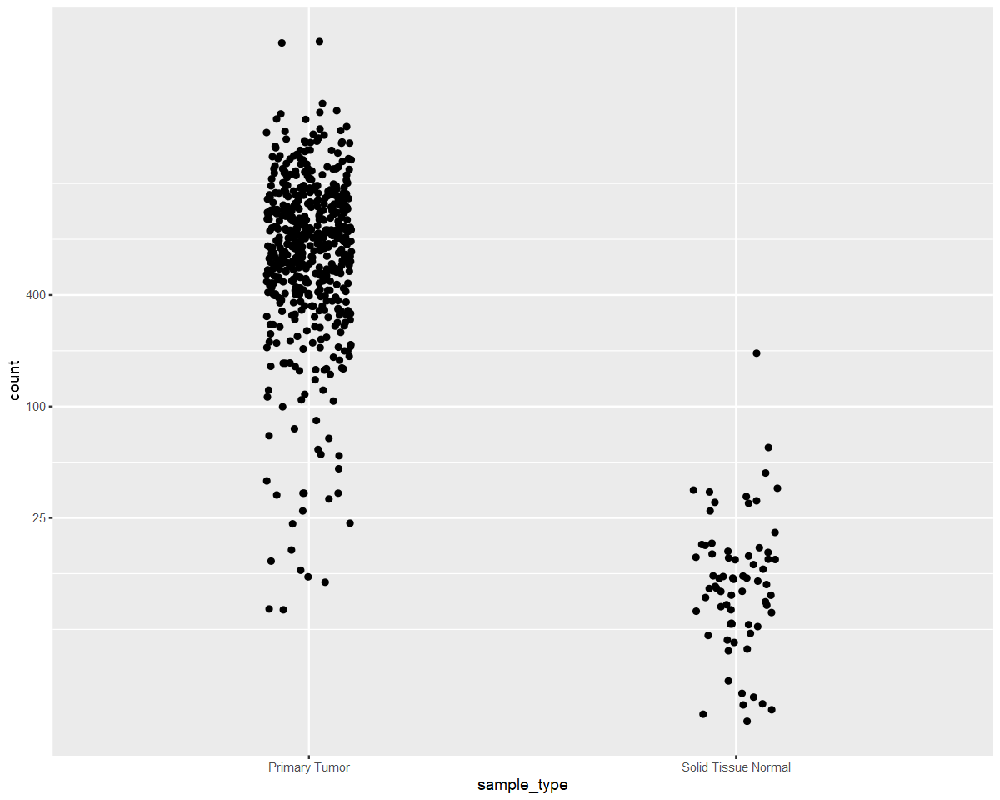

In [207]:
# plot the expression of some genes between normal and tumor
d <- plotCounts(exp_dds.run, gene="GABRD", intgroup="sample_type", 
                returnData=TRUE)

ggplot(d, aes(x=sample_type, y=count)) + 
  geom_point(position=position_jitter(w=0.1,h=0)) + 
  scale_y_log10(breaks=c(25,100,400))

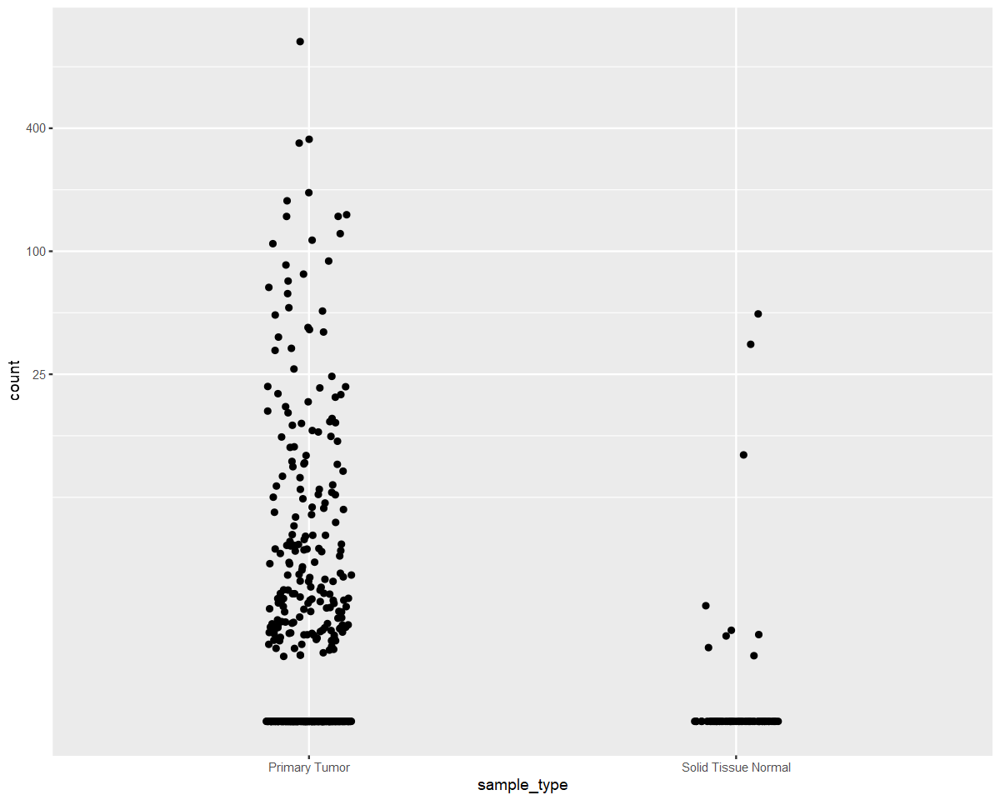

In [209]:
# plot the expression of some genes between normal and tumor
d <- plotCounts(exp_dds.run, gene="ACTL8", intgroup="sample_type", 
                returnData=TRUE)

ggplot(d, aes(x=sample_type, y=count)) + 
  geom_point(position=position_jitter(w=0.1,h=0)) + 
  scale_y_log10(breaks=c(25,100,400))

In [210]:
# save degs2 of deseq2
write.csv(exp_deseq.degs2, "exp_degs_deseq2_TvsN.csv")


### 2- Using Limma 

In [211]:
# make the contrast coditions of lima
contrast<-makeContrasts(Normal-Tumor,levels=design) # pos logfc means in cancer is more than normal


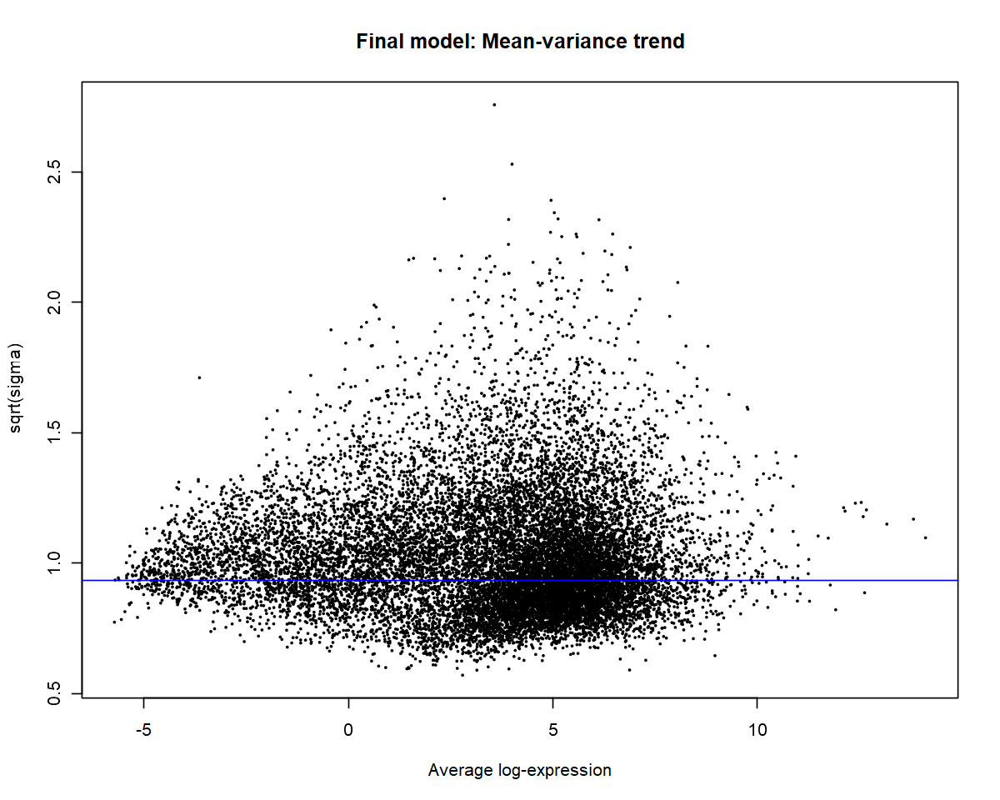

In [212]:
#fitting the lima linear model on voom data
vfit <- lmFit(exp_lim_v, design)
vfit <- contrasts.fit(vfit, contrast)
efit <- eBayes(vfit)
plotSA(efit, main="Final model: Mean-variance trend")

In [214]:
# see the result of DA by lima
exp_res_lim=topTable(efit, adjust.method='fdr', number=999999999,p.value=1,coef = 1)
dim(exp_res_lim)
head(exp_res_lim)
tail(exp_res_lim)

[1] 16012     7

,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SLC9A4,SLC9A4,9.953824,-3.010752,69.42409,2.581371e-286,4.133291e-282,645.4323
PRR35,PRR35,8.953268,-4.441257,68.43076,5.029443e-283,4.026572e-279,637.4723
AQP2,AQP2,14.618823,-1.768881,66.10023,3.691645e-275,1.970354e-271,619.6623
PIK3C2G,PIK3C2G,8.486834,-3.192685,65.77381,4.850807e-274,1.941778e-270,617.2314
FXYD4,FXYD4,11.331925,-2.608210,65.03116,1.764113e-271,5.649394e-268,611.4244
MUC15,MUC15,10.326964,-3.200575,64.80090,1.109095e-270,2.959805e-267,609.5723


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MED16,MED16,-0.0016510146,5.681902,-0.023038272,0.9816275,0.9832241,-8.670895
FBXO28,FBXO28,0.0017270763,5.725553,0.028897665,0.9769560,0.9793413,-8.671081
MCMBP,MCMBP,0.0001522231,5.968018,0.003151567,0.9974865,0.9979227,-8.671368
ENAH,ENAH,0.0022936823,5.842376,0.028250839,0.9774716,0.9796612,-8.671391
ORAI2,ORAI2,-0.0006956457,5.729024,-0.009025225,0.9928021,0.9937330,-8.671453
ALCAM,ALCAM,-0.0015476467,5.859259,-0.016215586,0.9870679,0.9882405,-8.671653


In [215]:
# use cutoff to filter the res of lima DA
exp_lim.degs <- exp_res_lim %>% filter(adj.P.Val < 0.05 & abs(logFC) >1)
dim(exp_lim.degs)
head(exp_lim.degs)

[1] 4749    7

,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SLC9A4,SLC9A4,9.953824,-3.010752,69.42409,2.581371e-286,4.133291e-282,645.4323
PRR35,PRR35,8.953268,-4.441257,68.43076,5.029443e-283,4.026572e-279,637.4723
AQP2,AQP2,14.618823,-1.768881,66.10023,3.691645e-275,1.970354e-271,619.6623
PIK3C2G,PIK3C2G,8.486834,-3.192685,65.77381,4.850807e-274,1.941778e-270,617.2314
FXYD4,FXYD4,11.331925,-2.608210,65.03116,1.764113e-271,5.649394e-268,611.4244
MUC15,MUC15,10.326964,-3.200575,64.80090,1.109095e-270,2.959805e-267,609.5723


In [216]:
# using higher cutoffs to filter the degs
exp_lim.degs2 <- exp_res_lim %>% filter(adj.P.Val < 0.01 & abs(logFC) >4)
dim(exp_lim.degs2)
head(exp_lim.degs2)

[1] 414   7

,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SLC9A4,SLC9A4,9.953824,-3.010752,69.42409,2.581371e-286,4.133291e-282,645.4323
PRR35,PRR35,8.953268,-4.441257,68.43076,5.029443e-283,4.026572e-279,637.4723
AQP2,AQP2,14.618823,-1.768881,66.10023,3.691645e-275,1.970354e-271,619.6623
PIK3C2G,PIK3C2G,8.486834,-3.192685,65.77381,4.850807e-274,1.941778e-270,617.2314
FXYD4,FXYD4,11.331925,-2.608210,65.03116,1.764113e-271,5.649394e-268,611.4244
MUC15,MUC15,10.326964,-3.200575,64.80090,1.109095e-270,2.959805e-267,609.5723


### Common DEGs between Deseq and lima

In [217]:
# common degs in general between deseq and lima
degs_deseq <- rownames(exp_deseq.degs)
degs_lim <- rownames(exp_lim.degs)
com_degs = intersect(degs_deseq, degs_lim)
length(com_degs)
com_degs

[1] 4026

[1] "GABRD"           "MFSD4A"          "NDUFA4L2"        "SPAG4"          
   [5] "COL23A1"         "HILPDA"          "FABP6"           "EGLN3"          
   [9] "FABP7"           "SCARB1"          "CDCA2"           "ACP3"           
  [13] "ANGPTL4"         "STC2"            "NPTX2"           "SLC6A3"         
  [17] "TNFAIP6"         "NOL3"            "MYOCOS"          "CD70"           
  [21] "SIGLEC8"         "TREM2"           "CDKN2A"          "PNCK"           
  [25] "NETO2"           "CA9"             "SEMA5B"          "HSF4"           
  [29] "SAP30"           "DDB2"            "FECH"            "ENPP3"          
  [33] "SLC16A3"         "GRIK3"           "APOC1"           "VEGFA"          
  [37] "HK2"             "ST8SIA4"         "KISS1R"          "DOC2A"          
  [41] "LILRB1"          "VIM"             "COL5A3"          "ADGRF3"         
  [45] "SLC1A4"          "ESRRB"           "KCNJ10"          "ZNF395"         
  [49] "MTURN"           "ODF3B"           "SDS"             "INHBB"          
  [53] "GPC5"            "HSPA2"           "CXCR4"           "MYLK3"          
  [57] "ENO2"            "ARHGAP22"        "IGFBP3"          "NXPH4"          
  [61] "ESM1"            "AGAP2"           "FCGR3A"          "LAMA4"          
  [65] "ELF5"            "MLKL"            "CYP2J2"          "CALB1"          
  [69] "GAL3ST4"         "STAMBPL1"        "MYEOV"           "CD40"           
  [73] "ENPP6"           "RALBP1"          "PIK3R5"          "CFAP74"         
  [77] "BHLHE41"         "FAM78A"          "TRPV2"           "DDN"            
  [81] "NNMT"            "IDO1"            "IRX2"            "CD1D"           
  [85] "TYMP"            "DOK3"            "RHBDF2"          "COLGALT1"       
  [89] "RASAL3"          "GAS2L3"          "TMEM155"         "IL2RB"          
  [93] "SLC15A4"         "SIGLEC10"        "GSTM3"           "ITGAX"          
  [97] "ATP1A1"          "HS6ST1"          "SOX11"           "TNFRSF4"        
 [101] "CD300A"          "SCD"             "RASD2"           "EDA2R"          
 [105] "TMEM74B"         "KRBA1"           "HTR6"            "DBT"            
 [109] "PARVG"           "HYKK"            "MTCP1"           "TMEM91"         
 [113] "ARHGEF39"        "RAB42"           "ERMP1"           "SLC12A1"        
 [117] "EHD2"            "PTHLH"           "PRDM1"           "DGKD"           
 [121] "CD300LF"         "PHKA2"           "FGF1"            "SLC4A11"        
 [125] "AHNAK2"          "DNAH11"          "PGF"             "ARMH4"          
 [129] "UXS1"            "MYO1F"           "LCP2"            "ITGAD"          
 [133] "HLA-F"           "TRPM2"           "C5orf46"         "FATE1"          
 [137] "GJC1"            "AKAP3"           "PLXDC1"          "CAV2"           
 [141] "PTPRE"           "KCNK9"           "LPCAT1"          "CLDN16"         
 [145] "SLC4A8"          "PDK1"            "HLA-B"           "SLC37A2"        
 [149] "IL20RB"          "TNFSF9"          "PSORS1C1"        "SHMT2"          
 [153] "DLX5"            "RNASET2"         "P2RX7"           "IGSF6"          
 [157] "ADORA3"          "TMCC1"           "HS6ST2"          "BIRC7"          
 [161] "LAIR1"           "WNK4"            "ADAM18"          "FUT11"          
 [165] "NKG7"            "RUNX3"           "ACSF2"           "VSIG1"          
 [169] "GNLY"            "TYROBP"          "ANGPT2"          "PLK2"           
 [173] "TRPV6"           "ARHGAP25"        "PRF1"            "LILRB4"         
 [177] "TYMS"            "OR2A4"           "PFKFB4"          "SLC20A2"        
 [181] "TAPBP"           "ALDH6A1"         "DUSP9"           "P2RY1"          
 [185] "CLUL1"           "MTOR"            "RANBP3L"         "ADM"            
 [189] "STAC3"           "HTRA4"           "ADAP2"           "PALD1"          
 [193] "SLC14A2"         "CES4A"           "PYGL"            "IKBIP"          
 [197] "PIK3R6"          "EGF"             "ELMO1"           "ADAMTS7"        
 [201] "PML"             "PLPPR5"          "MYO3A"   

In [218]:
# common degs between deseq and lima using the higher cutoff
degs_deseq2 <- rownames(exp_deseq.degs2)
degs_lim2 <- rownames(exp_lim.degs2)
com_degs2 = intersect(degs_deseq2, degs_lim2)
length(com_degs2)
com_degs2

[1] 188

[1] "GABRD"      "MFSD4A"     "NDUFA4L2"   "SPAG4"      "COL23A1"   
  [6] "HILPDA"     "FABP6"      "EGLN3"      "FABP7"      "SCARB1"    
 [11] "CDCA2"      "ACP3"       "ANGPTL4"    "STC2"       "NPTX2"     
 [16] "SLC6A3"     "TNFAIP6"    "MYOCOS"     "CD70"       "SIGLEC8"   
 [21] "TREM2"      "CDKN2A"     "PNCK"       "CA9"        "HSF4"      
 [26] "ENPP3"      "GRIK3"      "APOC1"      "KISS1R"     "DOC2A"     
 [31] "ESRRB"      "KCNJ10"     "SDS"        "INHBB"      "GPC5"      
 [36] "NXPH4"      "ELF5"       "CYP2J2"     "CALB1"      "MYEOV"     
 [41] "ENPP6"      "DDN"        "NNMT"       "IDO1"       "IRX2"      
 [46] "TMEM155"    "SOX11"      "HTR6"       "SLC12A1"    "PTHLH"     
 [51] "SLC4A11"    "DNAH11"     "ITGAD"      "C5orf46"    "KCNK9"     
 [56] "CLDN16"     "IL20RB"     "HS6ST2"     "BIRC7"      "WNK4"      
 [61] "ADAM18"     "TRPV6"      "OR2A4"      "DUSP9"      "RANBP3L"   
 [66] "HTRA4"      "SLC14A2"    "EGF"        "PLPPR5"     "GADL1"     
 [71] "HS3ST2"     "ATP12A"     "UNCX"       "MCHR1"      "SFRP1"     
 [76] "CPNE6"      "NOS1"       "CLDN19"     "PADI1"      "PTPRN"     
 [81] "KCNJ1"      "SIAH3"      "ABCA4"      "C10orf99"   "SOST"      
 [86] "ALOX15B"    "CCL18"      "PROX1"      "SH3GL3"     "NPHS1"     
 [91] "ERVMER34-1" "CRHBP"      "KNG1"       "SIM2"       "PPDPFL"    
 [96] "CASR"       "ADAMDEC1"   "XPNPEP2"    "EHF"        "CHP2"      
[101] "KCNE1B"     "RASL11B"    "TMEM52B"    "ALB"        "GP2"       
[106] "EDDM3A"     "SLC5A7"     "FLRT1"      "IRX1"       "TRPV5"     
[111] "TCF24"      "AQP2"       "COL4A6"     "IYD"        "SCGB3A2"   
[116] "SERPINA5"   "UMOD"       "MUC15"      "NRK"        "SLC22A8"   
[121] "GUCA2B"     "HPD"        "C4orf54"    "DIO1"       "TNNI1"     
[126] "TFAP2B"     "ASB15"      "DPEP1"      "COL26A1"    "KLRG2"     
[131] "NAT8L"      "PCARE"      "SPTBN2"     "FAM3B"      "ADH1C"     
[136] "SEMG2"      "F11"        "PTGER1"     "PRR35"      "CXCL13"    
[141] "MT1G"       "KCTD8"      "CD5L"       "TYRP1"      "TMEM207"   
[146] "SLC13A3"    "CLCNKA"     "ALDOB"      "SLC9A4"     "GAL3ST3"   
[151] "KLK7"       "GGT6"       "OLFM3"      "ACOT12"     "OVCH2"     
[156] "NTNG1"      "NPHS2"      "NELL1"      "SCN7A"      "OLFM4"     
[161] "RALYL"      "CYP4F2"     "SLC34A1"    "VGLL1"      "FABP1"     
[166] "MOGAT2"     "FXYD4"      "KLK6"       "SLC13A2"    "SLC12A3"   
[171] "CYP2B6"     "SGCZ"       "SLC36A2"    "MT1H"       "PIK3C2G"   
[176] "PLPPR1"     "SCNN1G"     "FRG2C"      "CRISP2"     "MAPK4"     
[181] "LMX1B"      "CA10"       "MCCD1"      "GABRA2"     "ADAMTS19"  
[186] "ADGRF1"     "SLC7A13"    "HMX2"

In [219]:
# see the up and down regulated genes of lima
lim.degs_up <- exp_res_lim %>% filter(adj.P.Val < 0.05 & logFC > 1)
lim.degs_down <- exp_res_lim %>% filter(adj.P.Val < 0.05 & logFC <(-1))

dim(lim.degs_up)
head(lim.degs_up)

dim(lim.degs_down)
head(lim.degs_down)

[1] 2385    7

,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SLC9A4,SLC9A4,9.953824,-3.010752,69.42409,2.581371e-286,4.133291e-282,645.4323
PRR35,PRR35,8.953268,-4.441257,68.43076,5.029443e-283,4.026572e-279,637.4723
AQP2,AQP2,14.618823,-1.768881,66.10023,3.691645e-275,1.970354e-271,619.6623
PIK3C2G,PIK3C2G,8.486834,-3.192685,65.77381,4.850807e-274,1.941778e-270,617.2314
FXYD4,FXYD4,11.331925,-2.608210,65.03116,1.764113e-271,5.649394e-268,611.4244
MUC15,MUC15,10.326964,-3.200575,64.80090,1.109095e-270,2.959805e-267,609.5723


[1] 2364    7

,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
VIM,VIM,-2.780688,10.360496,-27.83647,1.374366e-109,7.944530e-108,239.2344
NDUFA4L2,NDUFA4L2,-6.680428,9.305742,-27.52262,6.065960e-108,3.396089e-106,235.5354
VEGFA,VEGFA,-3.318791,9.981199,-25.74025,1.456307e-98,6.939996e-97,213.8291
CXCR4,CXCR4,-3.044222,7.202286,-25.68534,2.838502e-98,1.344677e-96,213.1613
C3,C3,-4.600205,9.749950,-24.25946,9.717083e-91,3.999741e-89,195.8039
HLA-B,HLA-B,-1.933606,11.245982,-24.16491,3.072097e-90,1.235940e-88,194.7759


In [220]:
# see the up and down regulated genes of deseq
degs_deseq_up <- exp_res_deseq[exp_res_deseq$padj < 0.05 & exp_res_deseq$log2FoldChange>1,]
degs_deseq_down <- exp_res_deseq[exp_res_deseq$padj < 0.05 & exp_res_deseq$log2FoldChange<(-1),]


dim(degs_deseq_up)
head(degs_deseq_up)

dim(degs_deseq_down)
head(degs_deseq_down)

[1] 1772    6

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
EDDM3A,6.699845,5.137006,0.2783906,18.452514,4.977489e-76,1.306129e-74
CNGA3,4.128594,1.989572,0.3547412,5.608516,2.040683e-08,3.948871e-08
NPFFR2,6.893763,1.060325,0.3210246,3.302939,9.567717e-04,1.362873e-03
RGPD3,23.680012,1.049734,0.1388449,7.560480,4.015832e-14,1.063577e-13
SOX30,20.653550,1.991994,0.1507818,13.211098,7.571155e-40,5.798127e-39
SGCG,16.879539,1.360849,0.1755588,7.751529,9.079290e-15,2.479066e-14


[1] 3114    6

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CCDC105,0.8449854,-2.101139,0.5514543,-3.810179,1.388665e-04,2.116154e-04
LRIT2,7.4308006,-4.075551,0.3848512,-10.589940,3.318037e-26,1.503344e-25
NFILZ,2.1185073,-3.001908,0.3299149,-9.099039,9.113480e-20,3.158316e-19
VAX1,1.4814164,-1.101195,0.4430333,-2.485580,1.293406e-02,1.672941e-02
AC000093.1,18.7217561,-3.748788,0.2360568,-15.880869,8.597916e-57,1.203931e-55
ODF3L2,16.7003690,-1.269722,0.1454093,-8.732050,2.500977e-18,8.116556e-18


In [221]:
# common genes downregulated
degs_deseq_down <- rownames(degs_deseq_down)
degs_lim_down <- rownames(lim.degs_down)
com_degs_down = intersect(degs_deseq_down, degs_lim_down)
length(com_degs_down)
com_degs_down

[1] 2321

[1] "LRIT2"           "AC000093.1"      "PPEF2"           "AC138969.1"     
   [5] "TEN1-CDK3"       "FBXO39"          "VIP"             "CNIH2"          
   [9] "ACR"             "IZUMO1"          "GPR150"          "OR9Q1"          
  [13] "C17orf49"        "KIF25"           "CYP3A43"         "AKR1C8P"        
  [17] "LINGO3"          "SOX21"           "LIN37"           "RETN"           
  [21] "MSH5-SAPCD1"     "GPS2"            "PDE6C"           "ANKRD33"        
  [25] "SPATA21"         "CYP4F22"         "SCO2"            "C20orf202"      
  [29] "AC119396.1"      "RPP21"           "TMPRSS5"         "ODAPH"          
  [33] "OR52N4"          "ADAM29"          "SOX1"            "HOXC12"         
  [37] "CEACAM3"         "SAA4"            "C20orf203"       "TUBB3"          
  [41] "SPDYE3"          "RTP2"            "CASP5"           "EIF4EBP3"       
  [45] "CCDC73"          "HES5"            "INSL3"           "TRIM34"         
  [49] "LINC00514"       "SGSM3"           "RDM1"            "ZDHHC19"        
  [53] "AC008676.3"      "LSMEM1"          "CPT1B"           "DNASE2B"        
  [57] "HORMAD1"         "DMRT3"           "CST1"            "SNX15"          
  [61] "FXYD1"           "KIR2DL4"         "GPR19"           "CDRT4"          
  [65] "RBM44"           "P2RX3"           "GPR55"           "LYZL1"          
  [69] "SYNGR4"          "ANKRD40CL"       "MIXL1"           "C1orf127"       
  [73] "HOXC13"          "PCDHGC4"         "C5orf58"         "TREML1"         
  [77] "NME8"            "ILK"             "GPA33"           "SERPINA12"      
  [81] "FLT3LG"          "NCR3"            "AC072022.2"      "ZIC4"           
  [85] "CIBAR2"          "ARID3C"          "CHKB"            "SEC16B"         
  [89] "ASIC4"           "DMBT1"           "ANKRD23"         "KLRC1"          
  [93] "NME2"            "CCER2"           "RTEL1"           "POLR2J3"        
  [97] "PRKCG"           "KRT6B"           "RFPL2"           "PROX2"          
 [101] "TSKS"            "SAPCD1"          "AC093512.2"      "CCDC188"        
 [105] "ARMC12"          "AC010422.8"      "MYL4"            "TMIGD2"         
 [109] "TEX52"           "OR2AT4"          "HHIPL2"          "AL117339.4"     
 [113] "LAT"             "FBXO43"          "TAS2R20"         "NLRP7"          
 [117] "ALK"             "HYPK"            "SMCO2"           "IL10"           
 [121] "AC244197.3"      "PCDHGC5"         "WNT10B"          "PADI4"          
 [125] "GATA1"           "HOXA4"           "TAS2R19"         "DLX6"           
 [129] "DLEU7"           "FOXB1"           "PLPPR3"          "AC006254.1"     
 [133] "ADORA2A"         "CLEC19A"         "MPP4"            "CDHR4"          
 [137] "CDH26"           "ZIC5"            "DCDC2B"          "KPNA7"          
 [141] "CACNA1I"         "SLFN14"          "ANKK1"           "TAS2R5"         
 [145] "TM4SF19"         "MTFP1"           "IL10RB"          "SMC1B"          
 [149] "ACTL8"           "FAM9B"           "BBS1"            "ALOX12B"        
 [153] "SARNP"           "RPS10"           "AC107871.1"      "GOLGA6L10"      
 [157] "TEX29"           "SLC46A2"         "RBM46"           "ASNS"           
 [161] "GPC2"            "LIPN"            "HASPIN"          "PRTN3"          
 [165] "ITIH4"           "RHEBL1"          "KLF1"            "PRSS21"         
 [169] "MYOT"            "RAB4B"           "TNFRSF13B"       "KLRK1"          
 [173] "NKX2-3"          "GCNT7"           "DCST1"           "UTS2"           
 [177] "OTOA"            "CCL14"           "OTOG"            "FRMPD3"         
 [181] "LYG2"            "ADAMTS20"        "MLC1"            "ADGRE3"         
 [185] "RGL4"            "GOLGA8S"         "OBP2A"           "CHMP4A"         
 [189] "ABCB6"           "AL031708.1"      "UPK2"            "FFAR2"          
 [193] "SLC16A8"         "SIGLEC6"         "ST20"            "IHO1"           
 [197] "CCDC60"          "AC068831.6"      "SGO1"            "RASL10A"        
 [201] "ANKLE1"          "LRRC71"          "SPNS1"   

In [222]:
# common genes upregulated
degs_deseq_up <- rownames(degs_deseq_up)
degs_lim_up <- rownames(lim.degs_up)
com_degs_up = intersect(degs_deseq_up, degs_lim_up)
length(com_degs_up)
com_degs_up

[1] 1699

[1] "EDDM3A"     "NPFFR2"     "SOX30"      "SGCG"       "PRMT8"     
   [6] "ACSBG2"     "MAFA"       "GABRA4"     "RGS8"       "KLK5"      
  [11] "RNF223"     "CDH10"      "SPHKAP"     "KCNE1B"     "SLC5A7"    
  [16] "CBS"        "CPA1"       "FOXN4"      "CALCB"      "SERTM1"    
  [21] "GFRA3"      "TTC36"      "AC005041.1" "C6orf52"    "OLFM3"     
  [26] "SMIM35"     "PMP2"       "DPPA2"      "PCSK2"      "KCNA4"     
  [31] "KCTD8"      "FOXN1"      "SAMD13"     "RSPO1"      "SRARP"     
  [36] "KIAA1210"   "RAET1E"     "TCF24"      "C9orf135"   "ZBTB8B"    
  [41] "C10orf82"   "VWA3B"      "C11orf16"   "KCNS2"      "SERPINB7"  
  [46] "WNT8B"      "HMX2"       "MYBPH"      "ATP6V1G2"   "ATP13A5"   
  [51] "DRC1"       "RIPPLY3"    "SSUH2"      "DLX3"       "PNMT"      
  [56] "C9orf152"   "ADAMTS19"   "RSPH4A"     "TMEM40"     "HTR3B"     
  [61] "LPA"        "DLGAP3"     "GPR63"      "LHFPL3"     "REG4"      
  [66] "PLEKHG7"    "ATP4B"      "STRIT1"     "SLC7A14"    "DACH2"     
  [71] "UNCX"       "KCNA1"      "RASL11B"    "SAXO2"      "NKAPL"     
  [76] "PCARE"      "SH2D6"      "PPM1J"      "UTS2R"      "GLRA3"     
  [81] "FNDC11"     "NAT2"       "GAL"        "KIRREL2"    "KCNE1"     
  [86] "ADGRA1"     "GABRG3"     "NDST3"      "IGFALS"     "PCSK9"     
  [91] "RIPPLY1"    "IMPG2"      "FAM181B"    "MS4A10"     "UBE2U"     
  [96] "AXDND1"     "UMODL1"     "KCNG3"      "PPP4R4"     "RIMS4"     
 [101] "RBBP8NL"    "MKRN2OS"    "PFKFB1"     "LINGO2"     "PPP1R1C"   
 [106] "CRISP2"     "TMSB4Y"     "SLC6A4"     "NMUR2"      "ERC2"      
 [111] "GASK1A"     "ZNF98"      "PLCZ1"      "CYP2C18"    "TBL1Y"     
 [116] "TCEAL5"     "ANKRD34B"   "FBXL22"     "LDHC"       "CBARP"     
 [121] "SHBG"       "NTRK1"      "SOX10"      "MMEL1"      "SCGB2A1"   
 [126] "DNAI3"      "RBP2"       "CADM2"      "CACNA1S"    "MCF2"      
 [131] "ZNF750"     "MEIOC"      "WFIKKN2"    "S100A5"     "TTPA"      
 [136] "SLC7A4"     "KHDRBS2"    "CATIP"      "SGCZ"       "IL5RA"     
 [141] "LRRC52"     "ACOT12"     "ANKRD45"    "RBM11"      "EML5"      
 [146] "TSLP"       "TRDN"       "ACBD7"      "MRLN"       "NLGN3"     
 [151] "GPR182"     "GATA5"      "FETUB"      "DRD1"       "NYAP1"     
 [156] "TBC1D30"    "EDN3"       "SRD5A2"     "OVOL2"      "LRRIQ3"    
 [161] "DGKB"       "GABRB1"     "BPI"        "KLHL33"     "STYK1"     
 [166] "NCAM2"      "CHP2"       "CYP51A1"    "SSTR5"      "NRL"       
 [171] "MGAT4C"     "CCDC187"    "ZNF804B"    "SEMG2"      "GRIK2"     
 [176] "PCDHB1"     "ZNF556"     "TINCR"      "M1AP"       "AGBL4"     
 [181] "HS3ST5"     "C10orf71"   "CDH18"      "FGFBP1"     "PRPH2"     
 [186] "MALRD1"     "ZNF728"     "PCDH15"     "DNAJC28"    "NKAIN2"    
 [191] "MOGAT2"     "CKM"        "WNT7A"      "EXTL1"      "STPG2"     
 [196] "TMEM132C"   "ODAM"       "LGSN"       "GDF3"       "CDH19"     
 [201] "FOXE1"      "PHF21B"     "BIK"        "PCDHA12"    "PLP1"      
 [206] "B3GNT10"    "GLOD5"      "CLUL1"      "MYCN"       "NUDT10"    
 [211] "HAP1"       "ADGRB3"     "CHN2"       "OLAH"       "ZNF578"    
 [216] "AMER2"      "FRRS1L"     "FAM83E"     "ASIC2"      "DLK1"      
 [221] "LRIT3"      "CCL11"      "TDRD5"      "HSPB3"      "KCNH5"     
 [226] "ENTPD3"     "CLDN9"      "VIT"        "ALDH3B2"    "MYOZ1"     
 [231] "ATP10B"     "SLC7A10"    "USP44"      "SLC13A5"    "DDX25"     
 [236] "ZNF425"     "CNTN5"      "TAC1"       "GCM1"       "DNAH10"    
 [241] "HCN4"       "CNTD1"      "SPATA17"    "LURAP1"     "ALX1"      
 [246] "FGF10"      "ACTRT3"     "PTCHD1"     "C11orf53"   "BLACAT1"   
 [251] "KLK11"      "FAM43B"     "SLC6A2"     "CPNE4"      "EDARADD"   
 [256] "C2orf15"    "DUSP26"     "KIF6"       "CAMK2A"     "B3GALT2"   
 [261] "GADL1"      "NKAIN3"     "IGDCC3"     "RP1"        "NOTUM"     
 [266] "PKHD1L1"    "ZNF726"     "BCL2L10"    "NPY5R"      "CDH9"      
 [271] "PAK5"       "APELA"      "RPRM"       "RNF212B"    "LGR6"      
 [276] "BRINP3"     "AKAP3"      "POU2F3"  

#### Save the degs of deseq, lima and the common degs

In [223]:
write.csv(exp_lim.degs, "exp_lim.degs.csv")

In [224]:
write.csv(exp_lim.degs2, "exp_lim.degs2.csv")

In [225]:
write.table(com_degs, "com_degs_deseq_lima1.txt")

In [226]:
write.table(com_degs2, "com_degs_deseq_lima2.txt")

In [227]:
write.table(com_degs_up, "com_degs_deseq_lima_up.txt")

In [228]:
write.table(com_degs_down, "com_degs_deseq_lima_down.txt")

### Visualization using volcano, pca and heatmap 

Warning message:
"One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value..."


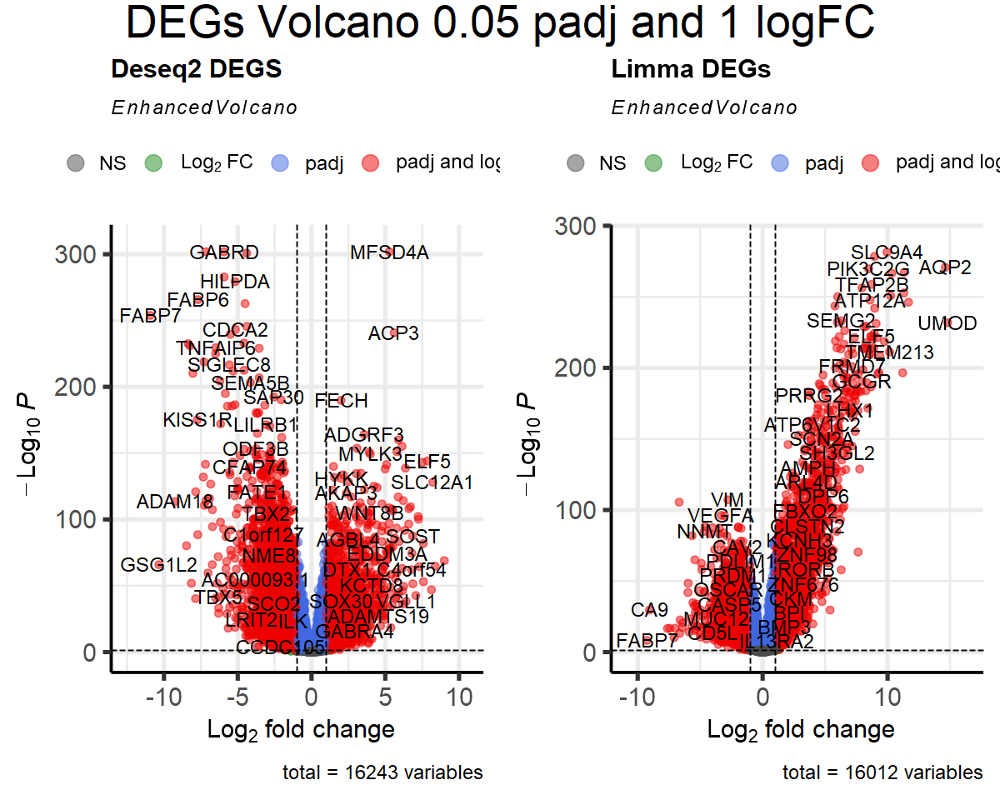

In [229]:
# Enhanced volcano of deseq degs and lima
p1<-EnhancedVolcano(exp_res_deseq,
                lab = rownames(exp_res_deseq),
                x = 'log2FoldChange',
                y = 'padj',
                FCcutoff = 1,
                pCutoff = 0.05,
                title = "Deseq2 DEGS",
                legendLabels = c("NS", expression(Log[2] ~ FC), "padj", expression(padj ~ and
                                                                                   ~ log[2] ~ FC))
)
p2<-EnhancedVolcano(exp_res_lim,
                lab = rownames(exp_res_lim),
                x = 'logFC',
                y = 'adj.P.Val',
                FCcutoff = 1,
                pCutoff = 0.05,
                title = "Limma DEGs",
                legendLabels = c("NS", expression(Log[2] ~ FC), "padj", expression(padj ~ and
                                                                                   ~ log[2] ~ FC))
)
library(gridExtra)
library(grid)
grid.arrange(p1, p2,
             ncol=2,
             top = textGrob('DEGs Volcano 0.05 padj and 1 logFC',
                            just = c('center'),
                            gp = gpar(fontsize = 32)))

Warning message:
"One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value..."


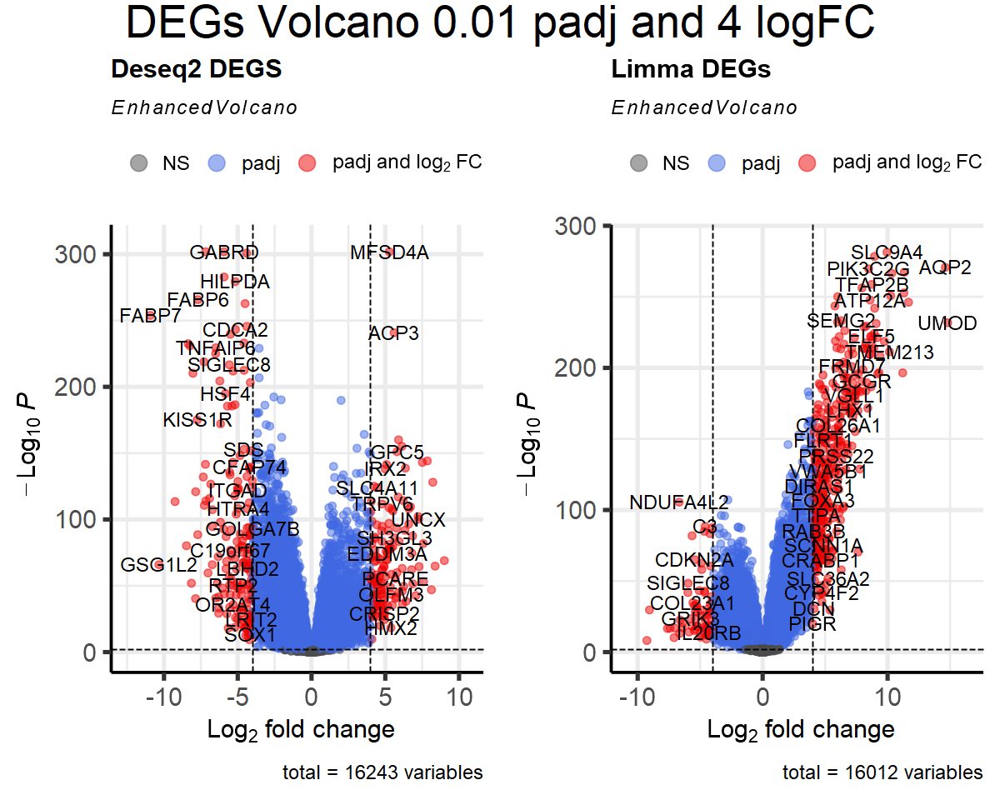

In [230]:
# Enhanced volcano of deseq degs and lima with higher cutoff
p1<-EnhancedVolcano(exp_res_deseq,
                lab = rownames(exp_res_deseq),
                x = 'log2FoldChange',
                y = 'padj',
                FCcutoff = 4,
                pCutoff = 0.01,
                title = "Deseq2 DEGS",
                legendLabels = c("NS", expression(Log[2] ~ FC), "padj", expression(padj ~ and
                                                                                   ~ log[2] ~ FC))
)
p2<-EnhancedVolcano(exp_res_lim,
                lab = rownames(exp_res_lim),
                x = 'logFC',
                y = 'adj.P.Val',
                FCcutoff = 4,
                pCutoff = 0.01,
                title = "Limma DEGs",
                legendLabels = c("NS", expression(Log[2] ~ FC), "padj", expression(padj ~ and
                                                                                   ~ log[2] ~ FC))
)
library(gridExtra)
library(grid)
grid.arrange(p1, p2,
             ncol=2,
             top = textGrob('DEGs Volcano 0.01 padj and 4 logFC',
                            just = c('center'),
                            gp = gpar(fontsize = 32)))

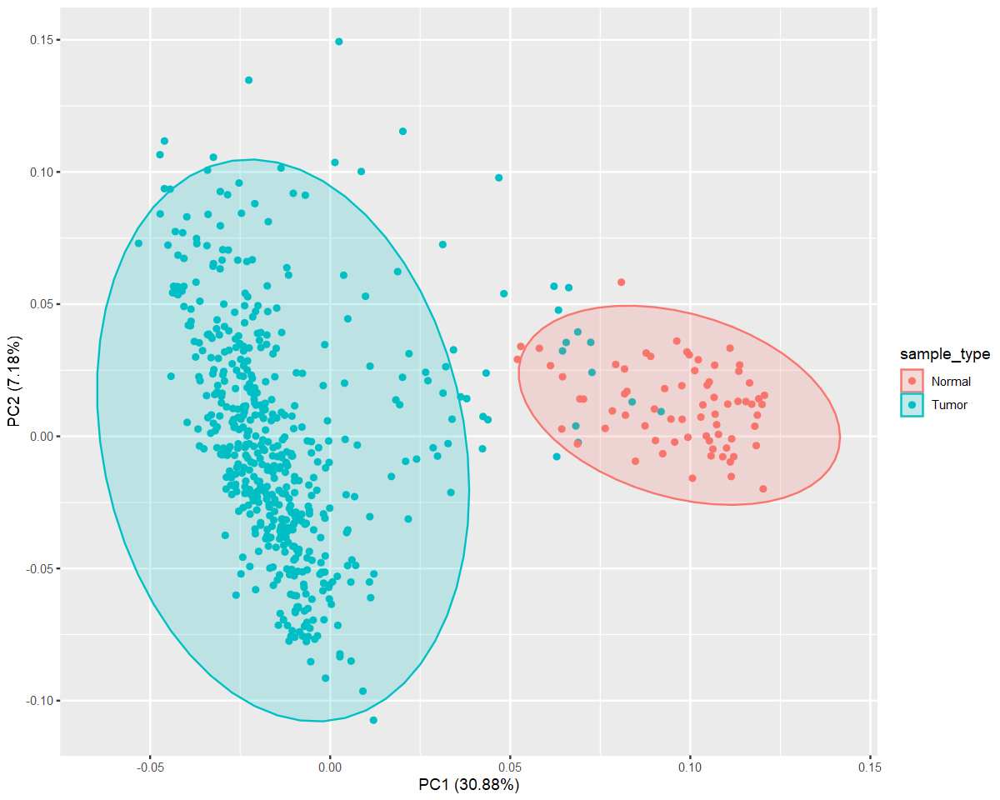

In [231]:
# PCA of data of degs expression
options(repr.plot.width=10,repr.plot.height=8)
degs_pca <- prcomp(t(exp_limv_scaled[com_degs,]))
autoplot(degs_pca, frame.type="norm", data=meta2, colour="sample_type")


The automatically generated colors map from the minus and plus 99^th of
the absolute values in the matrix. There are outliers in the matrix
whose patterns might be hidden by this color mapping. You can manually
set the color to `col` argument.

Use `suppressMessages()` to turn off this message.

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



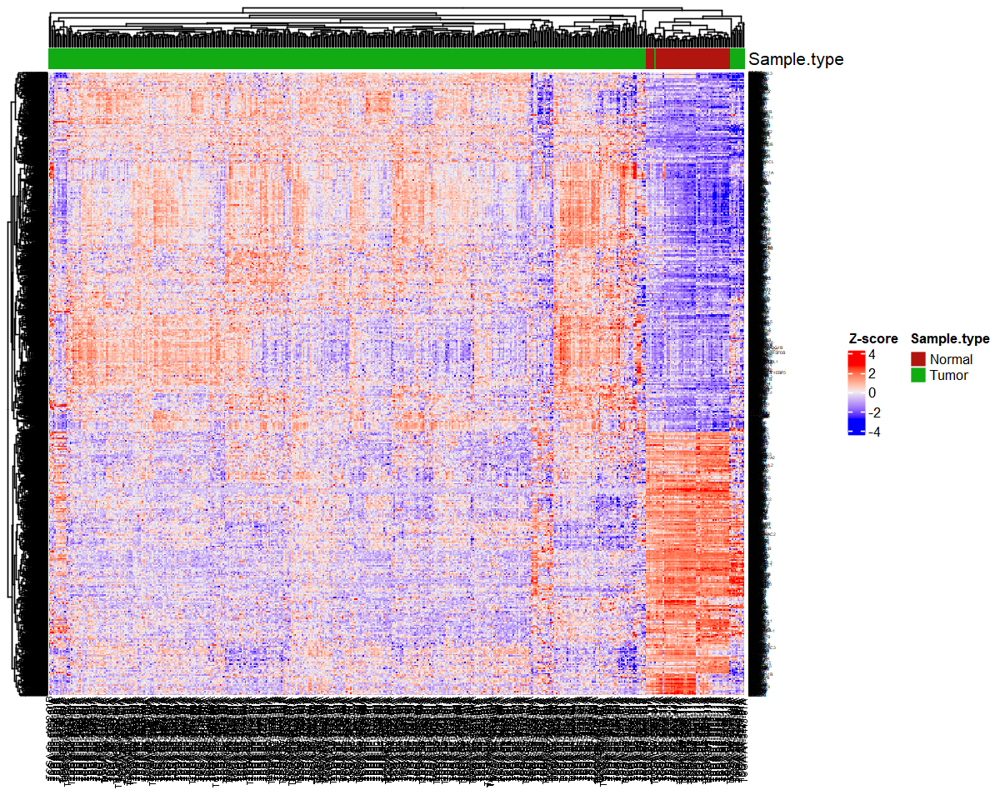

In [232]:
# heatmap of degs of scaled data 
options(repr.plot.width=10,repr.plot.height=8)
column_ha = HeatmapAnnotation(Sample.type = meta2$sample_type)
#Heatmap(exp_deseq[rownames(exp_res.degs),], row_names_gp = gpar(fontsize = 2.5),name="Exp", column_names_gp = gpar(fontsize = 6), top_annotation = column_ha)
Heatmap(exp_limv_scaled[com_degs,],row_names_gp = gpar(fontsize = 2.5),name="Z-score", column_names_gp = gpar(fontsize = 6), top_annotation = column_ha)

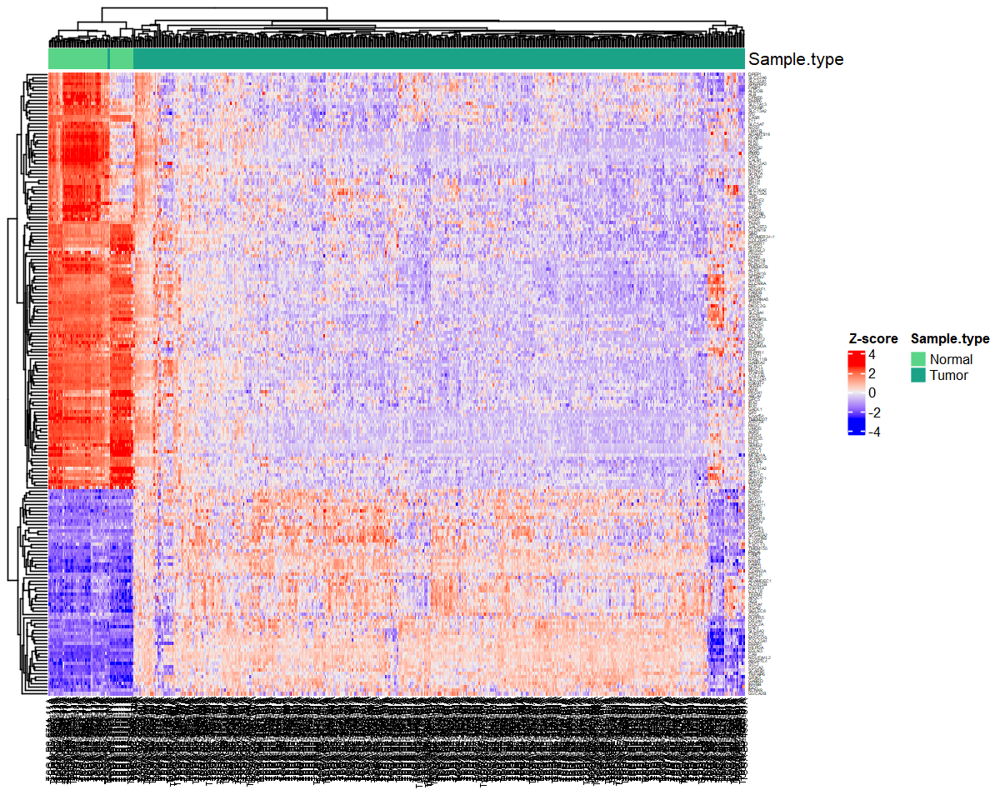

In [233]:
# heatmap of degs with higher cut off 
column_ha = HeatmapAnnotation(Sample.type = meta2$sample_type)
#Heatmap(exp_lim_v$E[com_degs2,], row_names_gp = gpar(fontsize = 2.5),name="Exp", column_names_gp = gpar(fontsize = 6), top_annotation = column_ha)
Heatmap(exp_limv_scaled[com_degs2,],row_names_gp = gpar(fontsize = 2.5),name="Z-score", column_names_gp = gpar(fontsize = 6), top_annotation = column_ha)

### Venn diagram for the common degs between deseq2 and limma

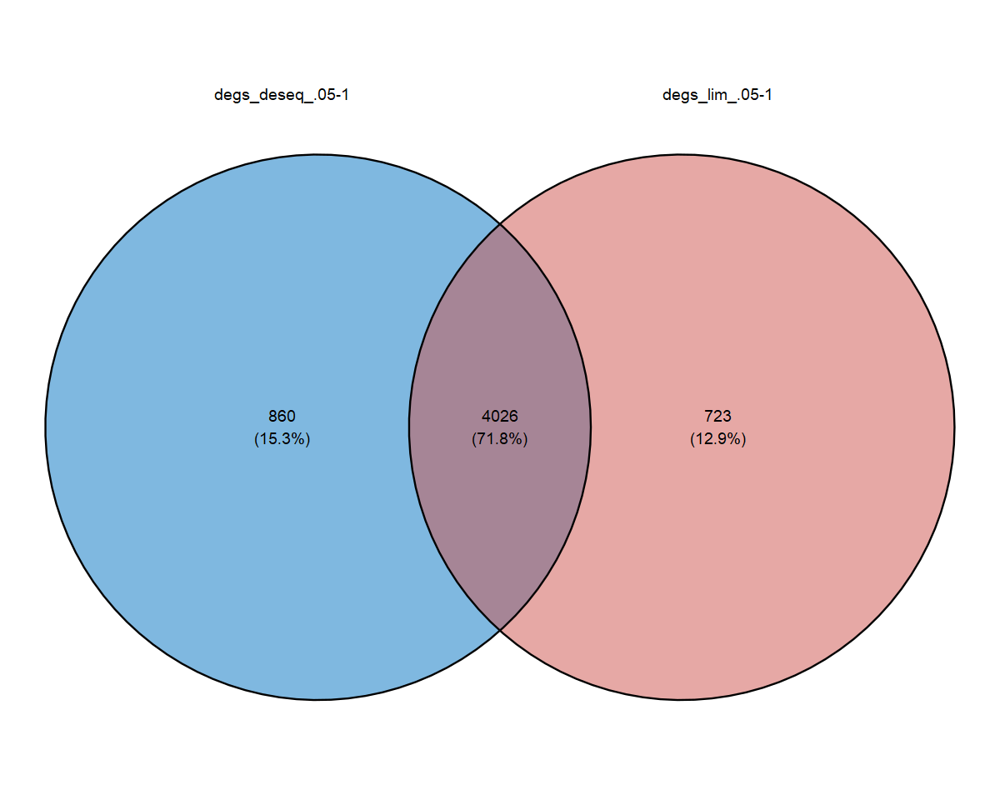

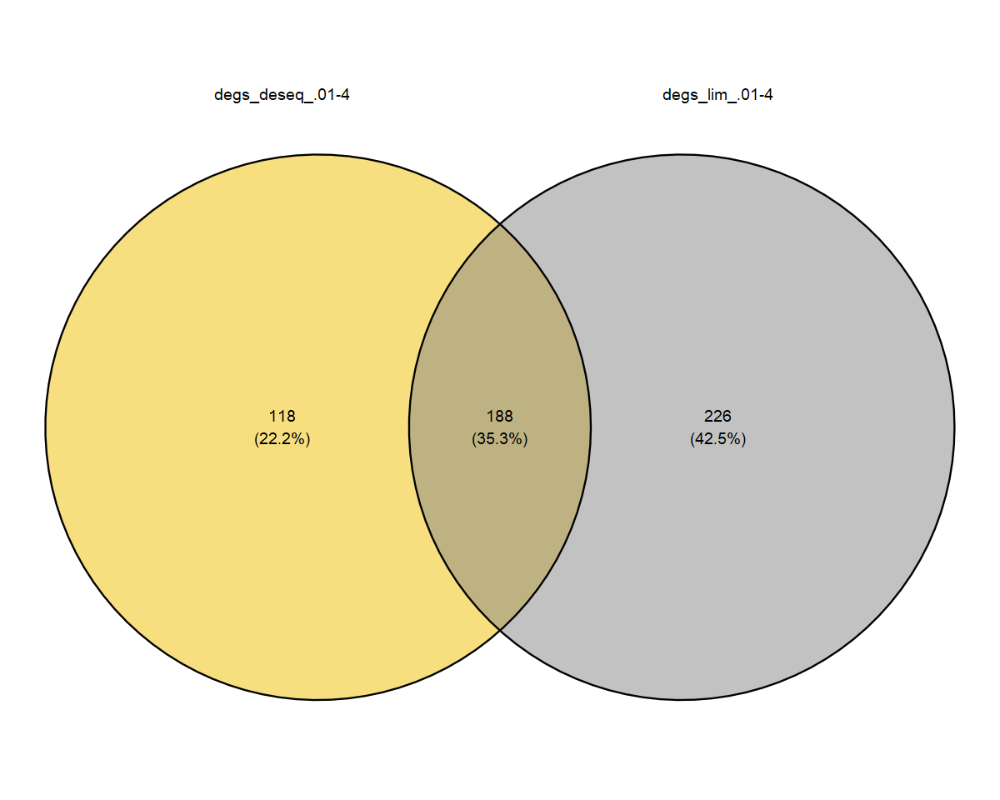

In [234]:
# venn diagram of common degs between deseq and limma
degs_deseq <- as.vector(unlist(degs_deseq))
degs_lim <- as.vector(unlist(degs_lim))

degs <- list(degs_deseq, degs_lim)
names(degs) <- c("degs_deseq_.05-1","degs_lim_.05-1")
degs2 <- list(degs_deseq2, degs_lim2)
names(degs2) <- c("degs_deseq_.01-4","degs_lim_.01-4")

ggvenn(
  degs, 
  fill_color = c("#0073C2FF", "#CD534CFF"),
  stroke_size = 0.5, set_name_size = 4
  )

ggvenn(
  degs2, 
  fill_color = c("#EFC000FF", "#868686FF"),
  stroke_size = 0.5, set_name_size = 4
  )


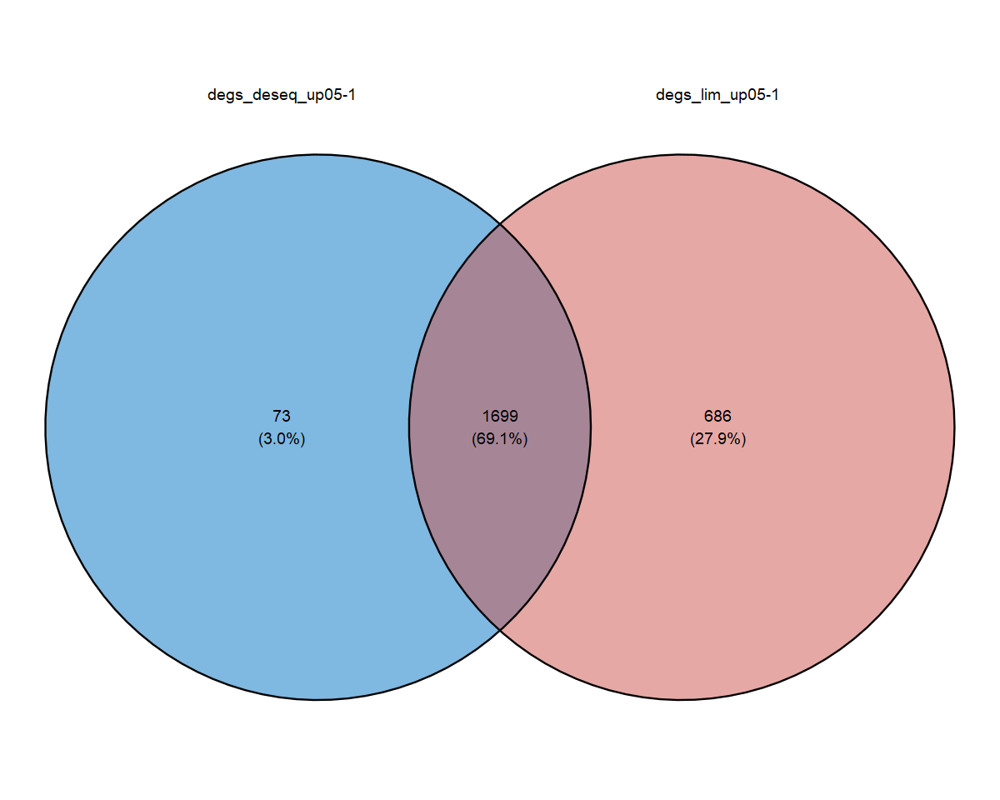

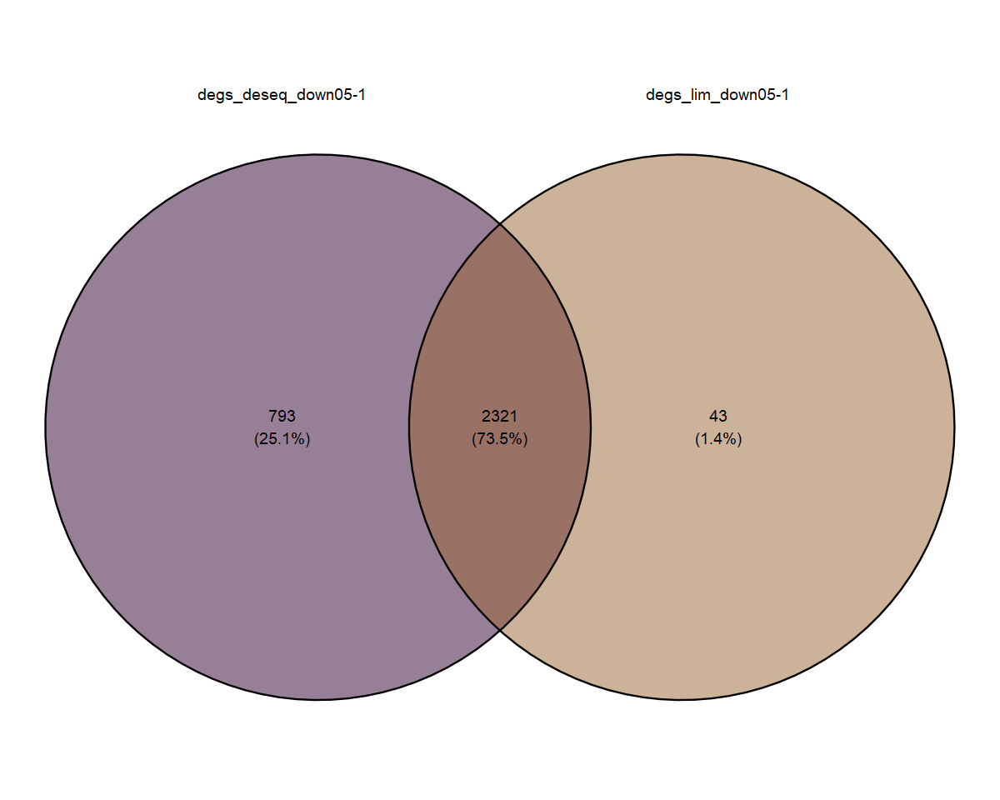

In [235]:
# venn diagram of common degs between deseq and limma up and down regulated

degs_up <- list(degs_deseq_up, degs_lim_up)
names(degs_up) <- c("degs_deseq_up05-1","degs_lim_up05-1")
degs_down <- list(degs_deseq_down, degs_lim_down)
names(degs_down) <- c("degs_deseq_down05-1","degs_lim_down05-1")

ggvenn(
  degs_up, 
  fill_color = c("#0073C2FF", "#CD534CFF"),
  stroke_size = 0.5, set_name_size = 4
  )

ggvenn(
  degs_down, 
  fill_color = c("#330033FF", "#996633FF"),
  stroke_size = 0.5, set_name_size = 4
  )


In [236]:
# save the common degs expression data to be used in other analyses
write.csv(exp_limv_scaled[com_degs,], "common_degs_limma_deseq.csv")